In [ ]:
# Importing Required Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
plt.style.use('seaborn-darkgrid')
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score

# For stationarity test
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import kpss
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Importing the libraries for XGBoost
from sklearn import ensemble
from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb

# Fitting Random Forest Regression to the dataset
from sklearn.ensemble import RandomForestRegressor

In [ ]:
# Importing drive to load the data stored in Google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 1 Bitcoin Price Prediction

## Data Loading and Inspection

In [ ]:
# Reading the csv file of Bitcoin
bitstamp = pd.read_csv("drive/My Drive/Bitcoin_Project/Final Datasets/Bitcoin.csv")
bitstamp.head()

,Index,Date,Currency,Initial,Price (USD),GH Repo,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA (USD),LSE (USD),Gold (USD),Oil (USD)
0,1,01/01/2017,Bitcoin,BTC,998.33,bitcoin/bitcoin,4,3,4,7,1,"19,762.00","7,142.83","1,162.00",54.03
1,2,02/01/2017,Bitcoin,BTC,1021.75,bitcoin/bitcoin,6,6,3,11,3,"19,762.00","7,142.83","1,162.00",54.03
2,3,03/01/2017,Bitcoin,BTC,1043.84,bitcoin/bitcoin,3,6,8,21,7,"19,881.76","7,177.89","1,162.00",52.33
3,4,04/01/2017,Bitcoin,BTC,1154.73,bitcoin/bitcoin,6,5,22,15,11,"19,942.16","7,189.74","1,165.30",53.26
4,5,05/01/2017,Bitcoin,BTC,1013.38,bitcoin/bitcoin,4,4,12,19,10,"19,899.29","7,195.31","1,181.30",53.76


In [ ]:
# getting information about the dataset
bitstamp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2007 entries, 0 to 2006
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Index             2007 non-null   int64  
 1   Date              2007 non-null   object 
 2   Currency          2007 non-null   object 
 3   Initial           2007 non-null   object 
 4    Price (USD)      2007 non-null   float64
 5   GH Repo           2007 non-null   object 
 6   ForkEvent         2007 non-null   int64  
 7   IssuesEvent       2007 non-null   int64  
 8   PullRequestEvent  2007 non-null   int64  
 9   WatchEvent        2007 non-null   int64  
 10  PushEvent         2007 non-null   int64  
 11   DJIA (USD)       2007 non-null   object 
 12   LSE (USD)        2007 non-null   object 
 13   Gold (USD)       2007 non-null   object 
 14   Oil (USD)        2007 non-null   float64
dtypes: float64(2), int64(6), object(7)
memory usage: 235.3+ KB


In [ ]:
# descriptive statistics about the dataset
bitstamp.describe(include='all')

,Index,Date,Currency,Initial,Price (USD),GH Repo,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA (USD),LSE (USD),Gold (USD),Oil (USD)
count,2007.000000,2007,2007,2007,2007.000000,2007,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007,2007,2007,2007.000000
unique,NaN,2007,1,1,NaN,1,NaN,NaN,NaN,NaN,NaN,1382,1385,1210,NaN
top,NaN,01/01/2017,Bitcoin,BTC,NaN,bitcoin/bitcoin,NaN,NaN,NaN,NaN,NaN,"24,103.11","7,547.63","1,196.20",NaN
freq,NaN,1,2007,2007,NaN,2007,NaN,NaN,NaN,NaN,NaN,4,7,7,NaN
mean,1004.000000,NaN,NaN,NaN,17430.377753,NaN,13.072247,4.103139,11.022422,30.757349,3.727952,NaN,NaN,NaN,60.204245
std,579.515315,NaN,NaN,NaN,17464.987638,NaN,10.179019,4.982204,6.886199,25.559998,3.442119,NaN,NaN,NaN,17.940887
min,1.000000,NaN,NaN,NaN,777.760000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,10.010000
25%,502.500000,NaN,NaN,NaN,6222.140000,NaN,7.000000,2.000000,6.000000,16.000000,1.000000,NaN,NaN,NaN,49.885000
50%,1004.000000,NaN,NaN,NaN,9209.290000,NaN,11.000000,3.000000,10.000000,23.000000,3.000000,NaN,NaN,NaN,57.770000
75%,1505.500000,NaN,NaN,NaN,30255.655000,NaN,15.000000,5.000000,15.000000,36.000000,6.000000,NaN,NaN,NaN,68.145000


In [ ]:
# Identification of missing values
bitstamp.isnull().sum()

# No missing values in the dataset

Index               0
Date                0
Currency            0
Initial             0
 Price (USD)        0
GH Repo             0
ForkEvent           0
IssuesEvent         0
PullRequestEvent    0
WatchEvent          0
PushEvent           0
 DJIA (USD)         0
 LSE (USD)          0
 Gold (USD)         0
 Oil (USD)          0
dtype: int64

### Data Handling

In [ ]:

# Currency, Initial and GH Repo can be dropped before training the models
# The models won't learn any important information from these features

# renaming some column names to make analysis easier
bitstamp = bitstamp.rename(columns={' Price (USD) ':'Price',' DJIA (USD) ':'DJIA',' LSE (USD) ':'LSE',' Gold (USD) ':'Gold',' Oil (USD) ':'Oil'})
bitstamp.columns

Index(['Index', 'Date', 'Currency', 'Initial', 'Price', 'GH Repo', 'ForkEvent',
       'IssuesEvent', 'PullRequestEvent', 'WatchEvent', 'PushEvent', 'DJIA',
       'LSE', 'Gold', 'Oil'],
      dtype='object')

In [ ]:
# Checking the values of Currency, Initial and GH Repo
bitstamp['Currency'].value_counts()

Bitcoin    2007
Name: Currency, dtype: int64

In [ ]:
# Checking the values of Currency, Initial and GH Repo
bitstamp['Initial'].value_counts()

BTC    2007
Name: Initial, dtype: int64

In [ ]:
# Checking the values of Currency, Initial and GH Repo
bitstamp['GH Repo'].value_counts()

bitcoin/bitcoin    2007
Name: GH Repo, dtype: int64

In [ ]:
# Dropping the unnecessary columns from the dataset
bitstamp = bitstamp.drop(columns=['Index','Currency','Initial','GH Repo'])
bitstamp.head()

,Date,Price,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil
0,01/01/2017,998.33,4,3,4,7,1,"19,762.00","7,142.83","1,162.00",54.03
1,02/01/2017,1021.75,6,6,3,11,3,"19,762.00","7,142.83","1,162.00",54.03
2,03/01/2017,1043.84,3,6,8,21,7,"19,881.76","7,177.89","1,162.00",52.33
3,04/01/2017,1154.73,6,5,22,15,11,"19,942.16","7,189.74","1,165.30",53.26
4,05/01/2017,1013.38,4,4,12,19,10,"19,899.29","7,195.31","1,181.30",53.76


In [ ]:
# Getting rid of the commas from the dataset to convert the strings to floats
bitstamp = bitstamp.replace(',','', regex=True)
bitstamp.head()

,Date,Price,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil
0,01/01/2017,998.33,4,3,4,7,1,19762.00,7142.83,1162.00,54.03
1,02/01/2017,1021.75,6,6,3,11,3,19762.00,7142.83,1162.00,54.03
2,03/01/2017,1043.84,3,6,8,21,7,19881.76,7177.89,1162.00,52.33
3,04/01/2017,1154.73,6,5,22,15,11,19942.16,7189.74,1165.30,53.26
4,05/01/2017,1013.38,4,4,12,19,10,19899.29,7195.31,1181.30,53.76


In [ ]:
# Converting strings to floats
bitstamp = bitstamp.astype({'DJIA':'float','Gold':'float','LSE':'float','Oil':'float'})
bitstamp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2007 entries, 0 to 2006
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Date              2007 non-null   object 
 1   Price             2007 non-null   float64
 2   ForkEvent         2007 non-null   int64  
 3   IssuesEvent       2007 non-null   int64  
 4   PullRequestEvent  2007 non-null   int64  
 5   WatchEvent        2007 non-null   int64  
 6   PushEvent         2007 non-null   int64  
 7   DJIA              2007 non-null   float64
 8   LSE               2007 non-null   float64
 9   Gold              2007 non-null   float64
 10  Oil               2007 non-null   float64
dtypes: float64(5), int64(5), object(1)
memory usage: 172.6+ KB


In [ ]:
# descriptive statistics about the dataset
bitstamp.describe(include='all')

,Date,Price,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil
count,2007,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000
unique,2007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,01/01/2017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,17430.377753,13.072247,4.103139,11.022422,30.757349,3.727952,27440.167100,7090.837862,1535.141256,60.204245
std,NaN,17464.987638,10.179019,4.982204,6.886199,25.559998,3.442119,4602.059976,525.839133,265.680739,17.940887
min,NaN,777.760000,0.000000,0.000000,0.000000,0.000000,0.000000,18591.930000,4993.890000,1162.000000,10.010000
25%,NaN,6222.140000,7.000000,2.000000,6.000000,16.000000,1.000000,24360.830000,6963.890000,1283.400000,49.885000
50%,NaN,9209.290000,11.000000,3.000000,10.000000,23.000000,3.000000,26355.470000,7247.080000,1487.500000,57.770000
75%,NaN,30255.655000,15.000000,5.000000,15.000000,36.000000,6.000000,31035.220000,7441.525000,1802.400000,68.145000


### Data Exploration

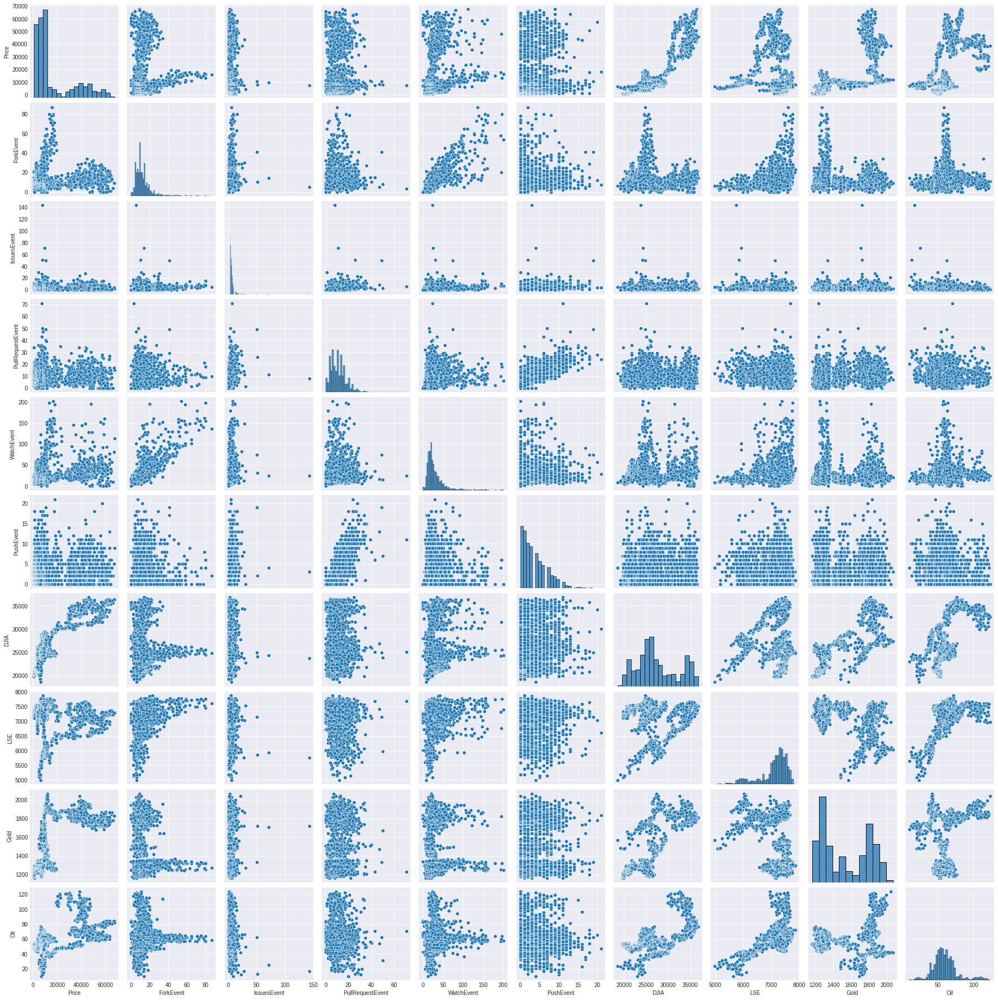

In [ ]:
# generating a pariplot of Bitcoin dataset to see the correlationships between all the variables
sns.pairplot(data=bitstamp)

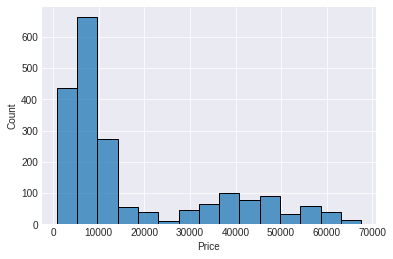

In [ ]:
# Distribution of the Bitcoin price in the dataset
sns.histplot(x='Price',bins=15,data=bitstamp)
# the histogram shows the distribution of the Bitcoin price
# from the plot it is seen that most of the coins have a price range of 0 to 10,000

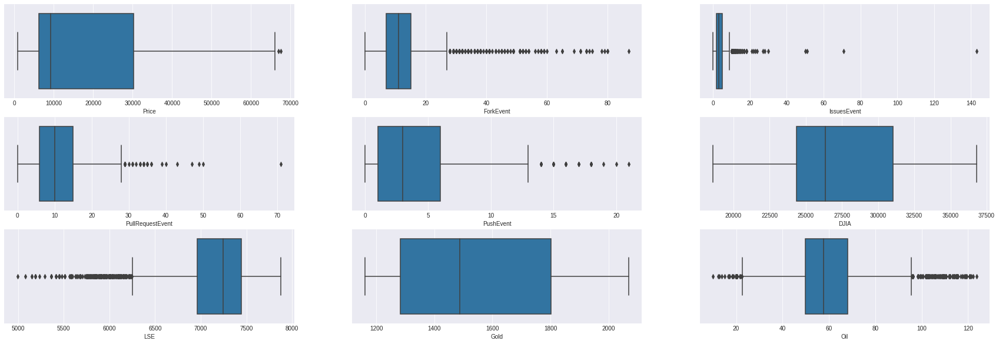

In [ ]:
# Drawing barplots of the features to see outliers

fig, axs = plt.subplots(3, 3, figsize=(30, 10), sharey=True)
sns.boxplot(x=bitstamp['Price'], data=bitstamp, ax=axs[0,0])
sns.boxplot(x=bitstamp['ForkEvent'], data=bitstamp, ax=axs[0,1])
sns.boxplot(x=bitstamp['IssuesEvent'], data=bitstamp, ax=axs[0,2])
sns.boxplot(x=bitstamp['PullRequestEvent'], data=bitstamp, ax=axs[1,0])
sns.boxplot(x=bitstamp['PushEvent'], data=bitstamp, ax=axs[1,1])
sns.boxplot(x=bitstamp['DJIA'], data=bitstamp, ax=axs[1,2])
sns.boxplot(x=bitstamp['LSE'], data=bitstamp, ax=axs[2,0])
sns.boxplot(x=bitstamp['Gold'], data=bitstamp, ax=axs[2,1])
sns.boxplot(x=bitstamp['Oil'], data=bitstamp, ax=axs[2,2])

A boxplot is a good way of visualising the distribution of numeric features in the dataset. It not only shows us the distribution but also the interquartile range of features and also helps us detect outliers in the dataset. In the plot above I have generated boxplots of 'Price', 'ForkEvent', 'IssuesEvent', 'PullRequestEvent', 'PushEvent', 'DJIA', 'LSE', 'Gold' and 'Oil'.

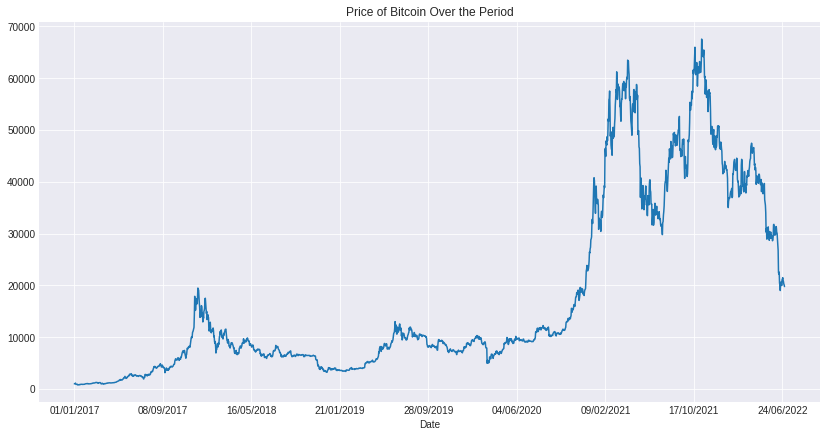

In [ ]:
# Some data analysis
bitstamp.set_index("Date").Price.plot(figsize=(14,7), title="Price of Bitcoin Over the Period")
# this is time series plot that shows how the price of Bitcoin vaired over the period of the collected data

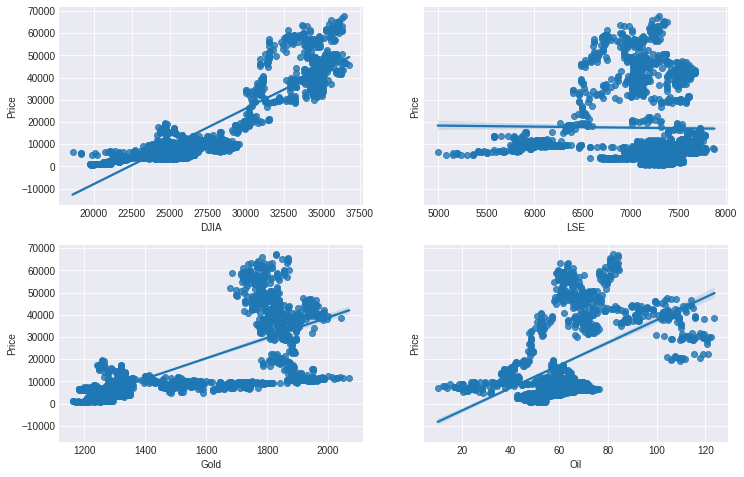

In [ ]:
# Impact of DJIA, LSE, Gold and Oil on Bitcoin price

fig, axs = plt.subplots(2, 2, figsize=(12, 8), sharey=True)
sns.regplot(x=bitstamp['DJIA'], y=bitstamp['Price'], ax=axs[0, 0])
sns.regplot(x=bitstamp['LSE'], y=bitstamp['Price'], ax=axs[0, 1])
sns.regplot(x=bitstamp['Gold'], y=bitstamp['Price'], ax=axs[1, 0])
sns.regplot(x=bitstamp['Oil'], y=bitstamp['Price'], ax=axs[1, 1])

A Regression Plot allows us to identify the correlationship of features. In the above plot I have generated Regression Plots of DJIA, LSE, Gold and Oil against Bitcoin Price to see how these features impact the models. From the plot, it can be seen that, in case of DJIA, Gold and Oil as their values increase so does the value of price so these three features are positively correlated but LSE is negatively correlated with the Price of Bitcooin.

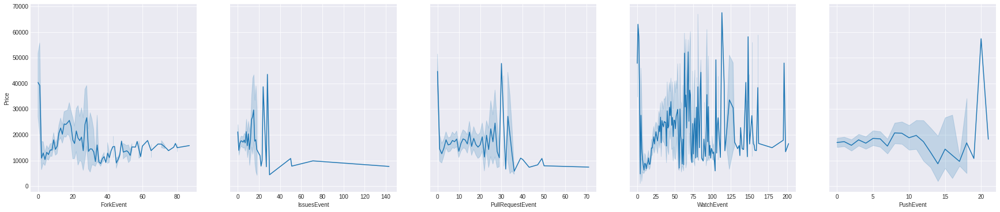

In [ ]:
# ForkEvent	IssuesEvent	PullRequestEvent	WatchEvent	PushEvent	against Bitcoin price

fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(ncols=5, sharey=True, figsize=(30,6))
sns.lineplot(x=bitstamp['ForkEvent'], y=bitstamp['Price'], ax=ax1)
sns.lineplot(x=bitstamp['IssuesEvent'], y=bitstamp['Price'], ax=ax2)
sns.lineplot(x=bitstamp['PullRequestEvent'], y=bitstamp['Price'], ax=ax3)
sns.lineplot(x=bitstamp['WatchEvent'], y=bitstamp['Price'], ax=ax4)
sns.lineplot(x=bitstamp['PushEvent'], y=bitstamp['Price'], ax=ax5)

Like regression plots line plots also tell us the correlationships between each of the features. In the above plot I have generated lineplots of ForkEvent, IssuesEvent, PullRequestEvent, WatchEvent and PushEvent. The results show that as their valuse increases the bitcoin prices fall.

Text(0.5, 1.0, '1-Month Lag')

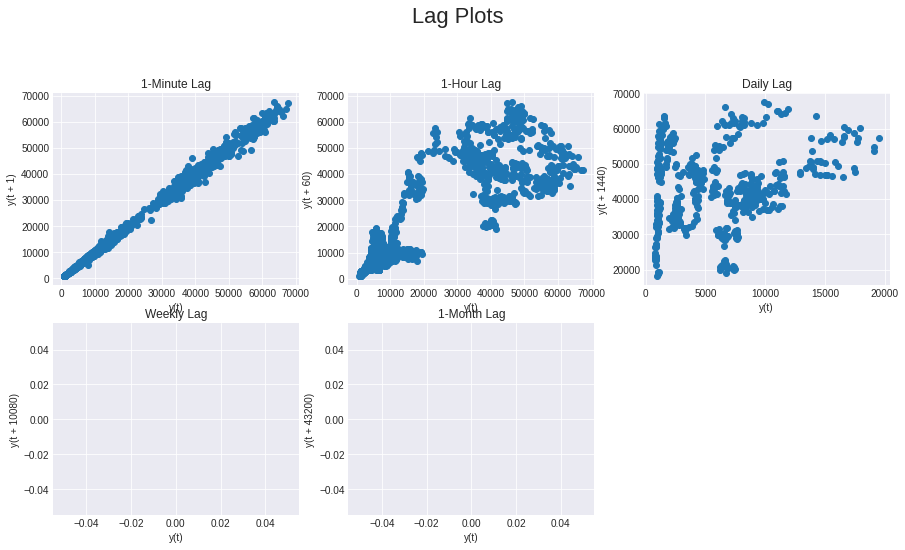

In [ ]:
# Since we are working with time series data let's do some lag plots

#daily, weekly, monthly these can't be plotted

plt.figure(figsize=(15,12))
plt.suptitle('Lag Plots', fontsize=22)

plt.subplot(3,3,1)
pd.plotting.lag_plot(bitstamp['Price'], lag=1) #minute lag
plt.title('1-Minute Lag')

plt.subplot(3,3,2)
pd.plotting.lag_plot(bitstamp['Price'], lag=60) #hourley lag
plt.title('1-Hour Lag')

plt.subplot(3,3,3)
pd.plotting.lag_plot(bitstamp['Price'], lag=1440) #Daily lag
plt.title('Daily Lag')

plt.subplot(3,3,4)
pd.plotting.lag_plot(bitstamp['Price'], lag=10080) #weekly lag
plt.title('Weekly Lag')

plt.subplot(3,3,5)
pd.plotting.lag_plot(bitstamp['Price'], lag=43200) #month lag
plt.title('1-Month Lag')

### Stationarity Check

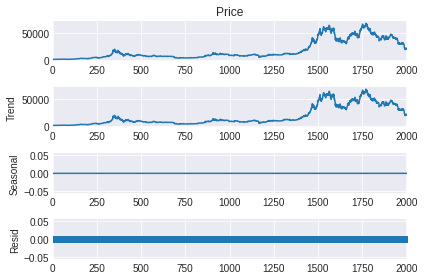

<Figure size 1080x864 with 0 Axes>

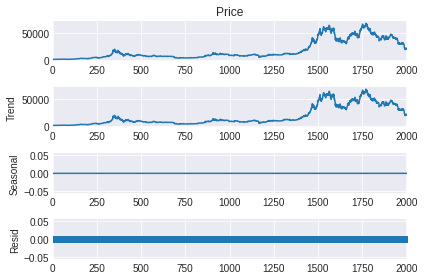

In [ ]:
plt.figure(figsize=(15,12))
series = bitstamp.Price
result = seasonal_decompose(series, model='additive',period=1)
result.plot()

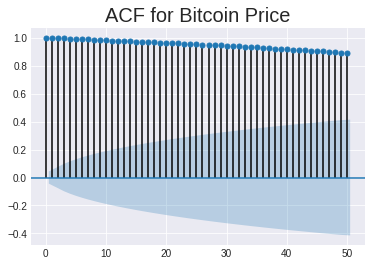

In [ ]:
acf = plot_acf(series, lags=50, alpha=0.05)
plt.title("ACF for Bitcoin Price", size=20)
plt.show()

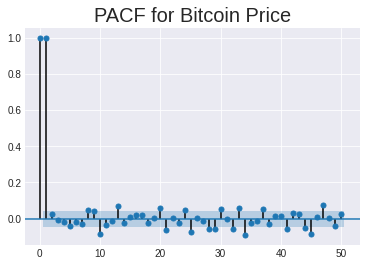

In [ ]:
plot_pacf(series, lags=50, alpha=0.05, method='ols')
plt.title("PACF for Bitcoin Price", size=20)
plt.show()

#### KPSS Test

In [ ]:
# Null hypothesis = Series is Stationary
# Alternative Hypothesis - Series is not Stationary

stats, p, lags, critical_values = kpss(series, 'ct')

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1875: FutureWarning: The behavior of using nlags=None will change in release 0.13.Currently nlags=None is the same as nlags="legacy", and so a sample-size lag length is used. After the next release, the default will change to be the same as nlags="auto" which uses an automatic lag length selection method. To silence this warning, either use "auto" or "legacy"
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1907: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warn_msg.format(direction="smaller"), InterpolationWarning


In [ ]:
print(f'Test Statistics : {stats}')
print(f'p-value : {p}')
print(f'Critical Values : {critical_values}')

if p < 0.05:
    print('Series is not Stationary')
else:
    print('Series is Stationary')

Test Statistics : 0.8755555480432611
p-value : 0.01
Critical Values : {'10%': 0.119, '5%': 0.146, '2.5%': 0.176, '1%': 0.216}
Series is not Stationary


#### ADF Test

In [ ]:
result = adfuller(series)

In [ ]:
print(f'Test Statistics : {result[0]}')
print(f'p-value : {result[1]}')
print(f'Critical Values : {result[4]}')
print(f'Lags : {result[5]}')

if result[1] > 0.05:
    print('Series is not Stationary')
else:
    print('Series is Stationary')

Test Statistics : -1.5041794475838317
p-value : 0.5314428220732846
Critical Values : {'1%': -3.4336536273681078, '5%': -2.862999357426174, '10%': -2.567546900734257}
Lags : 32814.90599718683
Series is not Stationary


### Feature Engineering

In [ ]:
# We can extract important features from the Date column
# first we need to convert the Date to datetime format
bitstamp['Date'] = pd.to_datetime(bitstamp['Date'])
bitstamp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2007 entries, 0 to 2006
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Date              2007 non-null   datetime64[ns]
 1   Price             2007 non-null   float64       
 2   ForkEvent         2007 non-null   int64         
 3   IssuesEvent       2007 non-null   int64         
 4   PullRequestEvent  2007 non-null   int64         
 5   WatchEvent        2007 non-null   int64         
 6   PushEvent         2007 non-null   int64         
 7   DJIA              2007 non-null   float64       
 8   LSE               2007 non-null   float64       
 9   Gold              2007 non-null   float64       
 10  Oil               2007 non-null   float64       
dtypes: datetime64[ns](1), float64(5), int64(5)
memory usage: 172.6 KB


In [ ]:
# Creation of the features and adding them to the dataset
bitstamp["year"] = bitstamp.Date.dt.year
bitstamp["month"] = bitstamp.Date.dt.month
bitstamp["day"] = bitstamp.Date.dt.day
bitstamp["day_of_week"] = bitstamp.Date.dt.dayofweek
bitstamp.head()

,Date,Price,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil,year,month,day,day_of_week
0,2017-01-01,998.33,4,3,4,7,1,19762.00,7142.83,1162.0,54.03,2017,1,1,6
1,2017-02-01,1021.75,6,6,3,11,3,19762.00,7142.83,1162.0,54.03,2017,2,1,2
2,2017-03-01,1043.84,3,6,8,21,7,19881.76,7177.89,1162.0,52.33,2017,3,1,2
3,2017-04-01,1154.73,6,5,22,15,11,19942.16,7189.74,1165.3,53.26,2017,4,1,5
4,2017-05-01,1013.38,4,4,12,19,10,19899.29,7195.31,1181.3,53.76,2017,5,1,0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  after removing the cwd from sys.path.


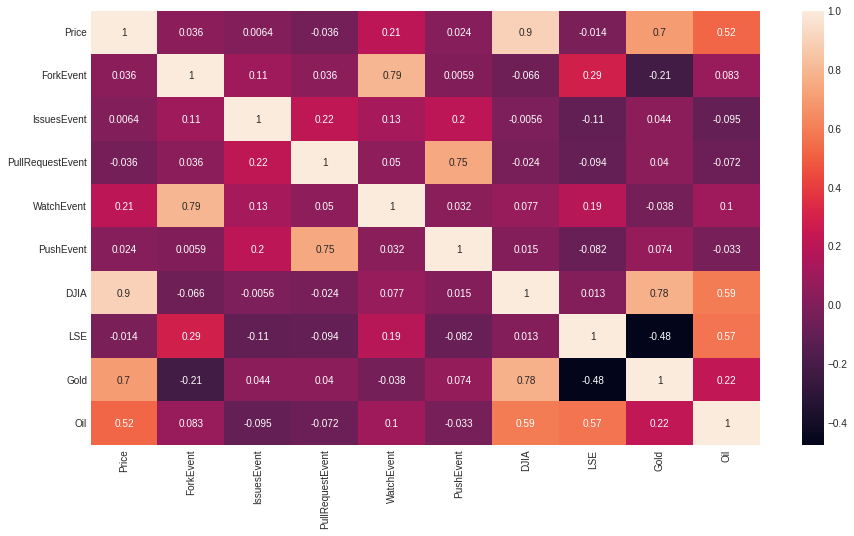

In [ ]:
# Lets have a look at the correlation matrix of all the features (except date)
corr = bitstamp.drop(columns=['Date','year','month','day','day_of_week'])
corr = corr.corr()
corr.style.background_gradient(cmap='PuOr_r').set_precision(2)
plt.figure(figsize=(15,8))
sns.heatmap(corr, annot=True)
# This plot shows pearsons correlation coefficitnt values of each features. Values close to 1 means strong relation
# negative values mean weak correlation

### Data Preparation

In [ ]:
# we need to split our data into train and test sets
# the first step we are taking price as y and the rest of the features as X
X = bitstamp.drop(columns=['Price','Date'])
y = bitstamp['Price']
X.head()

,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil,year,month,day,day_of_week
0,4,3,4,7,1,19762.00,7142.83,1162.0,54.03,2017,1,1,6
1,6,6,3,11,3,19762.00,7142.83,1162.0,54.03,2017,2,1,2
2,3,6,8,21,7,19881.76,7177.89,1162.0,52.33,2017,3,1,2
3,6,5,22,15,11,19942.16,7189.74,1165.3,53.26,2017,4,1,5
4,4,4,12,19,10,19899.29,7195.31,1181.3,53.76,2017,5,1,0


In [ ]:
y.head()

0     998.33
1    1021.75
2    1043.84
3    1154.73
4    1013.38
Name: Price, dtype: float64

In [ ]:
# Then we are splitting the data into training and test sets with a train size of 60%
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, train_size = 0.6)

## XGBoost

In [ ]:
# creating the regressor model
reg = xgb.XGBRegressor()

In [ ]:
## Hyper Parameter Optimization Grid

params={
 "learning_rate"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30],
 "max_depth"        : [1, 3, 4, 5, 6, 7],
 "n_estimators"     : [int(x) for x in np.linspace(start=100, stop=2000, num=10)],
 "min_child_weight" : [int(x) for x in np.arange(3, 15, 1)],
 "gamma"            : [ 0.0, 0.1, 0.2 , 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1],
 "subsample"        : [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1],
 "colsample_bytree" : [0.5, 0.6, 0.7, 0.8, 0.9, 1],
 "colsample_bylevel": [0.5, 0.6, 0.7, 0.8, 0.9, 1],  
 
}

In [ ]:
# Model with the grid search parameters
model  = RandomizedSearchCV(    
                reg,
                param_distributions=params,
                n_iter=10,
                n_jobs=-1,
                cv=5,
                verbose=3,
)

In [ ]:
# fitting the model
model.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[17:43:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


RandomizedSearchCV(cv=5, estimator=XGBRegressor(), n_jobs=-1,
                   param_distributions={'colsample_bylevel': [0.5, 0.6, 0.7,
                                                              0.8, 0.9, 1],
                                        'colsample_bytree': [0.5, 0.6, 0.7, 0.8,
                                                             0.9, 1],
                                        'gamma': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5,
                                                  0.6, 0.7, 0.8, 0.9, 1],
                                        'learning_rate': [0.05, 0.1, 0.15, 0.2,
                                                          0.25, 0.3],
                                        'max_depth': [1, 3, 4, 5, 6, 7],
                                        'min_child_weight': [3, 4, 5, 6, 7, 8,
                                                             9, 10, 11, 12, 13,
                                                             14],
                                

In [ ]:
# evaluation of the model on train and test sets of data
y_train_pred_xgb = model.predict(X_train)

xgb_train_mae = mean_absolute_error(y_train, y_train_pred_xgb)
xgb_train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred_xgb))
xgb_train_mape = mean_absolute_percentage_error(y_train, y_train_pred_xgb)
xgb_train_r2 = r2_score(y_train, y_train_pred_xgb)

print(f"Train MAE XGBoost on Bitcoin Dataset: {xgb_train_mae}")
print(f"Train MAPE XGBoost on Bitcoin Dataset: {xgb_train_mape}")
print(f"Train RMSE XGBoost on Bitcoin Dataset: {xgb_train_rmse}")
print(f"Train R2 XGBoost on Bitcoin Dataset: {xgb_train_r2}")

Train MAE XGBoost on Bitcoin Dataset: 4.781355901065497
Train MAPE XGBoost on Bitcoin Dataset: 0.0007531841975956992
Train RMSE XGBoost on Bitcoin Dataset: 7.063918809455794
Train R2 XGBoost on Bitcoin Dataset: 0.9999998417084947


In [ ]:
y_test_pred_xgb = model.predict(X_test)

test_mae_xgb = mean_absolute_error(y_test, y_test_pred_xgb)
test_mape_xgb = mean_absolute_percentage_error(y_test, y_test_pred_xgb)
test_rmse_xgb = np.sqrt(mean_squared_error(y_test, y_test_pred_xgb))
test_r2_xgb = r2_score(y_test, y_test_pred_xgb)

print(f"Test MAE of XGBoost on Bitcoin Dataset: {test_mae_xgb}")
print(f"Test MAPE of XGBoost on Bitcoin Dataset: {test_mape_xgb}")
print(f"Test RMSE of XGBoost on Bitcoin Dataset: {test_rmse_xgb}")
print(f"Test R2 XGBoost on Bitcoin Dataset: {test_r2_xgb}")

Test MAE of XGBoost on Bitcoin Dataset: 981.2945661320099
Test MAPE of XGBoost on Bitcoin Dataset: 0.07232727880551691
Test RMSE of XGBoost on Bitcoin Dataset: 1690.1308833368134
Test R2 XGBoost on Bitcoin Dataset: 0.9901273564660004


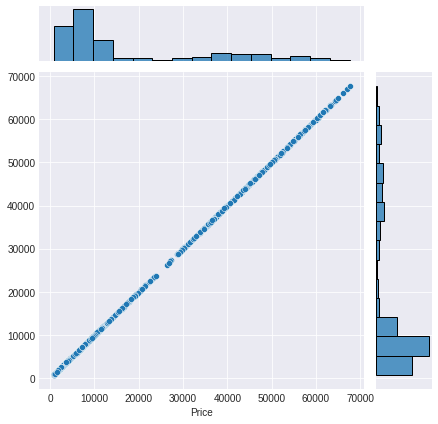

In [ ]:
# True vs Predicted plot of XGB model on the Train and Test data
sns.jointplot(x=y_train, y=y_train_pred_xgb)

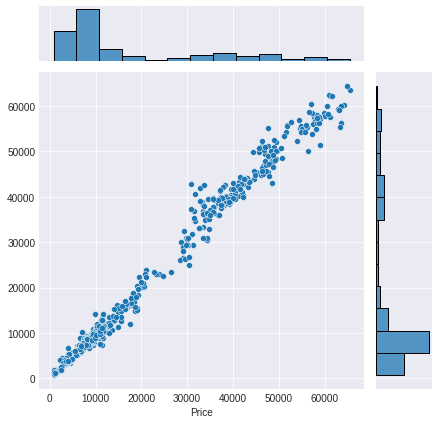

In [ ]:
sns.jointplot(x=y_test, y=y_test_pred_xgb)

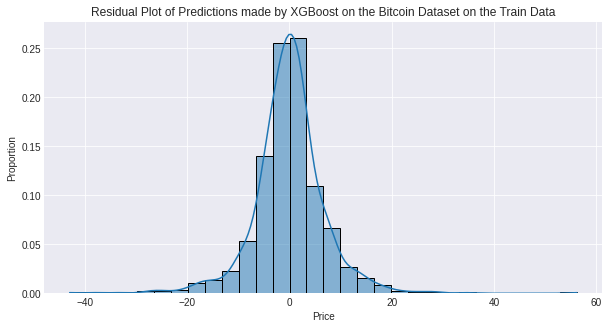

In [ ]:
#Residual Plots of Train and Test sets of xgb Model
plt.figure(figsize=(10,5))
plt.title("Residual Plot of Predictions made by XGBoost on the Bitcoin Dataset on the Train Data")
residuals_df = y_train_pred_xgb - y_train
sns.histplot(x = residuals_df, kde=True, stat='proportion', bins=30)

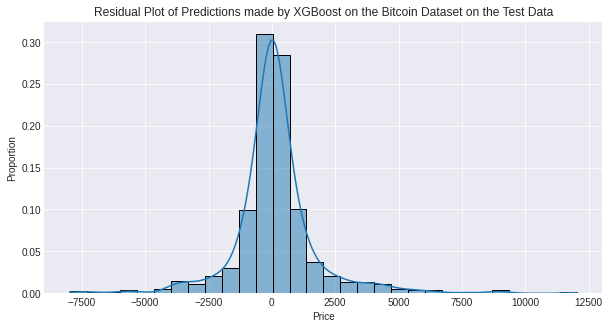

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Residual Plot of Predictions made by XGBoost on the Bitcoin Dataset on the Test Data")
residuals_df = y_test_pred_xgb - y_test
sns.histplot(x = residuals_df, kde=True, stat='proportion', bins=30)

## Random Forest

In [ ]:
# create regressor object
rf_reg = RandomForestRegressor()
  
# fit the regressor with x and y data
rf_reg.fit(X_train, y_train) 

RandomForestRegressor()

In [ ]:
# evaluation of the model on train and test sets of data
y_train_pred_rf = rf_reg.predict(X_train)

rf_train_mae = mean_absolute_error(y_train, y_train_pred_rf)
rf_train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred_rf))
rf_train_mape = mean_absolute_percentage_error(y_train, y_train_pred_rf)
rf_train_r2 = r2_score(y_train, y_train_pred_rf)

print(f"Train MAE Random Forest Regressor on Bitcoin Dataset: {rf_train_mae}")
print(f"Train MAPE Random Forest Regressor on Bitcoin Dataset: {rf_train_mape}")
print(f"Train RMSE Random Forest Regressor on Bitcoin Dataset: {rf_train_rmse}")
print(f"Train R2 Random Forest Regressor on Bitcoin Dataset: {rf_train_r2}")

Train MAE Random Forest Regressor on Bitcoin Dataset: 396.25104900332093
Train MAPE Random Forest Regressor on Bitcoin Dataset: 0.025806845548444788
Train RMSE Random Forest Regressor on Bitcoin Dataset: 748.518449586791
Train R2 Random Forest Regressor on Bitcoin Dataset: 0.9982226570738975


In [ ]:
y_test_pred_rf = rf_reg.predict(X_test)

test_mae_rf = mean_absolute_error(y_test, y_test_pred_rf)
test_mape_rf = mean_absolute_percentage_error(y_test, y_test_pred_rf)
test_rmse_rf = np.sqrt(mean_squared_error(y_test, y_test_pred_rf))
test_r2_rf = r2_score(y_test, y_test_pred_rf)

print(f"Test MAE of Random Forest Regressor on Bitcoin Dataset: {test_mae_rf}")
print(f"Test MAPE of Random Forest Regressor on Bitcoin Dataset: {test_mape_rf}")
print(f"Test RMSE of Random Forest Regressor on Bitcoin Dataset: {test_rmse_rf}")
print(f"Test R2 Random Forest Regressor on Bitcoin Dataset: {test_r2_rf}")

Test MAE of Random Forest Regressor on Bitcoin Dataset: 1105.353406600249
Test MAPE of Random Forest Regressor on Bitcoin Dataset: 0.07243475493626496
Test RMSE of Random Forest Regressor on Bitcoin Dataset: 1885.9614381156732
Test R2 Random Forest Regressor on Bitcoin Dataset: 0.9877069853713965


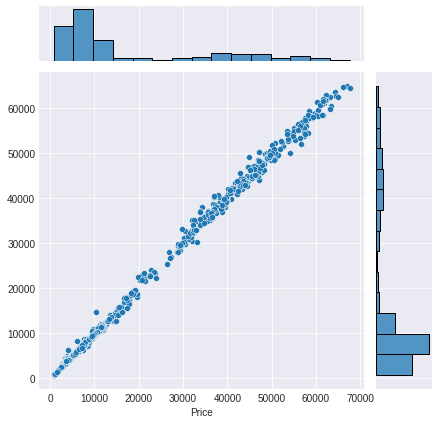

In [ ]:
# True vs Predicted plot of RF model on the Train and Test data
sns.jointplot(x=y_train, y=y_train_pred_rf)

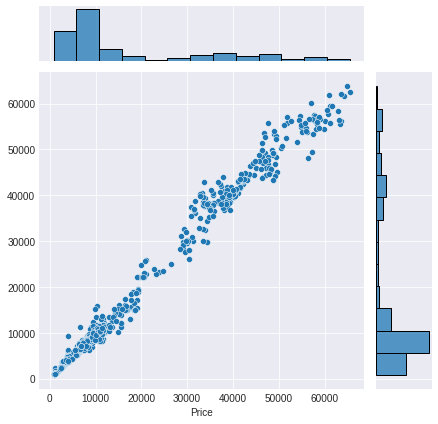

In [ ]:
# True vs Predicted plot of RF model on the Train and Test data
sns.jointplot(x=y_test, y=y_test_pred_rf)

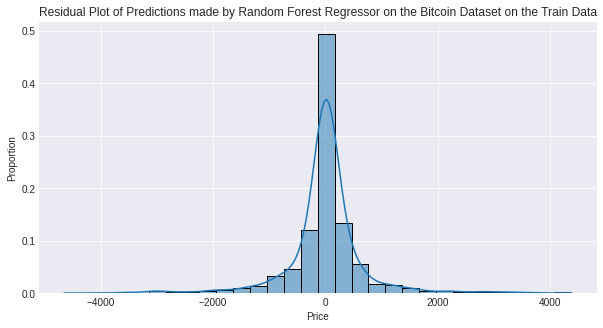

In [ ]:
#Residual Plots of Train and Test sets of RF Model
plt.figure(figsize=(10,5))
plt.title("Residual Plot of Predictions made by Random Forest Regressor on the Bitcoin Dataset on the Train Data")
residuals_df = y_train_pred_rf - y_train
sns.histplot(x = residuals_df, kde=True, stat='proportion', bins=30)

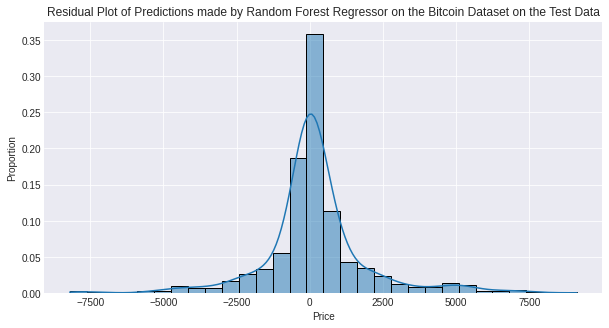

In [ ]:
#Residual Plots of Train and Test sets of RF Model
plt.figure(figsize=(10,5))
plt.title("Residual Plot of Predictions made by Random Forest Regressor on the Bitcoin Dataset on the Test Data")
residuals_df = y_test_pred_rf - y_test
sns.histplot(x = residuals_df, kde=True, stat='proportion', bins=30)

## Summary of Results

In [ ]:
# Summarisation of the Model Results
models = ['XGBoost','Random Forest Regressor']
mae = [test_mae_xgb, test_mae_rf]
rmse = [test_rmse_xgb, test_rmse_rf]
mape = [test_mape_xgb, test_mape_rf]
r2 = [test_r2_xgb, test_r2_rf]

In [ ]:
# Creating a dictionary to store the results 
d = {'Models':models, 'MAE':mae, 'MAPE':mape, 'RMSE':rmse, 'R2-Score':r2}

# using that dictionary to create a dataframe of the results to display as a table
result = pd.DataFrame(d)
result

,Models,MAE,MAPE,RMSE,R2-Score
0,XGBoost,981.294566,0.072327,1690.130883,0.990127
1,Random Forest Regressor,1105.353407,0.072435,1885.961438,0.987707


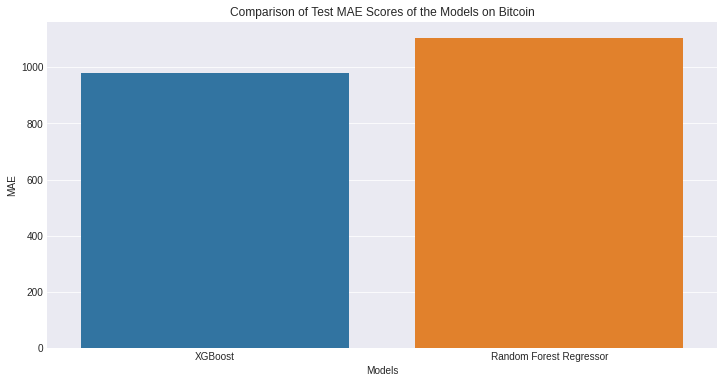

In [ ]:
# Displaying the models MAE values as a bar plot
plt.figure(figsize=(12,6))
plt.title("Comparison of Test MAE Scores of the Models on Bitcoin")
sns.barplot(x="Models", y="MAE", data=result, ci=None)

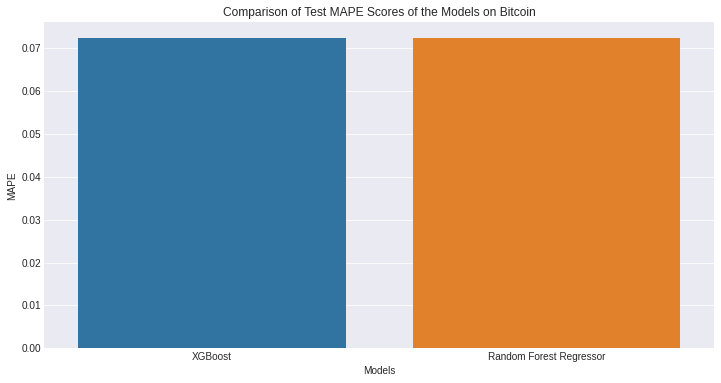

In [ ]:
# comparison of MAPE values of the models on the test set
plt.figure(figsize=(12,6))
plt.title("Comparison of Test MAPE Scores of the Models on Bitcoin")
sns.barplot(x="Models", y="MAPE", data=result, ci=None)

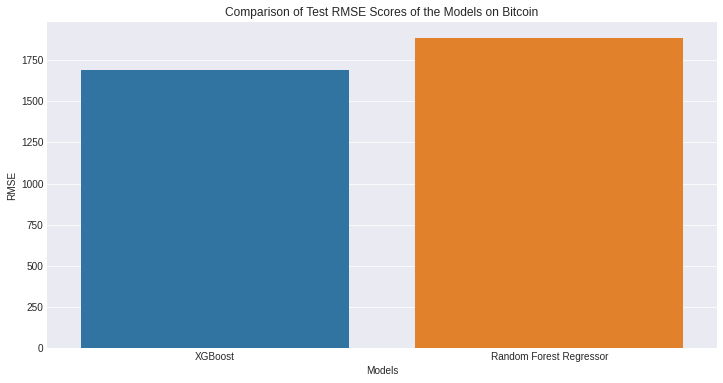

In [ ]:
# Displaying the models RMSE values as a bar plot
plt.figure(figsize=(12,6))
plt.title("Comparison of Test RMSE Scores of the Models on Bitcoin")
sns.barplot(x="Models", y="RMSE", data=result, ci=None)

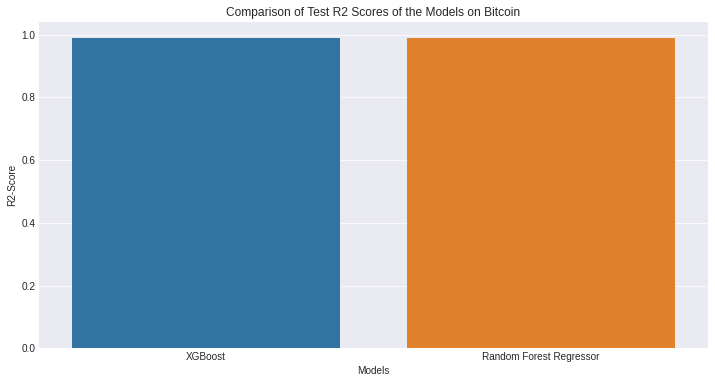

In [ ]:
# Displaying the models R2 values as a bar plot
plt.figure(figsize=(12,6))
plt.title("Comparison of Test R2 Scores of the Models on Bitcoin")
sns.barplot(x="Models", y="R2-Score", data=result, ci=None)

# 2 Ethereum Price Prediction

## Data Loading and Inspection

In [ ]:
# Reading the csv file of Bitcoin
ethstamp = pd.read_csv("drive/My Drive/Bitcoin_Project/Final Datasets/Ethereum.csv")
ethstamp.head()

,Index,Date,Currency,Initial,Price (USD),GH Repo,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA (USD),LSE (USD),Gold (USD),Oil (USD)
0,1,01/01/2017,Ethereum,ETH,8.14,ethereum/go-ethereum,0,3,0,0,0,"19,762.00","7,142.83","1,162.00",54.03
1,2,02/01/2017,Ethereum,ETH,8.33,ethereum/go-ethereum,2,2,1,7,1,"19,762.00","7,142.83","1,162.00",54.03
2,3,03/01/2017,Ethereum,ETH,9.59,ethereum/go-ethereum,2,4,6,4,1,"19,881.76","7,177.89","1,162.00",52.33
3,4,04/01/2017,Ethereum,ETH,10.88,ethereum/go-ethereum,1,2,5,8,2,"19,942.16","7,189.74","1,165.30",53.26
4,5,05/01/2017,Ethereum,ETH,10.20,ethereum/go-ethereum,4,1,12,3,8,"19,899.29","7,195.31","1,181.30",53.76


In [ ]:
# getting information about the dataset
ethstamp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2007 entries, 0 to 2006
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Index             2007 non-null   int64  
 1   Date              2007 non-null   object 
 2   Currency          2007 non-null   object 
 3   Initial           2007 non-null   object 
 4    Price (USD)      2007 non-null   float64
 5   GH Repo           2007 non-null   object 
 6   ForkEvent         2007 non-null   int64  
 7   IssuesEvent       2007 non-null   int64  
 8   PullRequestEvent  2007 non-null   int64  
 9   WatchEvent        2007 non-null   int64  
 10  PushEvent         2007 non-null   int64  
 11   DJIA (USD)       2007 non-null   object 
 12   LSE (USD)        2007 non-null   object 
 13   Gold (USD)       2007 non-null   object 
 14   Oil (USD)        2007 non-null   float64
dtypes: float64(2), int64(6), object(7)
memory usage: 235.3+ KB


In [ ]:
# descriptive statistics about the dataset
ethstamp.describe(include='all')

,Index,Date,Currency,Initial,Price (USD),GH Repo,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA (USD),LSE (USD),Gold (USD),Oil (USD)
count,2007.000000,2007,2007,2007,2007.000000,2007,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007,2007,2007,2007.000000
unique,NaN,2007,1,1,NaN,1,NaN,NaN,NaN,NaN,NaN,1382,1385,1210,NaN
top,NaN,01/01/2017,Ethereum,ETH,NaN,ethereum/go-ethereum,NaN,NaN,NaN,NaN,NaN,"24,103.11","7,547.63","1,196.20",NaN
freq,NaN,1,2007,2007,NaN,2007,NaN,NaN,NaN,NaN,NaN,4,7,7,NaN
mean,1004.000000,NaN,NaN,NaN,955.242103,NaN,7.755356,11.939711,5.619831,19.549078,2.103139,NaN,NaN,NaN,60.204245
std,579.515315,NaN,NaN,NaN,1193.797181,NaN,5.395009,198.686140,5.432397,15.338047,2.628327,NaN,NaN,NaN,17.940887
min,1.000000,NaN,NaN,NaN,8.140000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,10.010000
25%,502.500000,NaN,NaN,NaN,184.860000,NaN,4.000000,2.000000,2.000000,9.000000,0.000000,NaN,NaN,NaN,49.885000
50%,1004.000000,NaN,NaN,NaN,321.510000,NaN,7.000000,4.000000,4.000000,16.000000,1.000000,NaN,NaN,NaN,57.770000
75%,1505.500000,NaN,NaN,NaN,1372.580000,NaN,10.000000,6.000000,8.000000,26.000000,3.000000,NaN,NaN,NaN,68.145000


In [ ]:
# Identification of missing values
ethstamp.isnull().sum()

Index               0
Date                0
Currency            0
Initial             0
 Price (USD)        0
GH Repo             0
ForkEvent           0
IssuesEvent         0
PullRequestEvent    0
WatchEvent          0
PushEvent           0
 DJIA (USD)         0
 LSE (USD)          0
 Gold (USD)         0
 Oil (USD)          0
dtype: int64

### Data Handling

In [ ]:
# Currency, Initial and GH Repo can be dropped before training the models
# The models won't learn any important information from these features

# renaming some column names to make analysis easier
ethstamp = ethstamp.rename(columns={' Price (USD) ':'Price',' DJIA (USD) ':'DJIA',' LSE (USD) ':'LSE',' Gold (USD) ':'Gold',' Oil (USD) ':'Oil'})
ethstamp.columns

Index(['Index', 'Date', 'Currency', 'Initial', 'Price', 'GH Repo', 'ForkEvent',
       'IssuesEvent', 'PullRequestEvent', 'WatchEvent', 'PushEvent', 'DJIA',
       'LSE', 'Gold', 'Oil'],
      dtype='object')

In [ ]:
# Checking the values of Currency, Initial and GH Repo
ethstamp['Currency'].value_counts()

Ethereum    2007
Name: Currency, dtype: int64

In [ ]:
# Checking the values of Currency, Initial and GH Repo
ethstamp['Initial'].value_counts()

ETH    2007
Name: Initial, dtype: int64

In [ ]:
# Checking the values of Currency, Initial and GH Repo
ethstamp['GH Repo'].value_counts()

ethereum/go-ethereum    2007
Name: GH Repo, dtype: int64

In [ ]:
# Dropping the unnecessary columns from the dataset
ethstamp = ethstamp.drop(columns=['Index','Currency','Initial','GH Repo'])
ethstamp.head()

,Date,Price,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil
0,01/01/2017,8.14,0,3,0,0,0,"19,762.00","7,142.83","1,162.00",54.03
1,02/01/2017,8.33,2,2,1,7,1,"19,762.00","7,142.83","1,162.00",54.03
2,03/01/2017,9.59,2,4,6,4,1,"19,881.76","7,177.89","1,162.00",52.33
3,04/01/2017,10.88,1,2,5,8,2,"19,942.16","7,189.74","1,165.30",53.26
4,05/01/2017,10.20,4,1,12,3,8,"19,899.29","7,195.31","1,181.30",53.76


In [ ]:
# Getting rid of the commas from the dataset to convert the strings to floats
ethstamp = ethstamp.replace(',','', regex=True)
ethstamp.head()

,Date,Price,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil
0,01/01/2017,8.14,0,3,0,0,0,19762.00,7142.83,1162.00,54.03
1,02/01/2017,8.33,2,2,1,7,1,19762.00,7142.83,1162.00,54.03
2,03/01/2017,9.59,2,4,6,4,1,19881.76,7177.89,1162.00,52.33
3,04/01/2017,10.88,1,2,5,8,2,19942.16,7189.74,1165.30,53.26
4,05/01/2017,10.20,4,1,12,3,8,19899.29,7195.31,1181.30,53.76


In [ ]:
# Converting strings to floats
ethstamp = ethstamp.astype({'DJIA':'float','Gold':'float','LSE':'float','Oil':'float'})
ethstamp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2007 entries, 0 to 2006
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Date              2007 non-null   object 
 1   Price             2007 non-null   float64
 2   ForkEvent         2007 non-null   int64  
 3   IssuesEvent       2007 non-null   int64  
 4   PullRequestEvent  2007 non-null   int64  
 5   WatchEvent        2007 non-null   int64  
 6   PushEvent         2007 non-null   int64  
 7   DJIA              2007 non-null   float64
 8   LSE               2007 non-null   float64
 9   Gold              2007 non-null   float64
 10  Oil               2007 non-null   float64
dtypes: float64(5), int64(5), object(1)
memory usage: 172.6+ KB


In [ ]:
# descriptive statistics about the dataset
ethstamp.describe(include='all')

,Date,Price,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil
count,2007,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000
unique,2007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,01/01/2017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,955.242103,7.755356,11.939711,5.619831,19.549078,2.103139,27440.167100,7090.837862,1535.141256,60.204245
std,NaN,1193.797181,5.395009,198.686140,5.432397,15.338047,2.628327,4602.059976,525.839133,265.680739,17.940887
min,NaN,8.140000,0.000000,0.000000,0.000000,0.000000,0.000000,18591.930000,4993.890000,1162.000000,10.010000
25%,NaN,184.860000,4.000000,2.000000,2.000000,9.000000,0.000000,24360.830000,6963.890000,1283.400000,49.885000
50%,NaN,321.510000,7.000000,4.000000,4.000000,16.000000,1.000000,26355.470000,7247.080000,1487.500000,57.770000
75%,NaN,1372.580000,10.000000,6.000000,8.000000,26.000000,3.000000,31035.220000,7441.525000,1802.400000,68.145000


### Data Exploration

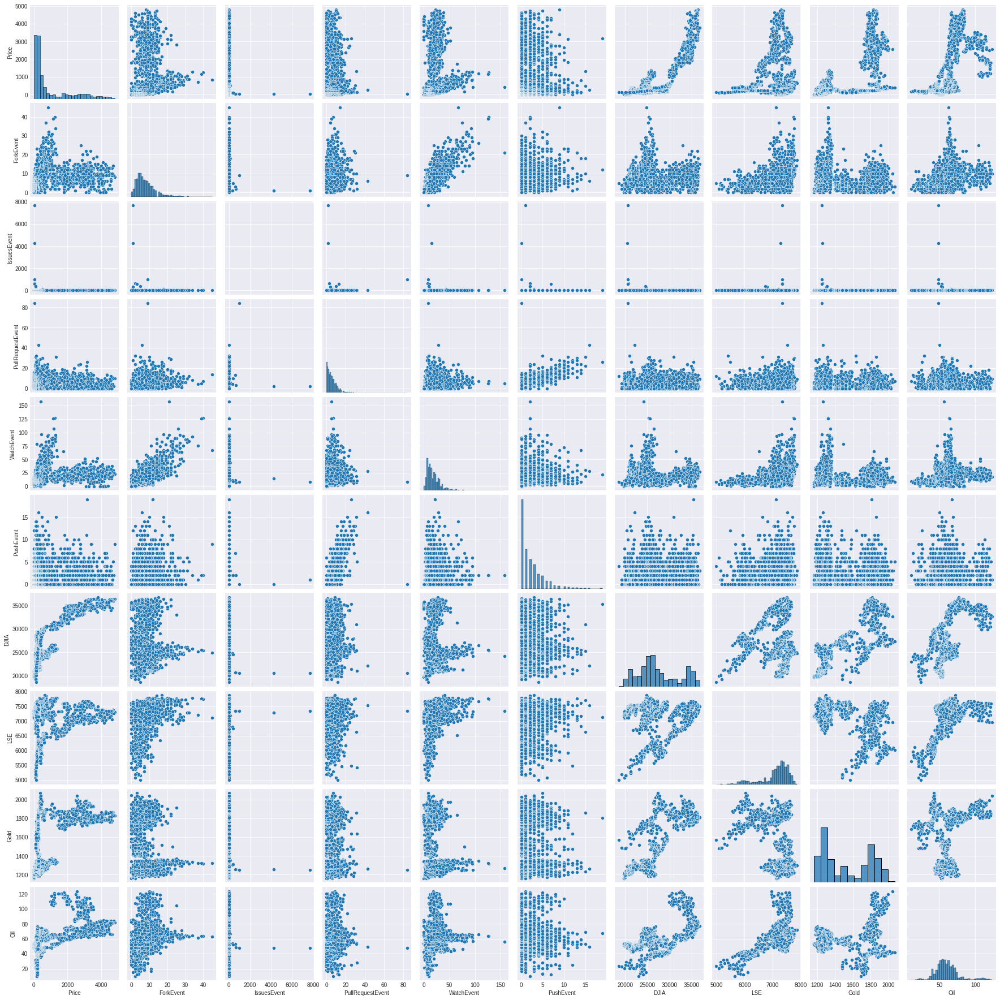

In [ ]:
# generating a pariplot of Ethereum dataset to see the correlationships between all the variables
sns.pairplot(data=ethstamp)

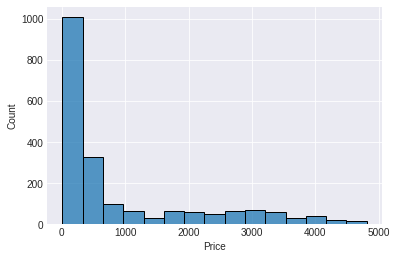

In [ ]:
# Distribution of the Ethereum price in the dataset
sns.histplot(x='Price',bins=15,data=ethstamp)

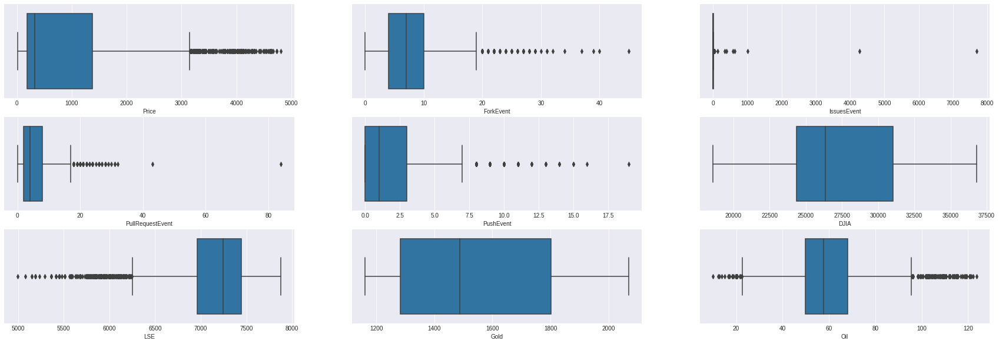

In [ ]:
# Drawing barplots of the features to see outliers

fig, axs = plt.subplots(3, 3, figsize=(30, 10), sharey=True)
#fig, (ax1, ax2, ax3, ax4) = plt.subplots(ncols=4, sharey=True, figsize=(25,6))
sns.boxplot(x=ethstamp['Price'], data=ethstamp, ax=axs[0,0])
sns.boxplot(x=ethstamp['ForkEvent'], data=ethstamp, ax=axs[0,1])
sns.boxplot(x=ethstamp['IssuesEvent'], data=ethstamp, ax=axs[0,2])
sns.boxplot(x=ethstamp['PullRequestEvent'], data=ethstamp, ax=axs[1,0])
sns.boxplot(x=ethstamp['PushEvent'], data=ethstamp, ax=axs[1,1])
sns.boxplot(x=ethstamp['DJIA'], data=ethstamp, ax=axs[1,2])
sns.boxplot(x=ethstamp['LSE'], data=ethstamp, ax=axs[2,0])
sns.boxplot(x=ethstamp['Gold'], data=ethstamp, ax=axs[2,1])
sns.boxplot(x=ethstamp['Oil'], data=ethstamp, ax=axs[2,2])

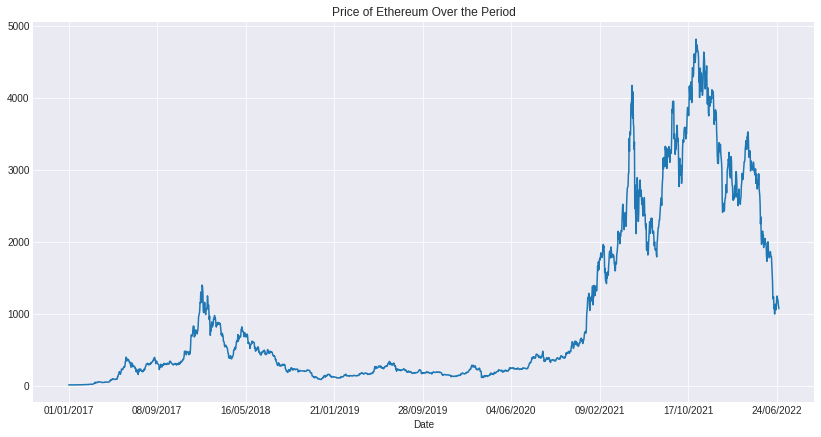

In [ ]:
# Some data analysis
ethstamp.set_index("Date").Price.plot(figsize=(14,7), title="Price of Ethereum Over the Period")

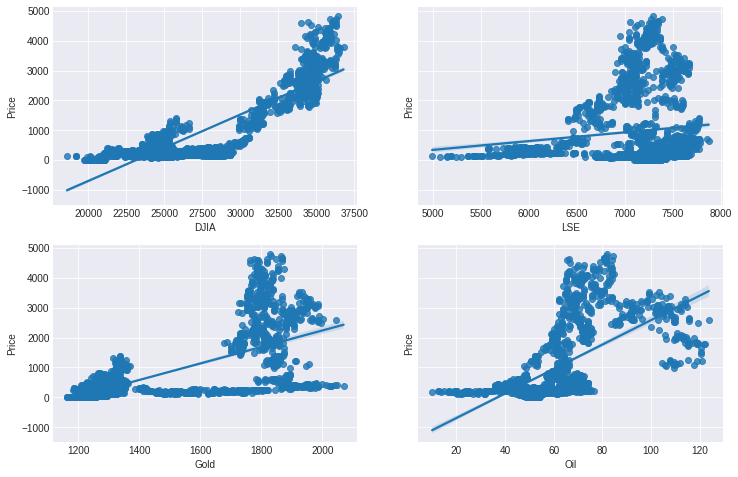

In [ ]:
# I find DJIA, LSE, Gold and Oil Interesting so lets chek their impact on Ethereum price

fig, axs = plt.subplots(2, 2, figsize=(12, 8), sharey=True)
#fig, (ax1, ax2, ax3, ax4) = plt.subplots(ncols=4, sharey=True, figsize=(25,6))
sns.regplot(x=ethstamp['DJIA'], y=ethstamp['Price'], ax=axs[0, 0])
sns.regplot(x=ethstamp['LSE'], y=ethstamp['Price'], ax=axs[0, 1])
sns.regplot(x=ethstamp['Gold'], y=ethstamp['Price'], ax=axs[1, 0])
sns.regplot(x=ethstamp['Oil'], y=ethstamp['Price'], ax=axs[1, 1])

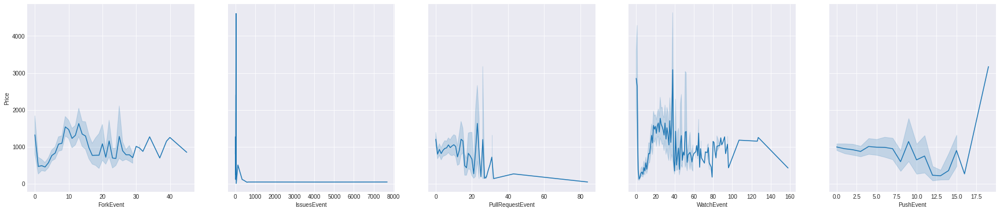

In [ ]:
# Lets have a look at the relationships of
# ForkEvent	IssuesEvent	PullRequestEvent	WatchEvent	PushEvent	against price by lineplots

fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(ncols=5, sharey=True, figsize=(30,6))
sns.lineplot(x=ethstamp['ForkEvent'], y=ethstamp['Price'], ax=ax1)
sns.lineplot(x=ethstamp['IssuesEvent'], y=ethstamp['Price'], ax=ax2)
sns.lineplot(x=ethstamp['PullRequestEvent'], y=ethstamp['Price'], ax=ax3)
sns.lineplot(x=ethstamp['WatchEvent'], y=ethstamp['Price'], ax=ax4)
sns.lineplot(x=ethstamp['PushEvent'], y=ethstamp['Price'], ax=ax5)

Text(0.5, 1.0, '1-Month Lag')

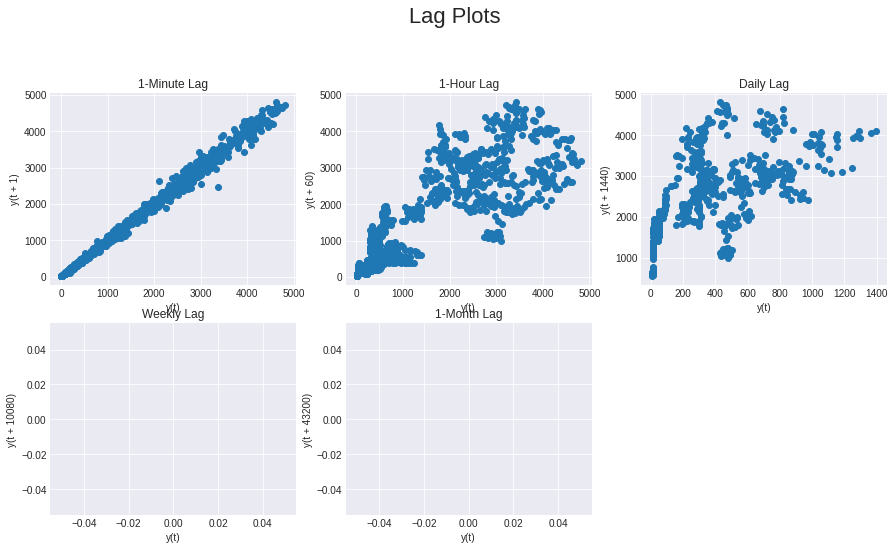

In [ ]:
# Since we are working with time series data let's do some lag plots

#daily, weekly, monthly these can't be plotted

plt.figure(figsize=(15,12))
plt.suptitle('Lag Plots', fontsize=22)

plt.subplot(3,3,1)
pd.plotting.lag_plot(ethstamp['Price'], lag=1) #minute lag
plt.title('1-Minute Lag')

plt.subplot(3,3,2)
pd.plotting.lag_plot(ethstamp['Price'], lag=60) #hourley lag
plt.title('1-Hour Lag')

plt.subplot(3,3,3)
pd.plotting.lag_plot(ethstamp['Price'], lag=1440) #Daily lag
plt.title('Daily Lag')

plt.subplot(3,3,4)
pd.plotting.lag_plot(ethstamp['Price'], lag=10080) #weekly lag
plt.title('Weekly Lag')

plt.subplot(3,3,5)
pd.plotting.lag_plot(ethstamp['Price'], lag=43200) #month lag
plt.title('1-Month Lag')

### Stationarity Check

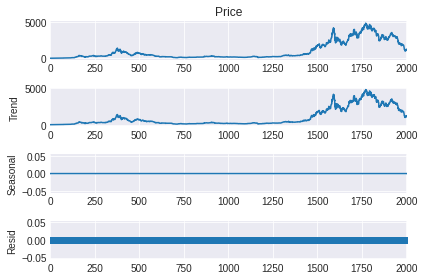

<Figure size 1080x864 with 0 Axes>

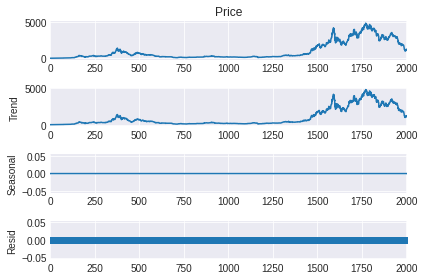

In [ ]:
####

####

plt.figure(figsize=(15,12))
series = ethstamp.Price
result = seasonal_decompose(series, model='additive',period=1)
result.plot()

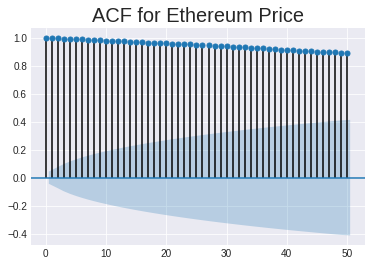

In [ ]:
####

####

acf = plot_acf(series, lags=50, alpha=0.05)
plt.title("ACF for Ethereum Price", size=20)
plt.show()

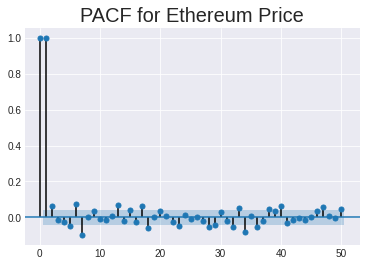

In [ ]:
####

####

plot_pacf(series, lags=50, alpha=0.05, method='ols')
plt.title("PACF for Ethereum Price", size=20)
plt.show()

#### KPSS Test

In [ ]:
# Null hypothesis = Series is Stationary
# Alternative Hypothesis - Series is not Stationary

stats, p, lags, critical_values = kpss(series, 'ct')

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1875: FutureWarning: The behavior of using nlags=None will change in release 0.13.Currently nlags=None is the same as nlags="legacy", and so a sample-size lag length is used. After the next release, the default will change to be the same as nlags="auto" which uses an automatic lag length selection method. To silence this warning, either use "auto" or "legacy"
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1907: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warn_msg.format(direction="smaller"), InterpolationWarning


In [ ]:
print(f'Test Statistics : {stats}')
print(f'p-value : {p}')
print(f'Critical Values : {critical_values}')

if p < 0.05:
    print('Series is not Stationary')
else:
    print('Series is Stationary')

Test Statistics : 1.1757440488298423
p-value : 0.01
Critical Values : {'10%': 0.119, '5%': 0.146, '2.5%': 0.176, '1%': 0.216}
Series is not Stationary


#### ADF Test

In [ ]:
result = adfuller(series)

In [ ]:
print(f'Test Statistics : {result[0]}')
print(f'p-value : {result[1]}')
print(f'Critical Values : {result[4]}')
print(f'Lags : {result[5]}')

if result[1] > 0.05:
    print('Series is not Stationary')
else:
    print('Series is Stationary')

Test Statistics : -1.446944896381178
p-value : 0.5595749136138684
Critical Values : {'1%': -3.4336419856688276, '5%': -2.862994217611322, '10%': -2.567544164035933}
Lags : 22655.328001473314
Series is not Stationary


### Feature Engineering

In [ ]:
# We can extract important features from the Date column
# first we need to convert the Date to datetime format
ethstamp['Date'] = pd.to_datetime(ethstamp['Date'])
ethstamp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2007 entries, 0 to 2006
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Date              2007 non-null   datetime64[ns]
 1   Price             2007 non-null   float64       
 2   ForkEvent         2007 non-null   int64         
 3   IssuesEvent       2007 non-null   int64         
 4   PullRequestEvent  2007 non-null   int64         
 5   WatchEvent        2007 non-null   int64         
 6   PushEvent         2007 non-null   int64         
 7   DJIA              2007 non-null   float64       
 8   LSE               2007 non-null   float64       
 9   Gold              2007 non-null   float64       
 10  Oil               2007 non-null   float64       
dtypes: datetime64[ns](1), float64(5), int64(5)
memory usage: 172.6 KB


In [ ]:
# Creation of the features and adding them to the dataset
ethstamp["year"] = ethstamp.Date.dt.year
ethstamp["month"] = ethstamp.Date.dt.month
ethstamp["day"] = ethstamp.Date.dt.day
ethstamp["day_of_week"] = ethstamp.Date.dt.dayofweek
ethstamp.head()

,Date,Price,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil,year,month,day,day_of_week
0,2017-01-01,8.14,0,3,0,0,0,19762.00,7142.83,1162.0,54.03,2017,1,1,6
1,2017-02-01,8.33,2,2,1,7,1,19762.00,7142.83,1162.0,54.03,2017,2,1,2
2,2017-03-01,9.59,2,4,6,4,1,19881.76,7177.89,1162.0,52.33,2017,3,1,2
3,2017-04-01,10.88,1,2,5,8,2,19942.16,7189.74,1165.3,53.26,2017,4,1,5
4,2017-05-01,10.20,4,1,12,3,8,19899.29,7195.31,1181.3,53.76,2017,5,1,0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  after removing the cwd from sys.path.


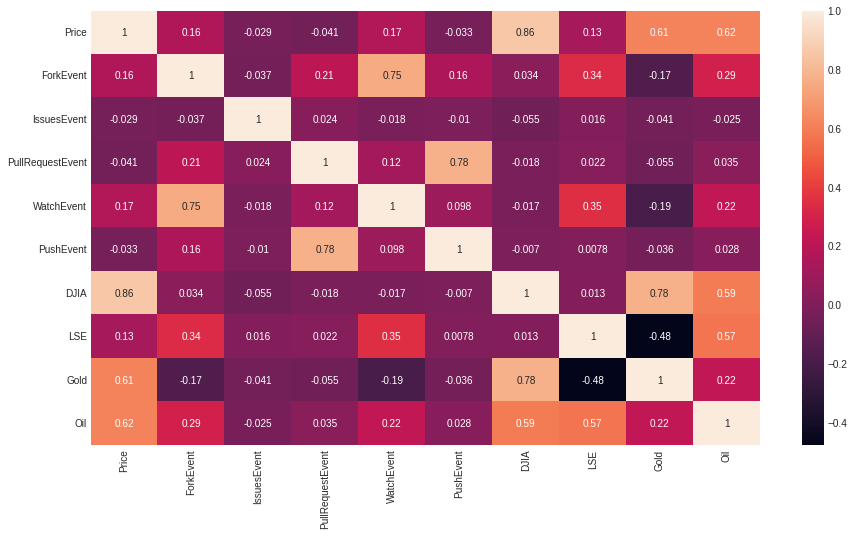

In [ ]:
# Lets have a look at the correlation matrix of all the features (except date)
corr = ethstamp.drop(columns=['Date','year','month','day','day_of_week'])
corr = corr.corr()
corr.style.background_gradient(cmap='PuOr_r').set_precision(2)
plt.figure(figsize=(15,8))
sns.heatmap(corr, annot=True)

### Data Preparation

In [ ]:
# we need to split our data into train and test sets
# the first step we are taking price as y and the rest of the features as X
X = ethstamp.drop(columns=['Price','Date'])
y = ethstamp['Price']
X.head()

,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil,year,month,day,day_of_week
0,0,3,0,0,0,19762.00,7142.83,1162.0,54.03,2017,1,1,6
1,2,2,1,7,1,19762.00,7142.83,1162.0,54.03,2017,2,1,2
2,2,4,6,4,1,19881.76,7177.89,1162.0,52.33,2017,3,1,2
3,1,2,5,8,2,19942.16,7189.74,1165.3,53.26,2017,4,1,5
4,4,1,12,3,8,19899.29,7195.31,1181.3,53.76,2017,5,1,0


In [ ]:
y.head()

0     8.14
1     8.33
2     9.59
3    10.88
4    10.20
Name: Price, dtype: float64

In [ ]:
# Then we are splitting the data into training and test sets with a train size of 60%
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, train_size = 0.6)

## XGBoost

In [ ]:
# creating the regressor model
reg = xgb.XGBRegressor()

In [ ]:
## Hyper Parameter Optimization Grid

params={
 "learning_rate"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30],
 "max_depth"        : [1, 3, 4, 5, 6, 7],
 "n_estimators"     : [int(x) for x in np.linspace(start=100, stop=2000, num=10)],
 "min_child_weight" : [int(x) for x in np.arange(3, 15, 1)],
 "gamma"            : [ 0.0, 0.1, 0.2 , 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1],
 "subsample"        : [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1],
 "colsample_bytree" : [0.5, 0.6, 0.7, 0.8, 0.9, 1],
 "colsample_bylevel": [0.5, 0.6, 0.7, 0.8, 0.9, 1],  
 
}

In [ ]:
# Model with the grid search parameters
model  = RandomizedSearchCV(    
                reg,
                param_distributions=params,
                n_iter=10,
                n_jobs=-1,
                cv=5,
                verbose=3,
)

In [ ]:
# fitting the model
model.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[15:59:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


RandomizedSearchCV(cv=5, estimator=XGBRegressor(), n_jobs=-1,
                   param_distributions={'colsample_bylevel': [0.5, 0.6, 0.7,
                                                              0.8, 0.9, 1],
                                        'colsample_bytree': [0.5, 0.6, 0.7, 0.8,
                                                             0.9, 1],
                                        'gamma': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5,
                                                  0.6, 0.7, 0.8, 0.9, 1],
                                        'learning_rate': [0.05, 0.1, 0.15, 0.2,
                                                          0.25, 0.3],
                                        'max_depth': [1, 3, 4, 5, 6, 7],
                                        'min_child_weight': [3, 4, 5, 6, 7, 8,
                                                             9, 10, 11, 12, 13,
                                                             14],
                                

In [ ]:
# evaluation of the model on train and test sets of data
y_train_pred_xgb = model.predict(X_train)

xgb_train_mae = mean_absolute_error(y_train, y_train_pred_xgb)
xgb_train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred_xgb))
xgb_train_mape = mean_absolute_percentage_error(y_train, y_train_pred_xgb)
xgb_train_r2 = r2_score(y_train, y_train_pred_xgb)

print(f"Train MAE XGBoost on Ethereum Dataset: {xgb_train_mae}")
print(f"Train MAPE XGBoost on Ethereum Dataset: {xgb_train_mape}")
print(f"Train RMSE XGBoost on Ethereum Dataset: {xgb_train_rmse}")
print(f"Train R2 XGBoost on Ethereum Dataset: {xgb_train_r2}")

Train MAE XGBoost on Ethereum Dataset: 0.28830357690982716
Train MAPE XGBoost on Ethereum Dataset: 0.0018154582704679614
Train RMSE XGBoost on Ethereum Dataset: 0.3984316182800106
Train R2 XGBoost on Ethereum Dataset: 0.9999998967763515


In [ ]:
y_test_pred_xgb = model.predict(X_test)

test_mae_xgb = mean_absolute_error(y_test, y_test_pred_xgb)
test_mape_xgb = mean_absolute_percentage_error(y_test, y_test_pred_xgb)
test_rmse_xgb = np.sqrt(mean_squared_error(y_test, y_test_pred_xgb))
test_r2_xgb = r2_score(y_test, y_test_pred_xgb)

print(f"Test MAE of XGBoost on Ethereum Dataset: {test_mae_xgb}")
print(f"Test MAPE of XGBoost on Ethereum Dataset: {test_mape_xgb}")
print(f"Test RMSE of XGBoost on Ethereum Dataset: {test_rmse_xgb}")
print(f"Test R2 XGBoost on Ethereum Dataset: {test_r2_xgb}")

Test MAE of XGBoost on Ethereum Dataset: 78.42215167556277
Test MAPE of XGBoost on Ethereum Dataset: 0.12585791302678376
Test RMSE of XGBoost on Ethereum Dataset: 148.65623682883154
Test R2 XGBoost on Ethereum Dataset: 0.9823753526496013


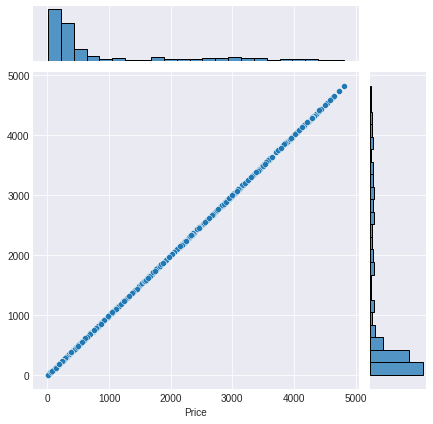

In [ ]:
# True vs Predicted plot of XGB model on the Train and Test data
sns.jointplot(x=y_train, y=y_train_pred_xgb)

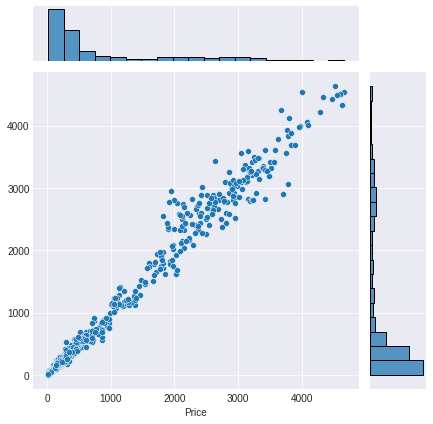

In [ ]:
sns.jointplot(x=y_test, y=y_test_pred_xgb)

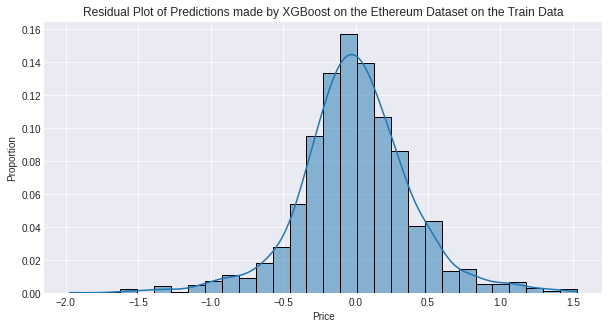

In [ ]:
#Residual Plots of Train and Test sets of xgb Model
plt.figure(figsize=(10,5))
plt.title("Residual Plot of Predictions made by XGBoost on the Ethereum Dataset on the Train Data")
residuals_df = y_train_pred_xgb - y_train
sns.histplot(x = residuals_df, kde=True, stat='proportion', bins=30)

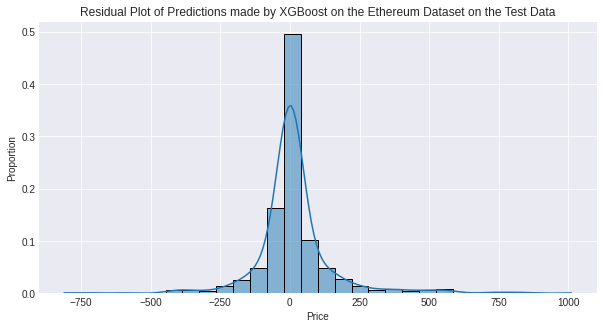

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Residual Plot of Predictions made by XGBoost on the Ethereum Dataset on the Test Data")
residuals_df = y_test_pred_xgb - y_test
sns.histplot(x = residuals_df, kde=True, stat='proportion', bins=30)

## Random Forest

In [ ]:
# create regressor object
rf_reg = RandomForestRegressor()
  
# fit the regressor with x and y data
rf_reg.fit(X_train, y_train) 

RandomForestRegressor()

In [ ]:
# evaluation of the model on train and test sets of data
y_train_pred_rf = rf_reg.predict(X_train)

rf_train_mae = mean_absolute_error(y_train, y_train_pred_rf)
rf_train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred_rf))
rf_train_mape = mean_absolute_percentage_error(y_train, y_train_pred_rf)
rf_train_r2 = r2_score(y_train, y_train_pred_rf)

print(f"Train MAE Random Forest Regressor on Ethereum Dataset: {rf_train_mae}")
print(f"Train MAPE Random Forest Regressor on Ethereum Dataset: {rf_train_mape}")
print(f"Train RMSE Random Forest Regressor on Ethereum Dataset: {rf_train_rmse}")
print(f"Train R2 Random Forest Regressor on Ethereum Dataset: {rf_train_r2}")

Train MAE Random Forest Regressor on Ethereum Dataset: 28.495470265780735
Train MAPE Random Forest Regressor on Ethereum Dataset: 0.03954532989876107
Train RMSE Random Forest Regressor on Ethereum Dataset: 61.276842362088345
Train R2 Random Forest Regressor on Ethereum Dataset: 0.9975584570407624


In [ ]:
y_test_pred_rf = rf_reg.predict(X_test)

test_mae_rf = mean_absolute_error(y_test, y_test_pred_rf)
test_mape_rf = mean_absolute_percentage_error(y_test, y_test_pred_rf)
test_rmse_rf = np.sqrt(mean_squared_error(y_test, y_test_pred_rf))
test_r2_rf = r2_score(y_test, y_test_pred_rf)

print(f"Test MAE of Random Forest Regressor on Ethereum Dataset: {test_mae_rf}")
print(f"Test MAPE of Random Forest Regressor on Ethereum Dataset: {test_mape_rf}")
print(f"Test RMSE of Random Forest Regressor on Ethereum Dataset: {test_rmse_rf}")
print(f"Test R2 Random Forest Regressor on Ethereum Dataset: {test_r2_rf}")

Test MAE of Random Forest Regressor on Ethereum Dataset: 80.8098799501868
Test MAPE of Random Forest Regressor on Ethereum Dataset: 0.11994559923805886
Test RMSE of Random Forest Regressor on Ethereum Dataset: 158.17386325522887
Test R2 Random Forest Regressor on Ethereum Dataset: 0.9800462920801958


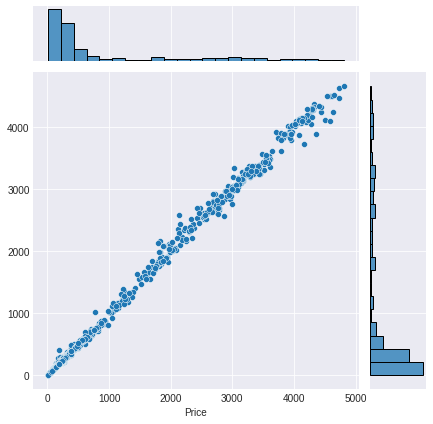

In [ ]:
# True vs Predicted plot of RF model on the Train and Test data
sns.jointplot(x=y_train, y=y_train_pred_rf)

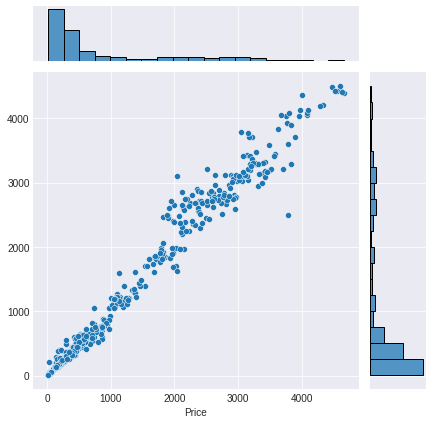

In [ ]:
# True vs Predicted plot of RF model on the Train and Test data
sns.jointplot(x=y_test, y=y_test_pred_rf)

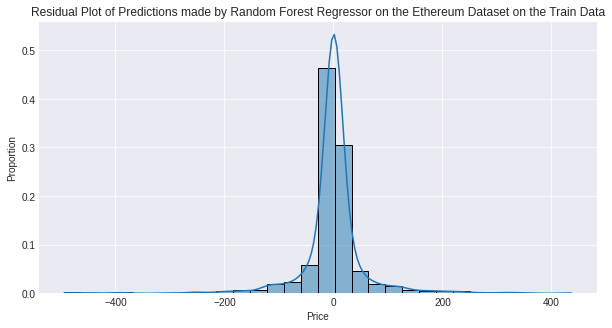

In [ ]:
#Residual Plots of Train and Test sets of RF Model
plt.figure(figsize=(10,5))
plt.title("Residual Plot of Predictions made by Random Forest Regressor on the Ethereum Dataset on the Train Data")
residuals_df = y_train_pred_rf - y_train
sns.histplot(x = residuals_df, kde=True, stat='proportion', bins=30)

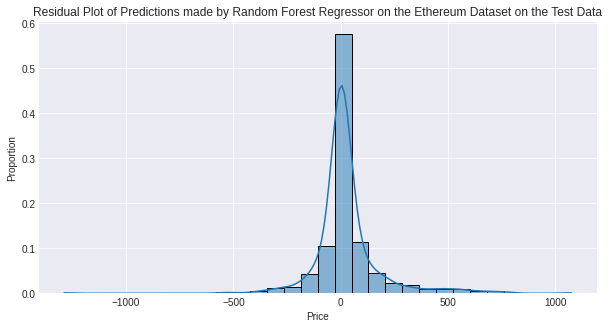

In [ ]:
#Residual Plots of Train and Test sets of RF Model
plt.figure(figsize=(10,5))
plt.title("Residual Plot of Predictions made by Random Forest Regressor on the Ethereum Dataset on the Test Data")
residuals_df = y_test_pred_rf - y_test
sns.histplot(x = residuals_df, kde=True, stat='proportion', bins=30)

## Summary of Results

In [ ]:
# Summarisation of the Model Results
models = ['XGBoost','Random Forest Regressor']
mae = [test_mae_xgb, test_mae_rf]
rmse = [test_rmse_xgb, test_rmse_rf]
mape = [test_mape_xgb, test_mape_rf]
r2 = [test_r2_xgb, test_r2_rf]

In [ ]:
# Creating a dictionary to store the results 
d = {'Models':models, 'MAE':mae, 'MAPE':mape, 'RMSE':rmse, 'R2-Score':r2}

# using that dictionary to create a dataframe of the results to display as a table
result = pd.DataFrame(d)
result

,Models,MAE,MAPE,RMSE,R2-Score
0,XGBoost,78.422152,0.125858,148.656237,0.982375
1,Random Forest Regressor,80.809880,0.119946,158.173863,0.980046


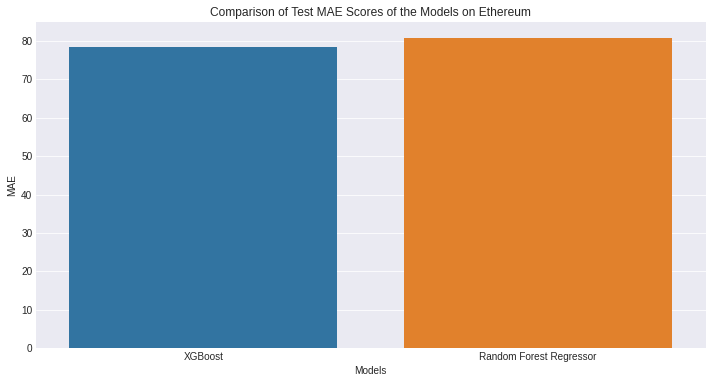

In [ ]:
# Displaying the models MAE values as a bar plot
plt.figure(figsize=(12,6))
plt.title("Comparison of Test MAE Scores of the Models on Ethereum")
sns.barplot(x="Models", y="MAE", data=result, ci=None)

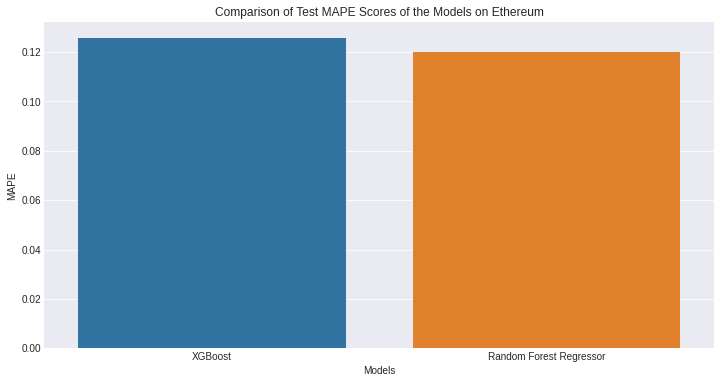

In [ ]:
# comparison of MAPE values of the models on the test set
plt.figure(figsize=(12,6))
plt.title("Comparison of Test MAPE Scores of the Models on Ethereum")
sns.barplot(x="Models", y="MAPE", data=result, ci=None)

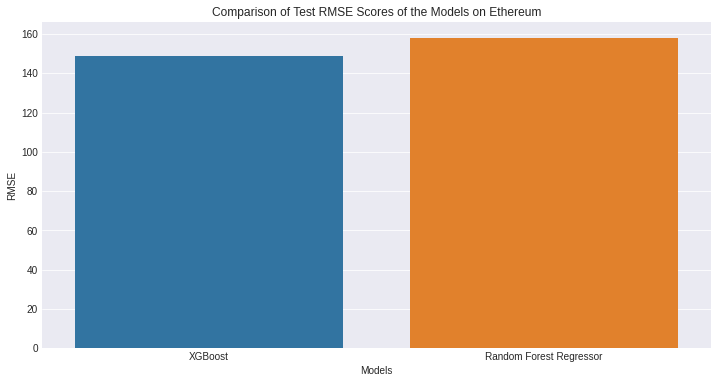

In [ ]:
# Displaying the models RMSE values as a bar plot
plt.figure(figsize=(12,6))
plt.title("Comparison of Test RMSE Scores of the Models on Ethereum")
sns.barplot(x="Models", y="RMSE", data=result, ci=None)

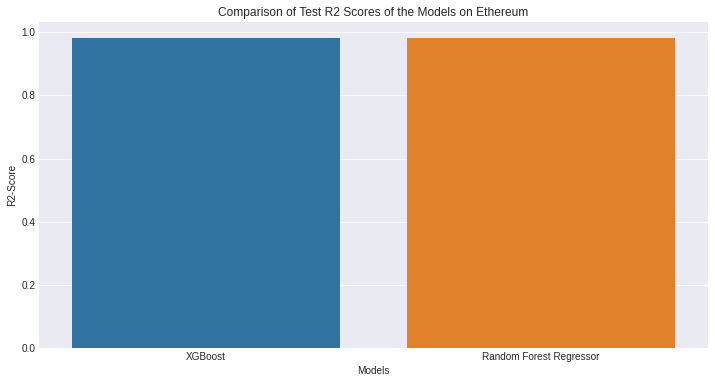

In [ ]:
# Displaying the models R2 values as a bar plot
plt.figure(figsize=(12,6))
plt.title("Comparison of Test R2 Scores of the Models on Ethereum")
sns.barplot(x="Models", y="R2-Score", data=result, ci=None)

In [ ]:
# Importing drive to load the datasets stored in my personal space at Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 3 Binance Coin Price Prediction

## Data Loading and Inspection

In [ ]:
# Reading the csv file of Bitcoin
bnbstamp = pd.read_csv("drive/My Drive/Bitcoin_Project/Final Datasets/Binance Coin USD.csv")
bnbstamp.head()

,Index,Date,Currency,Initial,Price (USD),GH Repo,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA (USD),LSE (USD),Gold (USD),Oil (USD)
0,1,01/01/2017,Binance Coin USD,BNB,0.0,binance-exchange/binance-official-api-docs,0,0,0,0,0,"19,762.00","7,142.83","1,162.00",54.03
1,2,02/01/2017,Binance Coin USD,BNB,0.0,binance-exchange/binance-official-api-docs,0,0,0,0,0,"19,762.00","7,142.83","1,162.00",54.03
2,3,03/01/2017,Binance Coin USD,BNB,0.0,binance-exchange/binance-official-api-docs,0,0,0,0,0,"19,881.76","7,177.89","1,162.00",52.33
3,4,04/01/2017,Binance Coin USD,BNB,0.0,binance-exchange/binance-official-api-docs,0,0,0,0,0,"19,942.16","7,189.74","1,165.30",53.26
4,5,05/01/2017,Binance Coin USD,BNB,0.0,binance-exchange/binance-official-api-docs,0,0,0,0,0,"19,899.29","7,195.31","1,181.30",53.76


In [ ]:
# getting information about the dataset
bnbstamp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2007 entries, 0 to 2006
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Index             2007 non-null   int64  
 1   Date              2007 non-null   object 
 2   Currency          2007 non-null   object 
 3   Initial           2007 non-null   object 
 4    Price (USD)      2007 non-null   float64
 5   GH Repo           2007 non-null   object 
 6   ForkEvent         2007 non-null   int64  
 7   IssuesEvent       2007 non-null   int64  
 8   PullRequestEvent  2007 non-null   int64  
 9   WatchEvent        2007 non-null   int64  
 10  PushEvent         2007 non-null   int64  
 11   DJIA (USD)       2007 non-null   object 
 12   LSE (USD)        2007 non-null   object 
 13   Gold (USD)       2007 non-null   object 
 14   Oil (USD)        2007 non-null   float64
dtypes: float64(2), int64(6), object(7)
memory usage: 235.3+ KB


In [ ]:
# descriptive statistics about the dataset
bnbstamp.describe(include='all')

,Index,Date,Currency,Initial,Price (USD),GH Repo,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA (USD),LSE (USD),Gold (USD),Oil (USD)
count,2007.000000,2007,2007,2007,2007.000000,2007,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007,2007,2007,2007.000000
unique,NaN,2007,1,1,NaN,1,NaN,NaN,NaN,NaN,NaN,1382,1385,1210,NaN
top,NaN,01/01/2017,Binance Coin USD,BNB,NaN,binance-exchange/binance-official-api-docs,NaN,NaN,NaN,NaN,NaN,"24,103.11","7,547.63","1,196.20",NaN
freq,NaN,1,2007,2007,NaN,2007,NaN,NaN,NaN,NaN,NaN,4,7,7,NaN
mean,1004.000000,NaN,NaN,NaN,111.903769,NaN,1.286497,0.001993,0.126557,2.072247,0.110115,NaN,NaN,NaN,60.204245
std,579.515315,NaN,NaN,NaN,178.252447,NaN,1.716477,0.044610,0.795004,2.817348,0.596042,NaN,NaN,NaN,17.940887
min,1.000000,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,10.010000
25%,502.500000,NaN,NaN,NaN,9.481370,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,49.885000
50%,1004.000000,NaN,NaN,NaN,17.369253,NaN,1.000000,0.000000,0.000000,1.000000,0.000000,NaN,NaN,NaN,57.770000
75%,1505.500000,NaN,NaN,NaN,131.754669,NaN,2.000000,0.000000,0.000000,3.000000,0.000000,NaN,NaN,NaN,68.145000


In [ ]:
# Identification of missing values
bnbstamp.isnull().sum()

Index               0
Date                0
Currency            0
Initial             0
 Price (USD)        0
GH Repo             0
ForkEvent           0
IssuesEvent         0
PullRequestEvent    0
WatchEvent          0
PushEvent           0
 DJIA (USD)         0
 LSE (USD)          0
 Gold (USD)         0
 Oil (USD)          0
dtype: int64

### Data Handling

In [ ]:
# Currency, Initial and GH Repo can be dropped before training the models
# The models won't learn any important information from these features

# renaming some column names to make analysis easier
bnbstamp = bnbstamp.rename(columns={' Price (USD) ':'Price',' DJIA (USD) ':'DJIA',' LSE (USD) ':'LSE',' Gold (USD) ':'Gold',' Oil (USD) ':'Oil'})
bnbstamp.columns

Index(['Index', 'Date', 'Currency', 'Initial', 'Price', 'GH Repo', 'ForkEvent',
       'IssuesEvent', 'PullRequestEvent', 'WatchEvent', 'PushEvent', 'DJIA',
       'LSE', 'Gold', 'Oil'],
      dtype='object')

In [ ]:
# Checking the values of Currency, Initial and GH Repo
bnbstamp['Currency'].value_counts()

Binance Coin USD    2007
Name: Currency, dtype: int64

In [ ]:
# Checking the values of Currency, Initial and GH Repo
bnbstamp['Initial'].value_counts()

BNB    2007
Name: Initial, dtype: int64

In [ ]:
# Checking the values of Currency, Initial and GH Repo
bnbstamp['GH Repo'].value_counts()

binance-exchange/binance-official-api-docs    2007
Name: GH Repo, dtype: int64

In [ ]:
# Dropping the unnecessary columns from the dataset
bnbstamp = bnbstamp.drop(columns=['Index','Currency','Initial','GH Repo'])
bnbstamp.head()

,Date,Price,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil
0,01/01/2017,0.0,0,0,0,0,0,"19,762.00","7,142.83","1,162.00",54.03
1,02/01/2017,0.0,0,0,0,0,0,"19,762.00","7,142.83","1,162.00",54.03
2,03/01/2017,0.0,0,0,0,0,0,"19,881.76","7,177.89","1,162.00",52.33
3,04/01/2017,0.0,0,0,0,0,0,"19,942.16","7,189.74","1,165.30",53.26
4,05/01/2017,0.0,0,0,0,0,0,"19,899.29","7,195.31","1,181.30",53.76


In [ ]:
# Getting rid of the commas from the dataset to convert the strings to floats
bnbstamp = bnbstamp.replace(',','', regex=True)
bnbstamp.head()

,Date,Price,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil
0,01/01/2017,0.0,0,0,0,0,0,19762.00,7142.83,1162.00,54.03
1,02/01/2017,0.0,0,0,0,0,0,19762.00,7142.83,1162.00,54.03
2,03/01/2017,0.0,0,0,0,0,0,19881.76,7177.89,1162.00,52.33
3,04/01/2017,0.0,0,0,0,0,0,19942.16,7189.74,1165.30,53.26
4,05/01/2017,0.0,0,0,0,0,0,19899.29,7195.31,1181.30,53.76


In [ ]:
# Converting strings to floats
bnbstamp = bnbstamp.astype({'DJIA':'float','Gold':'float','LSE':'float','Oil':'float'})
bnbstamp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2007 entries, 0 to 2006
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Date              2007 non-null   object 
 1   Price             2007 non-null   float64
 2   ForkEvent         2007 non-null   int64  
 3   IssuesEvent       2007 non-null   int64  
 4   PullRequestEvent  2007 non-null   int64  
 5   WatchEvent        2007 non-null   int64  
 6   PushEvent         2007 non-null   int64  
 7   DJIA              2007 non-null   float64
 8   LSE               2007 non-null   float64
 9   Gold              2007 non-null   float64
 10  Oil               2007 non-null   float64
dtypes: float64(5), int64(5), object(1)
memory usage: 172.6+ KB


In [ ]:
# descriptive statistics about the dataset
bnbstamp.describe(include='all')

,Date,Price,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil
count,2007,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000
unique,2007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,01/01/2017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,111.903769,1.286497,0.001993,0.126557,2.072247,0.110115,27440.167100,7090.837862,1535.141256,60.204245
std,NaN,178.252447,1.716477,0.044610,0.795004,2.817348,0.596042,4602.059976,525.839133,265.680739,17.940887
min,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18591.930000,4993.890000,1162.000000,10.010000
25%,NaN,9.481370,0.000000,0.000000,0.000000,0.000000,0.000000,24360.830000,6963.890000,1283.400000,49.885000
50%,NaN,17.369253,1.000000,0.000000,0.000000,1.000000,0.000000,26355.470000,7247.080000,1487.500000,57.770000
75%,NaN,131.754669,2.000000,0.000000,0.000000,3.000000,0.000000,31035.220000,7441.525000,1802.400000,68.145000


### Data Exploration

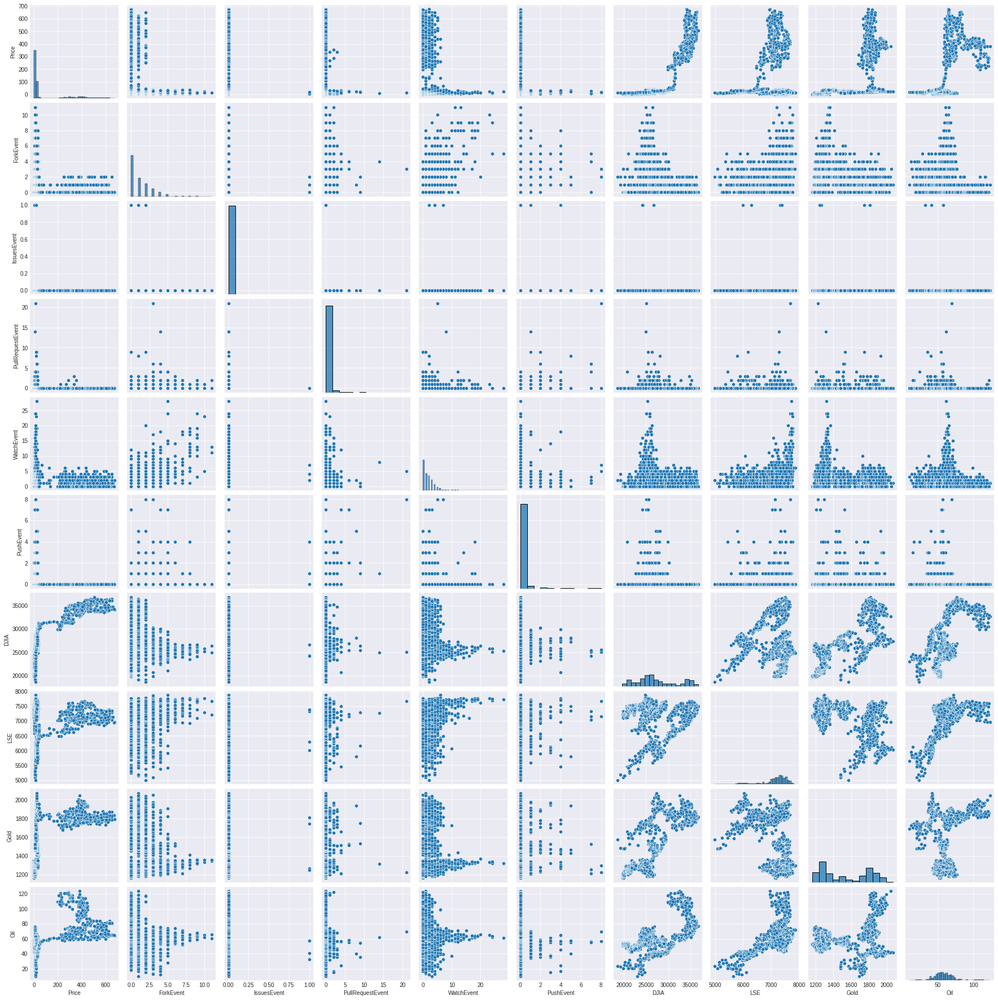

In [ ]:
# generating a pariplot of Bitcoin dataset to see the correlationships between all the variables
sns.pairplot(data=bnbstamp)

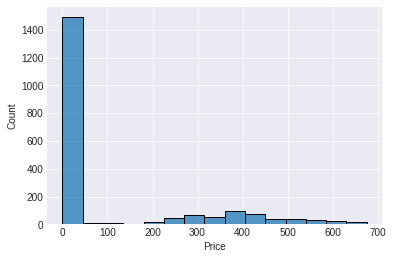

In [ ]:
# Distribution of the Binance Coin price in the dataset
sns.histplot(x='Price',bins=15,data=bnbstamp)

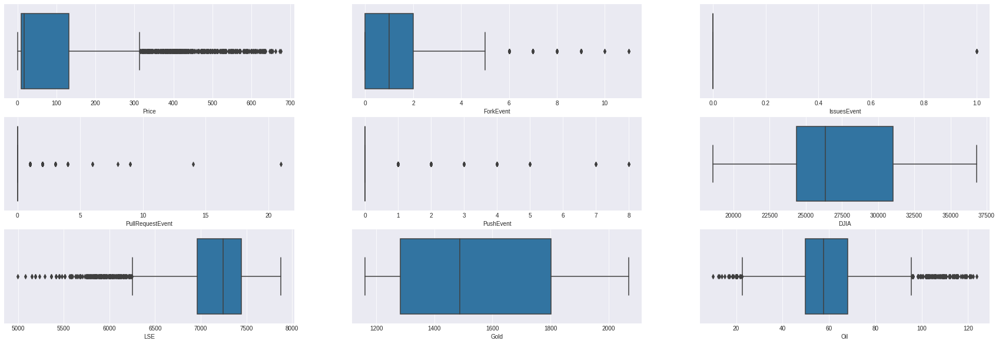

In [ ]:
# Drawing barplots of the features to see outliers

fig, axs = plt.subplots(3, 3, figsize=(30, 10), sharey=True)
#fig, (ax1, ax2, ax3, ax4) = plt.subplots(ncols=4, sharey=True, figsize=(25,6))
sns.boxplot(x=bnbstamp['Price'], data=bnbstamp, ax=axs[0,0])
sns.boxplot(x=bnbstamp['ForkEvent'], data=bnbstamp, ax=axs[0,1])
sns.boxplot(x=bnbstamp['IssuesEvent'], data=bnbstamp, ax=axs[0,2])
sns.boxplot(x=bnbstamp['PullRequestEvent'], data=bnbstamp, ax=axs[1,0])
sns.boxplot(x=bnbstamp['PushEvent'], data=bnbstamp, ax=axs[1,1])
sns.boxplot(x=bnbstamp['DJIA'], data=bnbstamp, ax=axs[1,2])
sns.boxplot(x=bnbstamp['LSE'], data=bnbstamp, ax=axs[2,0])
sns.boxplot(x=bnbstamp['Gold'], data=bnbstamp, ax=axs[2,1])
sns.boxplot(x=bnbstamp['Oil'], data=bnbstamp, ax=axs[2,2])

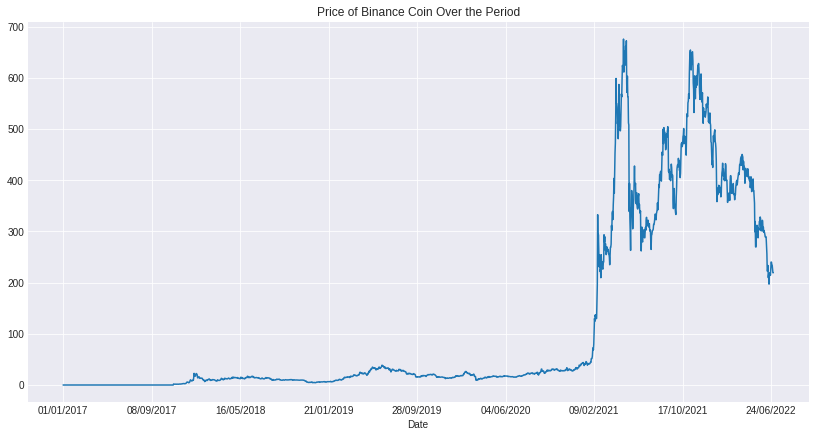

In [ ]:
# Some data analysis
bnbstamp.set_index("Date").Price.plot(figsize=(14,7), title="Price of Binance Coin Over the Period")

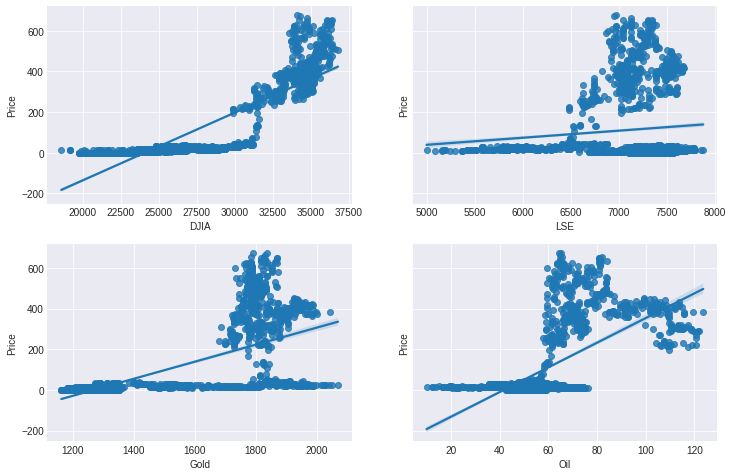

In [ ]:
# I find DJIA, LSE, Gold and Oil Interesting so lets chek their impact on Bitcoin price

fig, axs = plt.subplots(2, 2, figsize=(12, 8), sharey=True)
#fig, (ax1, ax2, ax3, ax4) = plt.subplots(ncols=4, sharey=True, figsize=(25,6))
sns.regplot(x=bnbstamp['DJIA'], y=bnbstamp['Price'], ax=axs[0, 0])
sns.regplot(x=bnbstamp['LSE'], y=bnbstamp['Price'], ax=axs[0, 1])
sns.regplot(x=bnbstamp['Gold'], y=bnbstamp['Price'], ax=axs[1, 0])
sns.regplot(x=bnbstamp['Oil'], y=bnbstamp['Price'], ax=axs[1, 1])

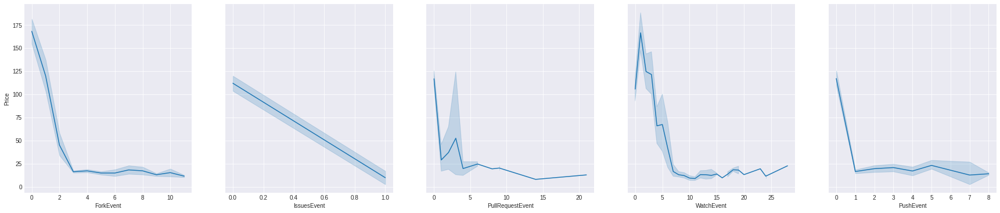

In [ ]:
# Lets have a look at the relationships of
# ForkEvent	IssuesEvent	PullRequestEvent	WatchEvent	PushEvent	against price by lineplots

fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(ncols=5, sharey=True, figsize=(30,6))
sns.lineplot(x=bnbstamp['ForkEvent'], y=bnbstamp['Price'], ax=ax1)
sns.lineplot(x=bnbstamp['IssuesEvent'], y=bnbstamp['Price'], ax=ax2)
sns.lineplot(x=bnbstamp['PullRequestEvent'], y=bnbstamp['Price'], ax=ax3)
sns.lineplot(x=bnbstamp['WatchEvent'], y=bnbstamp['Price'], ax=ax4)
sns.lineplot(x=bnbstamp['PushEvent'], y=bnbstamp['Price'], ax=ax5)

Text(0.5, 1.0, '1-Month Lag')

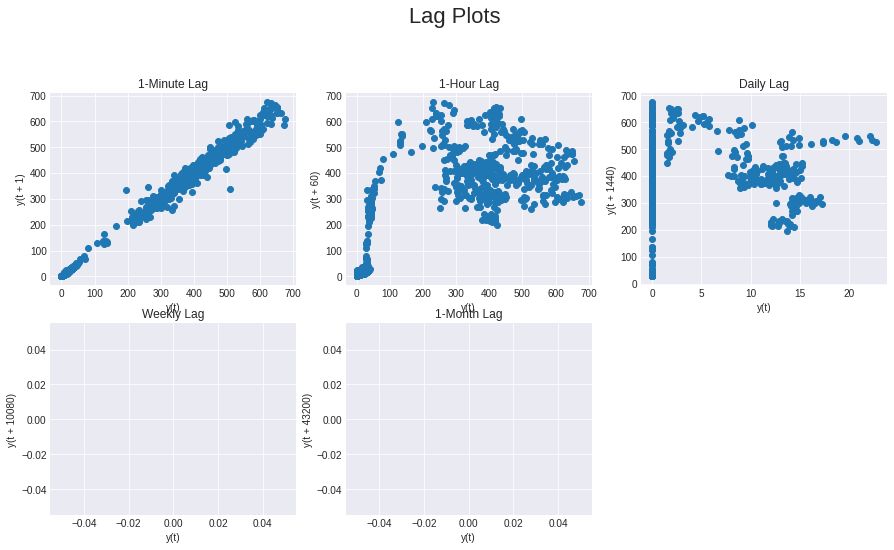

In [ ]:
# Since we are working with time series data let's do some lag plots

#daily, weekly, monthly these can't be plotted

plt.figure(figsize=(15,12))
plt.suptitle('Lag Plots', fontsize=22)

plt.subplot(3,3,1)
pd.plotting.lag_plot(bnbstamp['Price'], lag=1) #minute lag
plt.title('1-Minute Lag')

plt.subplot(3,3,2)
pd.plotting.lag_plot(bnbstamp['Price'], lag=60) #hourley lag
plt.title('1-Hour Lag')

plt.subplot(3,3,3)
pd.plotting.lag_plot(bnbstamp['Price'], lag=1440) #Daily lag
plt.title('Daily Lag')

plt.subplot(3,3,4)
pd.plotting.lag_plot(bnbstamp['Price'], lag=10080) #weekly lag
plt.title('Weekly Lag')

plt.subplot(3,3,5)
pd.plotting.lag_plot(bnbstamp['Price'], lag=43200) #month lag
plt.title('1-Month Lag')

### Stationarity Check

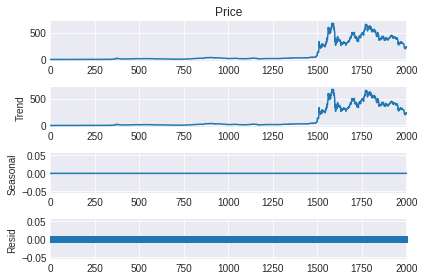

<Figure size 1080x864 with 0 Axes>

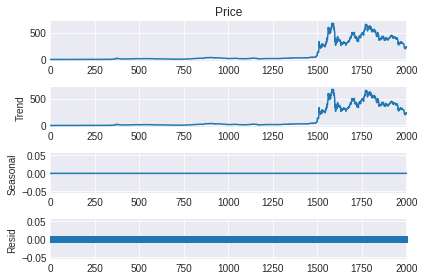

In [ ]:
plt.figure(figsize=(15,12))
series = bnbstamp.Price
result = seasonal_decompose(series, model='additive',period=1)
result.plot()

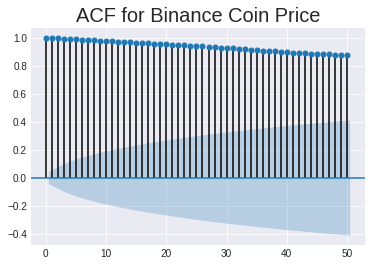

In [ ]:
acf = (series, lags=50, alpha=0.05)
plt.title("ACF for Binance Coin Price", size=20)
plt.show()

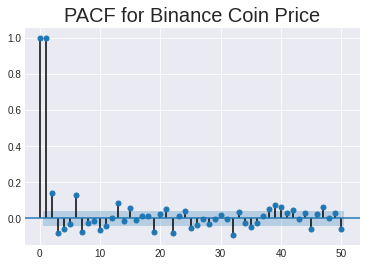

In [ ]:
plot_pacf(series, lags=50, alpha=0.05, method='ols')
plt.title("PACF for Binance Coin Price", size=20)
plt.show()

#### KPSS Test

In [ ]:
# Null hypothesis = Series is Stationary
# Alternative Hypothesis - Series is not Stationary

stats, p, lags, critical_values = kpss(series, 'ct')

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1875: FutureWarning: The behavior of using nlags=None will change in release 0.13.Currently nlags=None is the same as nlags="legacy", and so a sample-size lag length is used. After the next release, the default will change to be the same as nlags="auto" which uses an automatic lag length selection method. To silence this warning, either use "auto" or "legacy"
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1907: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warn_msg.format(direction="smaller"), InterpolationWarning


In [ ]:
print(f'Test Statistics : {stats}')
print(f'p-value : {p}')
print(f'Critical Values : {critical_values}')

if p < 0.05:
    print('Series is not Stationary')
else:
    print('Series is Stationary')

Test Statistics : 1.0886156950290433
p-value : 0.01
Critical Values : {'10%': 0.119, '5%': 0.146, '2.5%': 0.176, '1%': 0.216}
Series is not Stationary


#### ADF Test

In [ ]:
result = adfuller(series)

In [ ]:
print(f'Test Statistics : {result[0]}')
print(f'p-value : {result[1]}')
print(f'Critical Values : {result[4]}')
print(f'Lags : {result[5]}')

if result[1] > 0.05:
    print('Series is not Stationary')
else:
    print('Series is Stationary')

Test Statistics : -1.578532907929589
p-value : 0.4943675131747929
Critical Values : {'1%': -3.4336552971929506, '5%': -2.8630000946528655, '10%': -2.5675472932714394}
Lags : 15275.283914817053
Series is not Stationary


### Feature Engineering

In [ ]:
# We can extract important features from the Date column
# first we need to convert the Date to datetime format
bnbstamp['Date'] = pd.to_datetime(bnbstamp['Date'])
bnbstamp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2007 entries, 0 to 2006
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Date              2007 non-null   datetime64[ns]
 1   Price             2007 non-null   float64       
 2   ForkEvent         2007 non-null   int64         
 3   IssuesEvent       2007 non-null   int64         
 4   PullRequestEvent  2007 non-null   int64         
 5   WatchEvent        2007 non-null   int64         
 6   PushEvent         2007 non-null   int64         
 7   DJIA              2007 non-null   float64       
 8   LSE               2007 non-null   float64       
 9   Gold              2007 non-null   float64       
 10  Oil               2007 non-null   float64       
dtypes: datetime64[ns](1), float64(5), int64(5)
memory usage: 172.6 KB


In [ ]:
# Creation of the features and adding them to the dataset
bnbstamp["year"] = bnbstamp.Date.dt.year
bnbstamp["month"] = bnbstamp.Date.dt.month
bnbstamp["day"] = bnbstamp.Date.dt.day
bnbstamp["day_of_week"] = bnbstamp.Date.dt.dayofweek
bnbstamp.head()

,Date,Price,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil,year,month,day,day_of_week
0,2017-01-01,0.0,0,0,0,0,0,19762.00,7142.83,1162.0,54.03,2017,1,1,6
1,2017-02-01,0.0,0,0,0,0,0,19762.00,7142.83,1162.0,54.03,2017,2,1,2
2,2017-03-01,0.0,0,0,0,0,0,19881.76,7177.89,1162.0,52.33,2017,3,1,2
3,2017-04-01,0.0,0,0,0,0,0,19942.16,7189.74,1165.3,53.26,2017,4,1,5
4,2017-05-01,0.0,0,0,0,0,0,19899.29,7195.31,1181.3,53.76,2017,5,1,0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  after removing the cwd from sys.path.


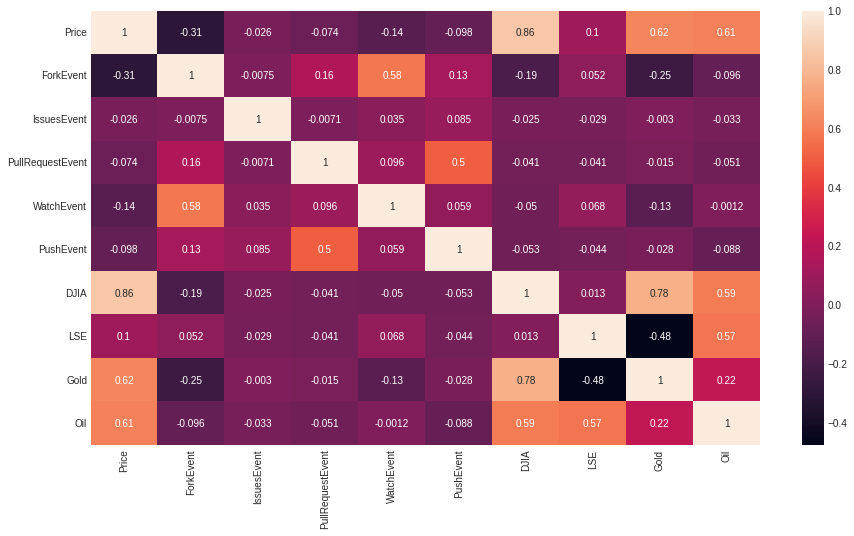

In [ ]:
# Lets have a look at the correlation matrix of all the features (except date)
corr = bnbstamp.drop(columns=['Date','year','month','day','day_of_week'])
corr = corr.corr()
corr.style.background_gradient(cmap='PuOr_r').set_precision(2)
plt.figure(figsize=(15,8))
sns.heatmap(corr, annot=True)

### Data Preparation

In [ ]:
# we need to split our data into train and test sets
# the first step we are taking price as y and the rest of the features as X
X = bnbstamp.drop(columns=['Price','Date'])
y = bnbstamp['Price']
X.head()

,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil,year,month,day,day_of_week
0,0,0,0,0,0,19762.00,7142.83,1162.0,54.03,2017,1,1,6
1,0,0,0,0,0,19762.00,7142.83,1162.0,54.03,2017,2,1,2
2,0,0,0,0,0,19881.76,7177.89,1162.0,52.33,2017,3,1,2
3,0,0,0,0,0,19942.16,7189.74,1165.3,53.26,2017,4,1,5
4,0,0,0,0,0,19899.29,7195.31,1181.3,53.76,2017,5,1,0


In [ ]:
y.head()

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Price, dtype: float64

In [ ]:
# Then we are splitting the data into training and test sets with a train size of 60%
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, train_size = 0.6)

## XGBoost

In [ ]:
# creating the regressor model
reg = xgb.XGBRegressor()

In [ ]:
## Hyper Parameter Optimization Grid

params={
 "learning_rate"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30],
 "max_depth"        : [1, 3, 4, 5, 6, 7],
 "n_estimators"     : [int(x) for x in np.linspace(start=100, stop=2000, num=10)],
 "min_child_weight" : [int(x) for x in np.arange(3, 15, 1)],
 "gamma"            : [ 0.0, 0.1, 0.2 , 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1],
 "subsample"        : [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1],
 "colsample_bytree" : [0.5, 0.6, 0.7, 0.8, 0.9, 1],
 "colsample_bylevel": [0.5, 0.6, 0.7, 0.8, 0.9, 1],  
 
}

In [ ]:
# Model with the grid search parameters
model  = RandomizedSearchCV(    
                reg,
                param_distributions=params,
                n_iter=10,
                n_jobs=-1,
                cv=5,
                verbose=3,
)

In [ ]:
# fitting the model
model.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[15:36:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


RandomizedSearchCV(cv=5, estimator=XGBRegressor(), n_jobs=-1,
                   param_distributions={'colsample_bylevel': [0.5, 0.6, 0.7,
                                                              0.8, 0.9, 1],
                                        'colsample_bytree': [0.5, 0.6, 0.7, 0.8,
                                                             0.9, 1],
                                        'gamma': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5,
                                                  0.6, 0.7, 0.8, 0.9, 1],
                                        'learning_rate': [0.05, 0.1, 0.15, 0.2,
                                                          0.25, 0.3],
                                        'max_depth': [1, 3, 4, 5, 6, 7],
                                        'min_child_weight': [3, 4, 5, 6, 7, 8,
                                                             9, 10, 11, 12, 13,
                                                             14],
                                

In [ ]:
# evaluation of the model on train and test sets of data
y_train_pred_xgb = model.predict(X_train)

xgb_train_mae = mean_absolute_error(y_train, y_train_pred_xgb)
xgb_train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred_xgb))
xgb_train_mape = mean_absolute_percentage_error(y_train, y_train_pred_xgb)
xgb_train_r2 = r2_score(y_train, y_train_pred_xgb)

print(f"Train MAE XGBoost on Binance Coin Dataset: {xgb_train_mae}")
print(f"Train MAPE XGBoost on Binance Coin Dataset: {xgb_train_mape}")
print(f"Train RMSE XGBoost on Binance Coin Dataset: {xgb_train_rmse}")
print(f"Train R2 XGBoost on Binance Coin Dataset: {xgb_train_r2}")

Train MAE XGBoost on Binance Coin Dataset: 0.9404814303547934
Train MAPE XGBoost on Binance Coin Dataset: 140228087486960.69
Train RMSE XGBoost on Binance Coin Dataset: 1.711703836168056
Train R2 XGBoost on Binance Coin Dataset: 0.9999107203758466


In [ ]:
y_test_pred_xgb = model.predict(X_test)

test_mae_xgb = mean_absolute_error(y_test, y_test_pred_xgb)
test_mape_xgb = mean_absolute_percentage_error(y_test, y_test_pred_xgb)
test_rmse_xgb = np.sqrt(mean_squared_error(y_test, y_test_pred_xgb))
test_r2_xgb = r2_score(y_test, y_test_pred_xgb)

print(f"Test MAE of XGBoost on Binance Coin Dataset: {test_mae_xgb}")
print(f"Test MAPE of XGBoost on Binance Coin Dataset: {test_mape_xgb}")
print(f"Test RMSE of XGBoost on Binance Coin Dataset: {test_rmse_xgb}")
print(f"Test R2 XGBoost on Binance Coin Dataset: {test_r2_xgb}")

Test MAE of XGBoost on Binance Coin Dataset: 7.222884028367816
Test MAPE of XGBoost on Binance Coin Dataset: 231041315715834.66
Test RMSE of XGBoost on Binance Coin Dataset: 17.861805487680808
Test R2 XGBoost on Binance Coin Dataset: 0.9894237030117415


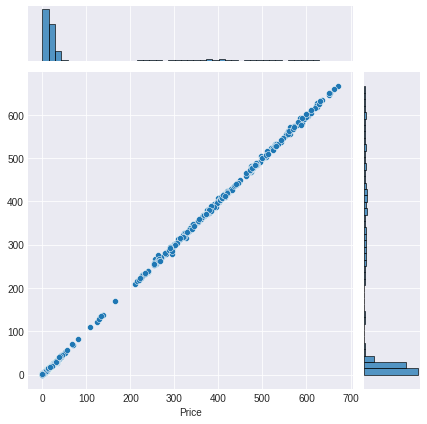

In [ ]:
# True vs Predicted plot of XGB model on the Train and Test data
sns.jointplot(x=y_train, y=y_train_pred_xgb)

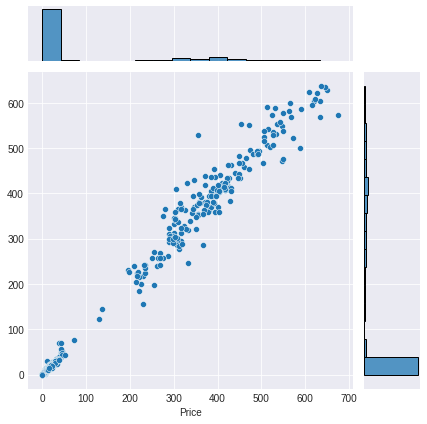

In [ ]:
sns.jointplot(x=y_test, y=y_test_pred_xgb)

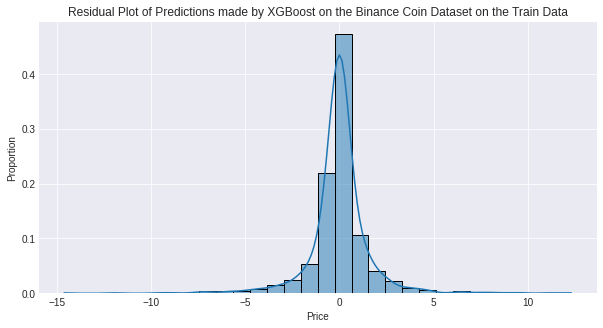

In [ ]:
#Residual Plots of Train and Test sets of xgb Model
plt.figure(figsize=(10,5))
plt.title("Residual Plot of Predictions made by XGBoost on the Binance Coin Dataset on the Train Data")
residuals_df = y_train_pred_xgb - y_train
sns.histplot(x = residuals_df, kde=True, stat='proportion', bins=30)

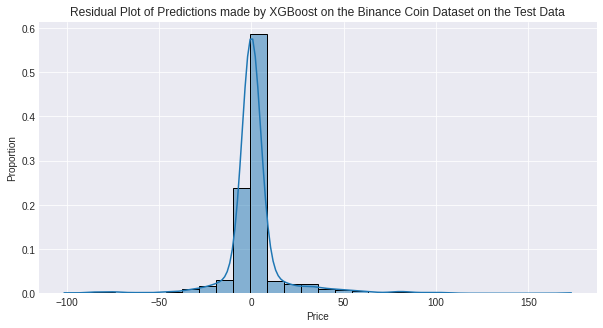

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Residual Plot of Predictions made by XGBoost on the Binance Coin Dataset on the Test Data")
residuals_df = y_test_pred_xgb - y_test
sns.histplot(x = residuals_df, kde=True, stat='proportion', bins=30)

## Random Forest

In [ ]:
# create regressor object
rf_reg = RandomForestRegressor()
  
# fit the regressor with x and y data
rf_reg.fit(X_train, y_train) 

RandomForestRegressor()

In [ ]:
# evaluation of the model on train and test sets of data
y_train_pred_rf = rf_reg.predict(X_train)

rf_train_mae = mean_absolute_error(y_train, y_train_pred_rf)
rf_train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred_rf))
rf_train_mape = mean_absolute_percentage_error(y_train, y_train_pred_rf)
rf_train_r2 = r2_score(y_train, y_train_pred_rf)

print(f"Train MAE Random Forest Regressor on Binance Coin Dataset: {rf_train_mae}")
print(f"Train MAPE Random Forest Regressor on Binance Coin Dataset: {rf_train_mape}")
print(f"Train RMSE Random Forest Regressor on Binance Coin Dataset: {rf_train_rmse}")
print(f"Train R2 Random Forest Regressor on Binance Coin Dataset: {rf_train_r2}")

Train MAE Random Forest Regressor on Binance Coin Dataset: 2.931598123837206
Train MAPE Random Forest Regressor on Binance Coin Dataset: 1382986096116.0925
Train RMSE Random Forest Regressor on Binance Coin Dataset: 8.013025770523084
Train R2 Random Forest Regressor on Binance Coin Dataset: 0.9980434624636836


In [ ]:
y_test_pred_rf = rf_reg.predict(X_test)

test_mae_rf = mean_absolute_error(y_test, y_test_pred_rf)
test_mape_rf = mean_absolute_percentage_error(y_test, y_test_pred_rf)
test_rmse_rf = np.sqrt(mean_squared_error(y_test, y_test_pred_rf))
test_r2_rf = r2_score(y_test, y_test_pred_rf)

print(f"Test MAE of Random Forest Regressor on Binance Coin Dataset: {test_mae_rf}")
print(f"Test MAPE of Random Forest Regressor on Binance Coin Dataset: {test_mape_rf}")
print(f"Test RMSE of Random Forest Regressor on Binance Coin Dataset: {test_rmse_rf}")
print(f"Test R2 Random Forest Regressor on Binance Coin Dataset: {test_r2_rf}")

Test MAE of Random Forest Regressor on Binance Coin Dataset: 7.821097279128271
Test MAPE of Random Forest Regressor on Binance Coin Dataset: 74597334045642.05
Test RMSE of Random Forest Regressor on Binance Coin Dataset: 20.3976989754387
Test R2 Random Forest Regressor on Binance Coin Dataset: 0.9862074272681558


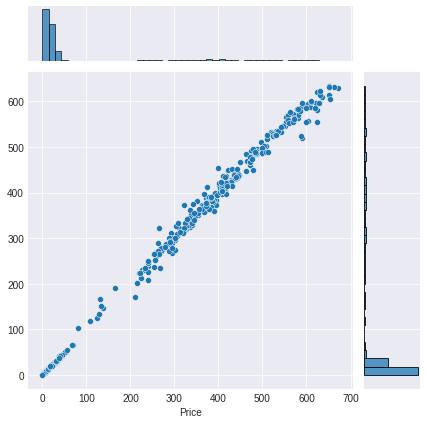

In [ ]:
# True vs Predicted plot of RF model on the Train and Test data
sns.jointplot(x=y_train, y=y_train_pred_rf)

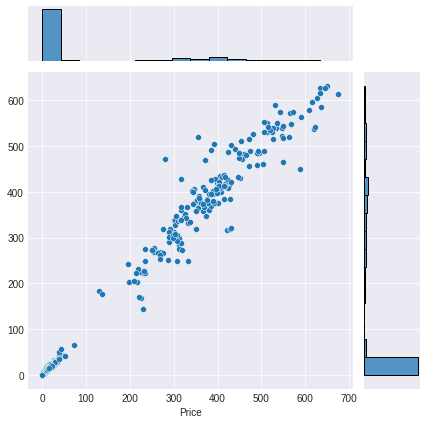

In [ ]:
# True vs Predicted plot of RF model on the Train and Test data
sns.jointplot(x=y_test, y=y_test_pred_rf)

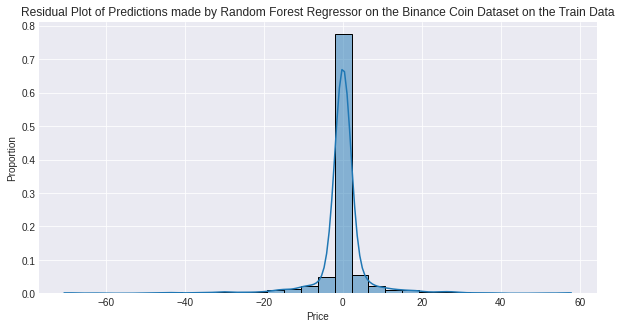

In [ ]:
#Residual Plots of Train and Test sets of RF Model
plt.figure(figsize=(10,5))
plt.title("Residual Plot of Predictions made by Random Forest Regressor on the Binance Coin Dataset on the Train Data")
residuals_df = y_train_pred_rf - y_train
sns.histplot(x = residuals_df, kde=True, stat='proportion', bins=30)

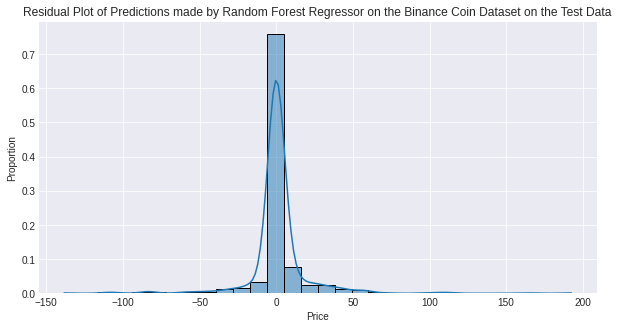

In [ ]:
#Residual Plots of Train and Test sets of RF Model
plt.figure(figsize=(10,5))
plt.title("Residual Plot of Predictions made by Random Forest Regressor on the Binance Coin Dataset on the Test Data")
residuals_df = y_test_pred_rf - y_test
sns.histplot(x = residuals_df, kde=True, stat='proportion', bins=30)

## Summary of Results

In [ ]:
# Summarisation of the Model Results
models = ['XGBoost','Random Forest Regressor']
mae = [test_mae_xgb, test_mae_rf]
rmse = [test_rmse_xgb, test_rmse_rf]
mape = [test_mape_xgb, test_mape_rf]
r2 = [test_r2_xgb, test_r2_rf]

In [ ]:
# Creating a dictionary to store the results 
d = {'Models':models, 'MAE':mae, 'MAPE':mape, 'RMSE':rmse, 'R2-Score':r2}

# using that dictionary to create a dataframe of the results to display as a table
result = pd.DataFrame(d)
result

,Models,MAE,MAPE,RMSE,R2-Score
0,XGBoost,7.222884,2.310413e+14,17.861805,0.989424
1,Random Forest Regressor,7.821097,7.459733e+13,20.397699,0.986207


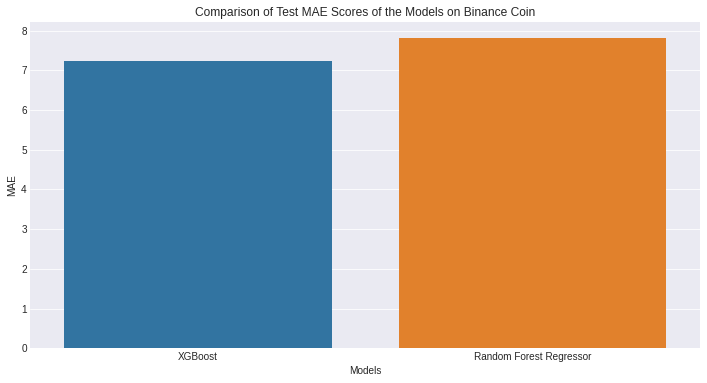

In [ ]:
# Displaying the models MAE values as a bar plot
plt.figure(figsize=(12,6))
plt.title("Comparison of Test MAE Scores of the Models on Binance Coin")
sns.barplot(x="Models", y="MAE", data=result, ci=None)

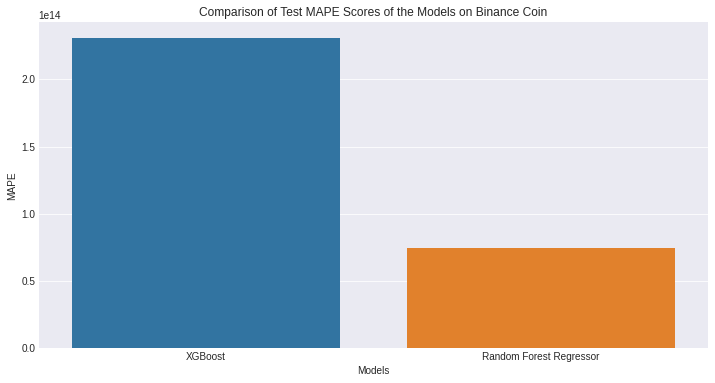

In [ ]:
# comparison of MAPE values of the models on the test set
plt.figure(figsize=(12,6))
plt.title("Comparison of Test MAPE Scores of the Models on Binance Coin")
sns.barplot(x="Models", y="MAPE", data=result, ci=None)

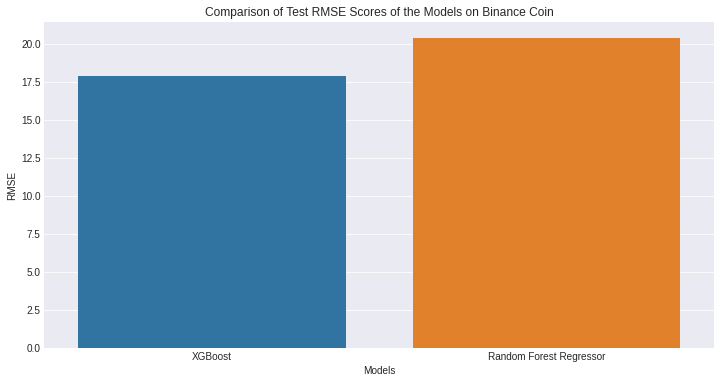

In [ ]:
# Displaying the models RMSE values as a bar plot
plt.figure(figsize=(12,6))
plt.title("Comparison of Test RMSE Scores of the Models on Binance Coin")
sns.barplot(x="Models", y="RMSE", data=result, ci=None)

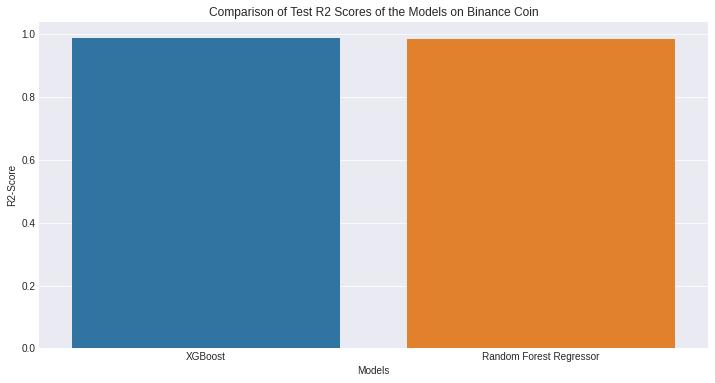

In [ ]:
# Displaying the models R2 values as a bar plot
plt.figure(figsize=(12,6))
plt.title("Comparison of Test R2 Scores of the Models on Binance Coin")
sns.barplot(x="Models", y="R2-Score", data=result, ci=None)

# 4 Dogecoin Price Prediction

## Data Loading and Inspection

In [ ]:
# Reading the csv file of Dogecoin
dogestamp = pd.read_csv("drive/My Drive/Bitcoin_Project/Final Datasets/Dogecoin.csv")
dogestamp.head()

,Index,Date,Currency,Initial,Price (USD),GH Repo,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA (USD),LSE (USD),Gold (USD),Oil (USD)
0,1,01/01/2017,Dogecoin,DOGE,0.0,dogecoin/dogecoin,0,0,0,0,0,"19,762.00","7,142.83","1,162.00",54.03
1,2,02/01/2017,Dogecoin,DOGE,0.0,dogecoin/dogecoin,0,0,0,0,0,"19,762.00","7,142.83","1,162.00",54.03
2,3,03/01/2017,Dogecoin,DOGE,0.0,dogecoin/dogecoin,0,0,0,0,0,"19,881.76","7,177.89","1,162.00",52.33
3,4,04/01/2017,Dogecoin,DOGE,0.0,dogecoin/dogecoin,0,0,0,0,0,"19,942.16","7,189.74","1,165.30",53.26
4,5,05/01/2017,Dogecoin,DOGE,0.0,dogecoin/dogecoin,0,0,0,0,0,"19,899.29","7,195.31","1,181.30",53.76


In [ ]:
# getting information about the dataset
dogestamp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2007 entries, 0 to 2006
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Index             2007 non-null   int64  
 1   Date              2007 non-null   object 
 2   Currency          2007 non-null   object 
 3   Initial           2007 non-null   object 
 4    Price (USD)      2007 non-null   float64
 5   GH Repo           2007 non-null   object 
 6   ForkEvent         2007 non-null   int64  
 7   IssuesEvent       2007 non-null   int64  
 8   PullRequestEvent  2007 non-null   int64  
 9   WatchEvent        2007 non-null   int64  
 10  PushEvent         2007 non-null   int64  
 11   DJIA (USD)       2007 non-null   object 
 12   LSE (USD)        2007 non-null   object 
 13   Gold (USD)       2007 non-null   object 
 14   Oil (USD)        2007 non-null   float64
dtypes: float64(2), int64(6), object(7)
memory usage: 235.3+ KB


In [ ]:
# descriptive statistics about the dataset
dogestamp.describe(include='all')

,Index,Date,Currency,Initial,Price (USD),GH Repo,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA (USD),LSE (USD),Gold (USD),Oil (USD)
count,2007.000000,2007,2007,2007,2007.000000,2007,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007,2007,2007,2007.000000
unique,NaN,2007,1,1,NaN,1,NaN,NaN,NaN,NaN,NaN,1382,1385,1210,NaN
top,NaN,01/01/2017,Dogecoin,DOGE,NaN,dogecoin/dogecoin,NaN,NaN,NaN,NaN,NaN,"24,103.11","7,547.63","1,196.20",NaN
freq,NaN,1,2007,2007,NaN,2007,NaN,NaN,NaN,NaN,NaN,4,7,7,NaN
mean,1004.000000,NaN,NaN,NaN,0.050082,NaN,1.210762,0.692576,0.648729,6.766318,0.194818,NaN,NaN,NaN,60.204245
std,579.515315,NaN,NaN,NaN,0.097308,NaN,3.442437,4.864327,2.018528,29.535937,0.765282,NaN,NaN,NaN,17.940887
min,1.000000,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,10.010000
25%,502.500000,NaN,NaN,NaN,0.002000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,49.885000
50%,1004.000000,NaN,NaN,NaN,0.003000,NaN,0.000000,0.000000,0.000000,1.000000,0.000000,NaN,NaN,NaN,57.770000
75%,1505.500000,NaN,NaN,NaN,0.050500,NaN,1.000000,0.000000,0.000000,3.000000,0.000000,NaN,NaN,NaN,68.145000


In [ ]:
# Identification of missing values
dogestamp.isnull().sum()

Index               0
Date                0
Currency            0
Initial             0
 Price (USD)        0
GH Repo             0
ForkEvent           0
IssuesEvent         0
PullRequestEvent    0
WatchEvent          0
PushEvent           0
 DJIA (USD)         0
 LSE (USD)          0
 Gold (USD)         0
 Oil (USD)          0
dtype: int64

### Data Handling

In [ ]:
# Currency, Initial and GH Repo can be dropped before training the models
# The models won't learn any important information from these features

# renaming some column names to make analysis easier
dogestamp = dogestamp.rename(columns={' Price (USD) ':'Price',' DJIA (USD) ':'DJIA',' LSE (USD) ':'LSE',' Gold (USD) ':'Gold',' Oil (USD) ':'Oil'})
dogestamp.columns

Index(['Index', 'Date', 'Currency', 'Initial', 'Price', 'GH Repo', 'ForkEvent',
       'IssuesEvent', 'PullRequestEvent', 'WatchEvent', 'PushEvent', 'DJIA',
       'LSE', 'Gold', 'Oil'],
      dtype='object')

In [ ]:
# Checking the values of Currency, Initial and GH Repo
dogestamp['Currency'].value_counts()

Dogecoin    2007
Name: Currency, dtype: int64

In [ ]:
# Checking the values of Currency, Initial and GH Repo
dogestamp['Initial'].value_counts()

DOGE    2007
Name: Initial, dtype: int64

In [ ]:
# Checking the values of Currency, Initial and GH Repo
dogestamp['GH Repo'].value_counts()

dogecoin/dogecoin    2007
Name: GH Repo, dtype: int64

In [ ]:
# Dropping the unnecessary columns from the dataset
dogestamp = dogestamp.drop(columns=['Index','Currency','Initial','GH Repo'])
dogestamp.head()

,Date,Price,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil
0,01/01/2017,0.0,0,0,0,0,0,"19,762.00","7,142.83","1,162.00",54.03
1,02/01/2017,0.0,0,0,0,0,0,"19,762.00","7,142.83","1,162.00",54.03
2,03/01/2017,0.0,0,0,0,0,0,"19,881.76","7,177.89","1,162.00",52.33
3,04/01/2017,0.0,0,0,0,0,0,"19,942.16","7,189.74","1,165.30",53.26
4,05/01/2017,0.0,0,0,0,0,0,"19,899.29","7,195.31","1,181.30",53.76


In [ ]:
# Getting rid of the commas from the dataset to convert the strings to floats
dogestamp = dogestamp.replace(',','', regex=True)
dogestamp.head()

,Date,Price,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil
0,01/01/2017,0.0,0,0,0,0,0,19762.00,7142.83,1162.00,54.03
1,02/01/2017,0.0,0,0,0,0,0,19762.00,7142.83,1162.00,54.03
2,03/01/2017,0.0,0,0,0,0,0,19881.76,7177.89,1162.00,52.33
3,04/01/2017,0.0,0,0,0,0,0,19942.16,7189.74,1165.30,53.26
4,05/01/2017,0.0,0,0,0,0,0,19899.29,7195.31,1181.30,53.76


In [ ]:
# Converting strings to floats
dogestamp = dogestamp.astype({'DJIA':'float','Gold':'float','LSE':'float','Oil':'float'})
dogestamp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2007 entries, 0 to 2006
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Date              2007 non-null   object 
 1   Price             2007 non-null   float64
 2   ForkEvent         2007 non-null   int64  
 3   IssuesEvent       2007 non-null   int64  
 4   PullRequestEvent  2007 non-null   int64  
 5   WatchEvent        2007 non-null   int64  
 6   PushEvent         2007 non-null   int64  
 7   DJIA              2007 non-null   float64
 8   LSE               2007 non-null   float64
 9   Gold              2007 non-null   float64
 10  Oil               2007 non-null   float64
dtypes: float64(5), int64(5), object(1)
memory usage: 172.6+ KB


In [ ]:
# descriptive statistics about the dataset
dogestamp.describe(include='all')

,Date,Price,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil
count,2007,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000
unique,2007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,01/01/2017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,0.050082,1.210762,0.692576,0.648729,6.766318,0.194818,27440.167100,7090.837862,1535.141256,60.204245
std,NaN,0.097308,3.442437,4.864327,2.018528,29.535937,0.765282,4602.059976,525.839133,265.680739,17.940887
min,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18591.930000,4993.890000,1162.000000,10.010000
25%,NaN,0.002000,0.000000,0.000000,0.000000,0.000000,0.000000,24360.830000,6963.890000,1283.400000,49.885000
50%,NaN,0.003000,0.000000,0.000000,0.000000,1.000000,0.000000,26355.470000,7247.080000,1487.500000,57.770000
75%,NaN,0.050500,1.000000,0.000000,0.000000,3.000000,0.000000,31035.220000,7441.525000,1802.400000,68.145000


### Data Exploration

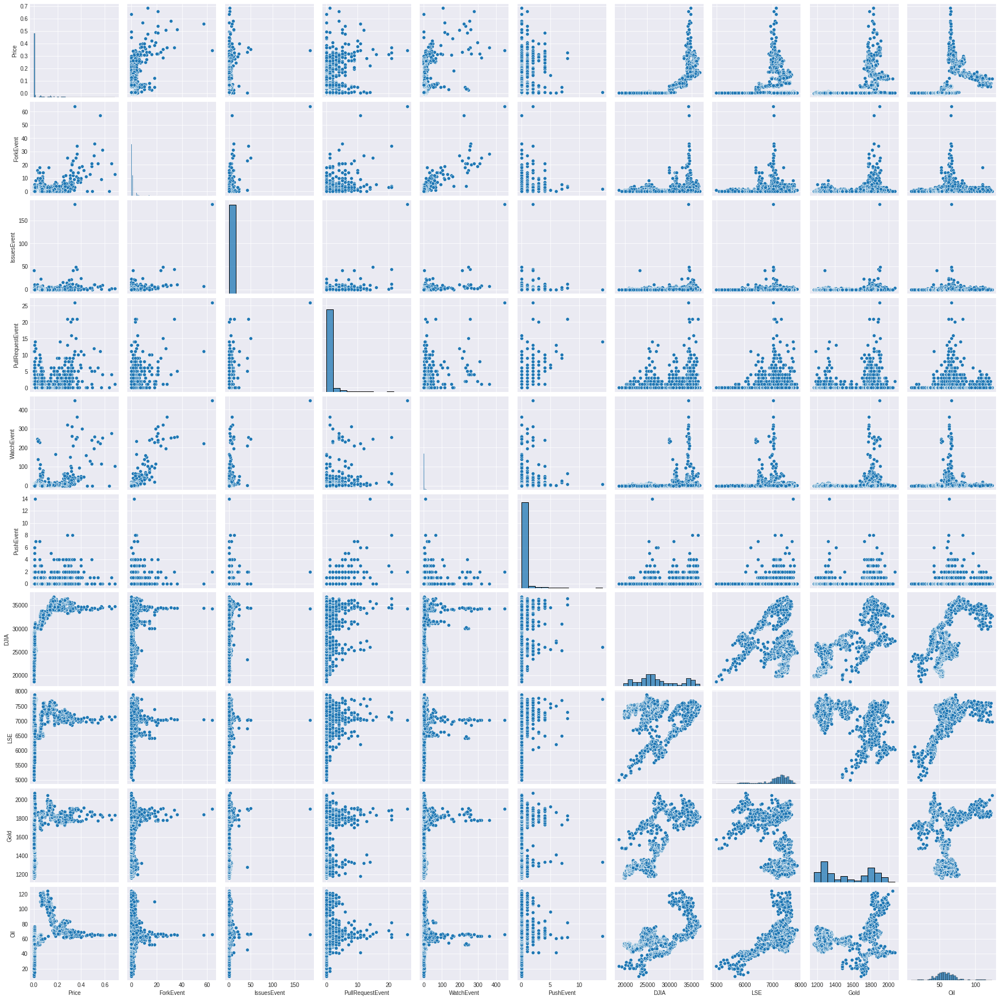

In [ ]:
# generating a pariplot of Dogecoin dataset to see the correlationships between all the variables
sns.pairplot(data=dogestamp)

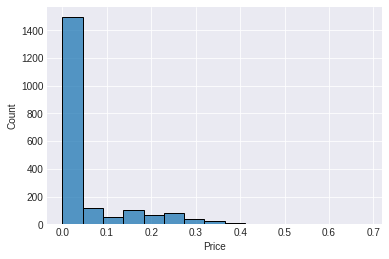

In [ ]:
# Distribution of the Dogecoin price in the dataset
sns.histplot(x='Price',bins=15,data=dogestamp)

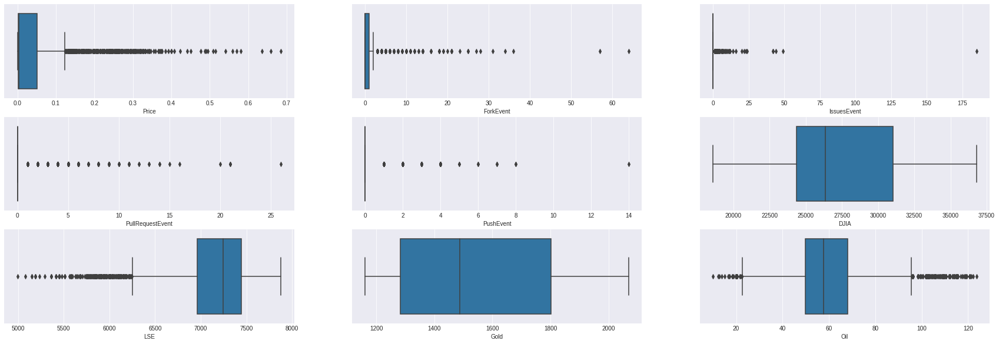

In [ ]:
# Drawing barplots of the features to see outliers

fig, axs = plt.subplots(3, 3, figsize=(30, 10), sharey=True)
#fig, (ax1, ax2, ax3, ax4) = plt.subplots(ncols=4, sharey=True, figsize=(25,6))
sns.boxplot(x=dogestamp['Price'], data=dogestamp, ax=axs[0,0])
sns.boxplot(x=dogestamp['ForkEvent'], data=dogestamp, ax=axs[0,1])
sns.boxplot(x=dogestamp['IssuesEvent'], data=dogestamp, ax=axs[0,2])
sns.boxplot(x=dogestamp['PullRequestEvent'], data=dogestamp, ax=axs[1,0])
sns.boxplot(x=dogestamp['PushEvent'], data=dogestamp, ax=axs[1,1])
sns.boxplot(x=dogestamp['DJIA'], data=dogestamp, ax=axs[1,2])
sns.boxplot(x=dogestamp['LSE'], data=dogestamp, ax=axs[2,0])
sns.boxplot(x=dogestamp['Gold'], data=dogestamp, ax=axs[2,1])
sns.boxplot(x=dogestamp['Oil'], data=dogestamp, ax=axs[2,2])

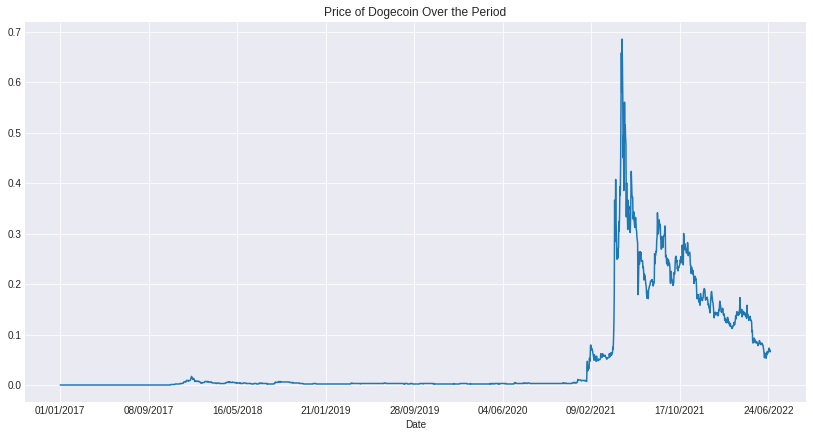

In [ ]:
# Some data analysis
dogestamp.set_index("Date").Price.plot(figsize=(14,7), title="Price of Dogecoin Over the Period")

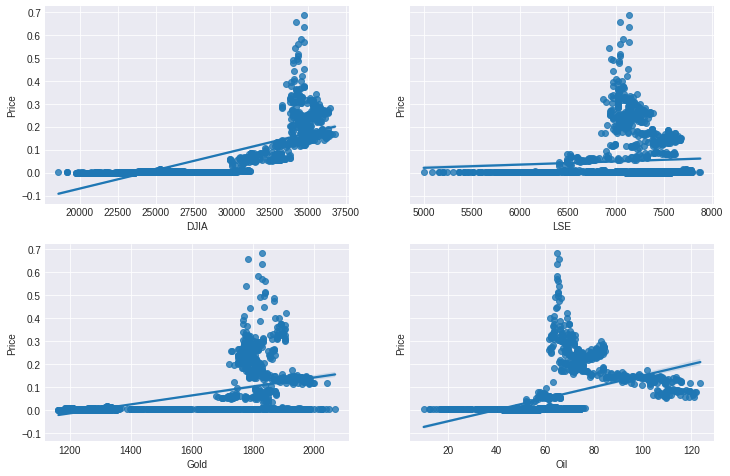

In [ ]:
# I find DJIA, LSE, Gold and Oil Interesting so lets chek their impact on Dogecoin price

fig, axs = plt.subplots(2, 2, figsize=(12, 8), sharey=True)
sns.regplot(x=dogestamp['DJIA'], y=dogestamp['Price'], ax=axs[0, 0])
sns.regplot(x=dogestamp['LSE'], y=dogestamp['Price'], ax=axs[0, 1])
sns.regplot(x=dogestamp['Gold'], y=dogestamp['Price'], ax=axs[1, 0])
sns.regplot(x=dogestamp['Oil'], y=dogestamp['Price'], ax=axs[1, 1])

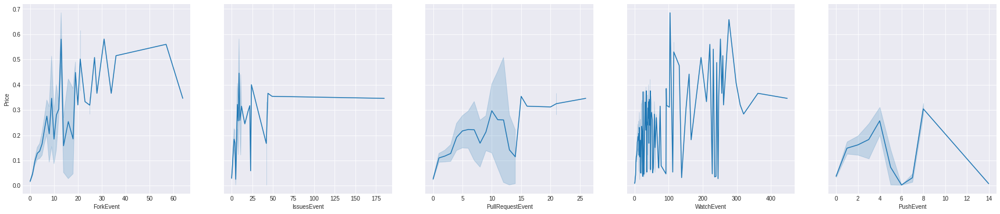

In [ ]:
# Lets have a look at the relationships of
# ForkEvent	IssuesEvent	PullRequestEvent	WatchEvent	PushEvent	against price by lineplots

fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(ncols=5, sharey=True, figsize=(30,6))
sns.lineplot(x=dogestamp['ForkEvent'], y=dogestamp['Price'], ax=ax1)
sns.lineplot(x=dogestamp['IssuesEvent'], y=dogestamp['Price'], ax=ax2)
sns.lineplot(x=dogestamp['PullRequestEvent'], y=dogestamp['Price'], ax=ax3)
sns.lineplot(x=dogestamp['WatchEvent'], y=dogestamp['Price'], ax=ax4)
sns.lineplot(x=dogestamp['PushEvent'], y=dogestamp['Price'], ax=ax5)

Text(0.5, 1.0, '1-Month Lag')

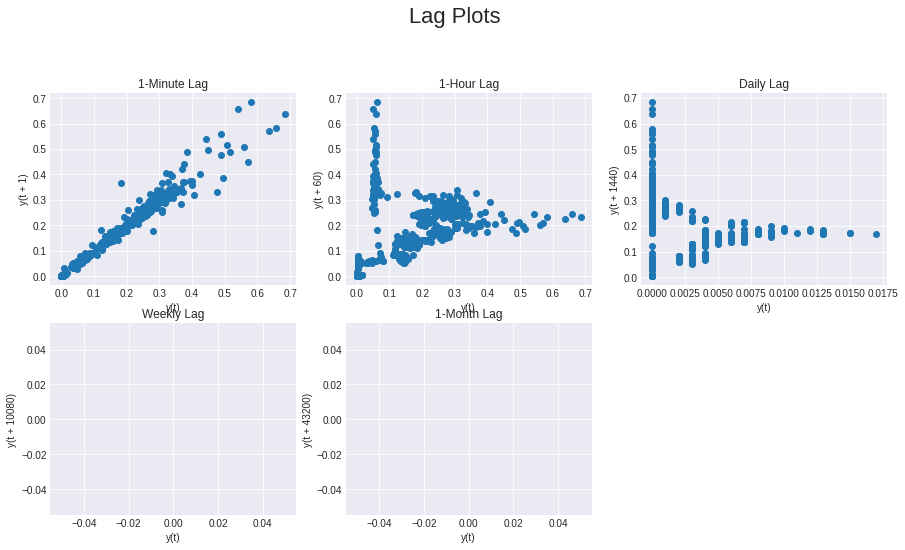

In [ ]:
# Since we are working with time series data let's do some lag plots

#daily, weekly, monthly these can't be plotted

plt.figure(figsize=(15,12))
plt.suptitle('Lag Plots', fontsize=22)

plt.subplot(3,3,1)
pd.plotting.lag_plot(dogestamp['Price'], lag=1) #minute lag
plt.title('1-Minute Lag')

plt.subplot(3,3,2)
pd.plotting.lag_plot(dogestamp['Price'], lag=60) #hourley lag
plt.title('1-Hour Lag')

plt.subplot(3,3,3)
pd.plotting.lag_plot(dogestamp['Price'], lag=1440) #Daily lag
plt.title('Daily Lag')

plt.subplot(3,3,4)
pd.plotting.lag_plot(dogestamp['Price'], lag=10080) #weekly lag
plt.title('Weekly Lag')

plt.subplot(3,3,5)
pd.plotting.lag_plot(dogestamp['Price'], lag=43200) #month lag
plt.title('1-Month Lag')

### Stationarity Check

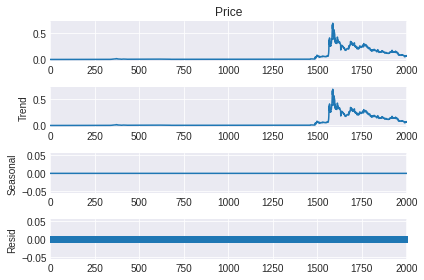

<Figure size 1080x864 with 0 Axes>

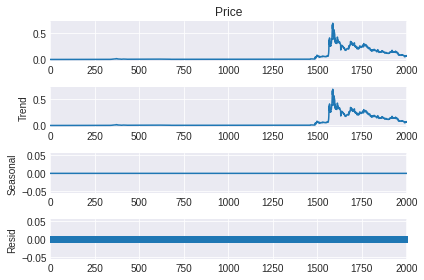

In [ ]:
plt.figure(figsize=(15,12))
series = dogestamp.Price
result = seasonal_decompose(series, model='additive',period=1)
result.plot()

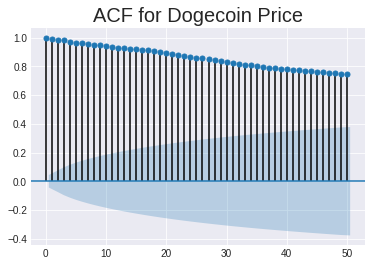

In [ ]:
acf = plot_acf(series, lags=50, alpha=0.05)
plt.title("ACF for Dogecoin Price", size=20)
plt.show()

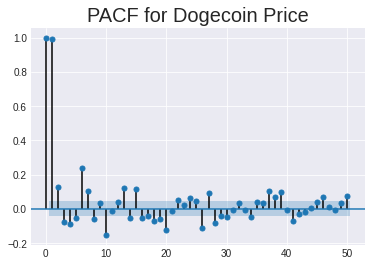

In [ ]:
plot_pacf(series, lags=50, alpha=0.05, method='ols')
plt.title("PACF for Dogecoin Price", size=20)
plt.show()

#### KPSS Test

In [ ]:
# Null hypothesis = Series is Stationary
# Alternative Hypothesis - Series is not Stationary

stats, p, lags, critical_values = kpss(series, 'ct')

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1875: FutureWarning: The behavior of using nlags=None will change in release 0.13.Currently nlags=None is the same as nlags="legacy", and so a sample-size lag length is used. After the next release, the default will change to be the same as nlags="auto" which uses an automatic lag length selection method. To silence this warning, either use "auto" or "legacy"
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1907: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warn_msg.format(direction="smaller"), InterpolationWarning


In [ ]:
print(f'Test Statistics : {stats}')
print(f'p-value : {p}')
print(f'Critical Values : {critical_values}')

if p < 0.05:
    print('Series is not Stationary')
else:
    print('Series is Stationary')

Test Statistics : 0.6481870199003881
p-value : 0.01
Critical Values : {'10%': 0.119, '5%': 0.146, '2.5%': 0.176, '1%': 0.216}
Series is not Stationary


#### ADF Test

In [ ]:
result = adfuller(series)

In [ ]:
print(f'Test Statistics : {result[0]}')
print(f'p-value : {result[1]}')
print(f'Critical Values : {result[4]}')
print(f'Lags : {result[5]}')

if result[1] > 0.05:
    print('Series is not Stationary')
else:
    print('Series is Stationary')

Test Statistics : -2.3162499540042947
p-value : 0.1667805856800798
Critical Values : {'1%': -3.433656968706682, '5%': -2.863000832624789, '10%': -2.567547686205489}
Lags : -12391.944737401831
Series is not Stationary


### Feature Engineering

In [ ]:
# We can extract important features from the Date column
# first we need to convert the Date to datetime format
dogestamp['Date'] = pd.to_datetime(dogestamp['Date'])
dogestamp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2007 entries, 0 to 2006
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Date              2007 non-null   datetime64[ns]
 1   Price             2007 non-null   float64       
 2   ForkEvent         2007 non-null   int64         
 3   IssuesEvent       2007 non-null   int64         
 4   PullRequestEvent  2007 non-null   int64         
 5   WatchEvent        2007 non-null   int64         
 6   PushEvent         2007 non-null   int64         
 7   DJIA              2007 non-null   float64       
 8   LSE               2007 non-null   float64       
 9   Gold              2007 non-null   float64       
 10  Oil               2007 non-null   float64       
dtypes: datetime64[ns](1), float64(5), int64(5)
memory usage: 172.6 KB


In [ ]:
# Creation of the features and adding them to the dataset
dogestamp["year"] = dogestamp.Date.dt.year
dogestamp["month"] = dogestamp.Date.dt.month
dogestamp["day"] = dogestamp.Date.dt.day
dogestamp["day_of_week"] = dogestamp.Date.dt.dayofweek
dogestamp.head()

,Date,Price,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil,year,month,day,day_of_week
0,2017-01-01,0.0,0,0,0,0,0,19762.00,7142.83,1162.0,54.03,2017,1,1,6
1,2017-02-01,0.0,0,0,0,0,0,19762.00,7142.83,1162.0,54.03,2017,2,1,2
2,2017-03-01,0.0,0,0,0,0,0,19881.76,7177.89,1162.0,52.33,2017,3,1,2
3,2017-04-01,0.0,0,0,0,0,0,19942.16,7189.74,1165.3,53.26,2017,4,1,5
4,2017-05-01,0.0,0,0,0,0,0,19899.29,7195.31,1181.3,53.76,2017,5,1,0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  after removing the cwd from sys.path.


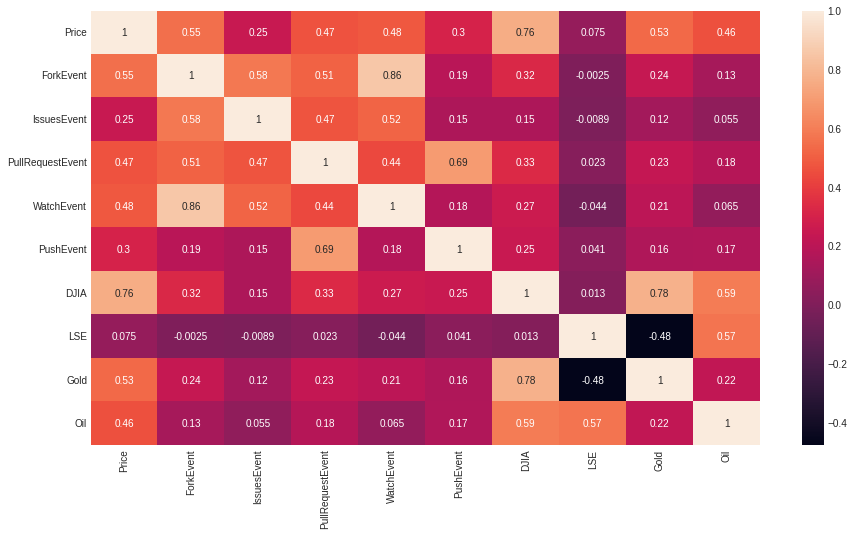

In [ ]:
# Lets have a look at the correlation matrix of all the features (except date)
corr = dogestamp.drop(columns=['Date','year','month','day','day_of_week'])
corr = corr.corr()
corr.style.background_gradient(cmap='PuOr_r').set_precision(2)
plt.figure(figsize=(15,8))
sns.heatmap(corr, annot=True)

### Data Preparation

In [ ]:
# we need to split our data into train and test sets
# the first step we are taking price as y and the rest of the features as X
X = dogestamp.drop(columns=['Price','Date'])
y = dogestamp['Price']
X.head()

,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil,year,month,day,day_of_week
0,0,0,0,0,0,19762.00,7142.83,1162.0,54.03,2017,1,1,6
1,0,0,0,0,0,19762.00,7142.83,1162.0,54.03,2017,2,1,2
2,0,0,0,0,0,19881.76,7177.89,1162.0,52.33,2017,3,1,2
3,0,0,0,0,0,19942.16,7189.74,1165.3,53.26,2017,4,1,5
4,0,0,0,0,0,19899.29,7195.31,1181.3,53.76,2017,5,1,0


In [ ]:
y.head()

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Price, dtype: float64

In [ ]:
# Then we are splitting the data into training and test sets with a train size of 60%
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, train_size = 0.6)

## XGBoost

In [ ]:
# creating the regressor model
reg = xgb.XGBRegressor()

In [ ]:
## Hyper Parameter Optimization Grid

params={
 "learning_rate"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30],
 "max_depth"        : [1, 3, 4, 5, 6, 7],
 "n_estimators"     : [int(x) for x in np.linspace(start=100, stop=2000, num=10)],
 "min_child_weight" : [int(x) for x in np.arange(3, 15, 1)],
 "gamma"            : [ 0.0, 0.1, 0.2 , 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1],
 "subsample"        : [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1],
 "colsample_bytree" : [0.5, 0.6, 0.7, 0.8, 0.9, 1],
 "colsample_bylevel": [0.5, 0.6, 0.7, 0.8, 0.9, 1],  
 
}

In [ ]:
# Model with the grid search parameters
model  = RandomizedSearchCV(    
                reg,
                param_distributions=params,
                n_iter=10,
                n_jobs=-1,
                cv=5,
                verbose=3,
)

In [ ]:
# fitting the model
model.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[17:55:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


RandomizedSearchCV(cv=5, estimator=XGBRegressor(), n_jobs=-1,
                   param_distributions={'colsample_bylevel': [0.5, 0.6, 0.7,
                                                              0.8, 0.9, 1],
                                        'colsample_bytree': [0.5, 0.6, 0.7, 0.8,
                                                             0.9, 1],
                                        'gamma': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5,
                                                  0.6, 0.7, 0.8, 0.9, 1],
                                        'learning_rate': [0.05, 0.1, 0.15, 0.2,
                                                          0.25, 0.3],
                                        'max_depth': [1, 3, 4, 5, 6, 7],
                                        'min_child_weight': [3, 4, 5, 6, 7, 8,
                                                             9, 10, 11, 12, 13,
                                                             14],
                                

In [ ]:
# evaluation of the model on train and test sets of data
y_train_pred_xgb = model.predict(X_train)

xgb_train_mae = mean_absolute_error(y_train, y_train_pred_xgb)
xgb_train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred_xgb))
xgb_train_mape = mean_absolute_percentage_error(y_train, y_train_pred_xgb)
xgb_train_r2 = r2_score(y_train, y_train_pred_xgb)

print(f"Train MAE XGBoost on Dogecoin Dataset: {xgb_train_mae}")
print(f"Train MAPE XGBoost on Dogecoin Dataset: {xgb_train_mape}")
print(f"Train RMSE XGBoost on Dogecoin Dataset: {xgb_train_rmse}")
print(f"Train R2 XGBoost on Dogecoin Dataset: {xgb_train_r2}")

Train MAE XGBoost on Dogecoin Dataset: 0.0010218595519810422
Train MAPE XGBoost on Dogecoin Dataset: 235814193934.6027
Train RMSE XGBoost on Dogecoin Dataset: 0.0016191748911589458
Train R2 XGBoost on Dogecoin Dataset: 0.9997237970177432


In [ ]:
y_test_pred_xgb = model.predict(X_test)

test_mae_xgb = mean_absolute_error(y_test, y_test_pred_xgb)
test_mape_xgb = mean_absolute_percentage_error(y_test, y_test_pred_xgb)
test_rmse_xgb = np.sqrt(mean_squared_error(y_test, y_test_pred_xgb))
test_r2_xgb = r2_score(y_test, y_test_pred_xgb)

print(f"Test MAE of XGBoost on Dogecoin Dataset: {test_mae_xgb}")
print(f"Test MAPE of XGBoost on Dogecoin Dataset: {test_mape_xgb}")
print(f"Test RMSE of XGBoost on Dogecoin Dataset: {test_rmse_xgb}")
print(f"Test R2 XGBoost on Dogecoin Dataset: {test_r2_xgb}")

Test MAE of XGBoost on Dogecoin Dataset: 0.006517637155718109
Test MAPE of XGBoost on Dogecoin Dataset: 369211240830.81256
Test RMSE of XGBoost on Dogecoin Dataset: 0.017833068274469274
Test R2 XGBoost on Dogecoin Dataset: 0.9662477525064329


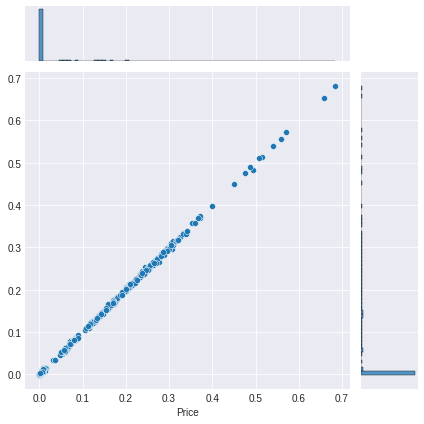

In [ ]:
# True vs Predicted plot of XGB model on the Train and Test data
sns.jointplot(x=y_train, y=y_train_pred_xgb)

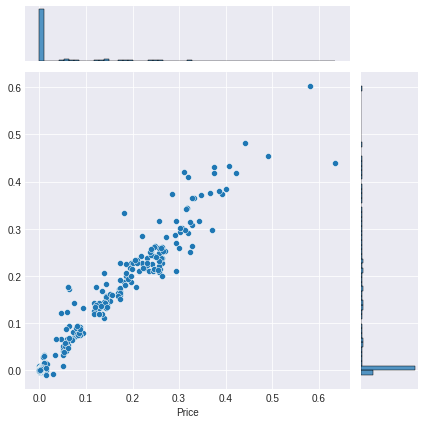

In [ ]:
sns.jointplot(x=y_test, y=y_test_pred_xgb)

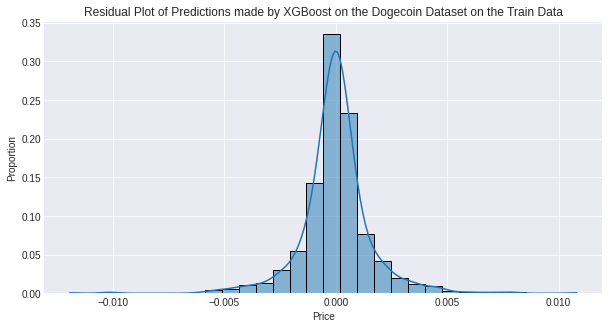

In [ ]:
#Residual Plots of Train and Test sets of xgb Model
plt.figure(figsize=(10,5))
plt.title("Residual Plot of Predictions made by XGBoost on the Dogecoin Dataset on the Train Data")
residuals_df = y_train_pred_xgb - y_train
sns.histplot(x = residuals_df, kde=True, stat='proportion', bins=30)

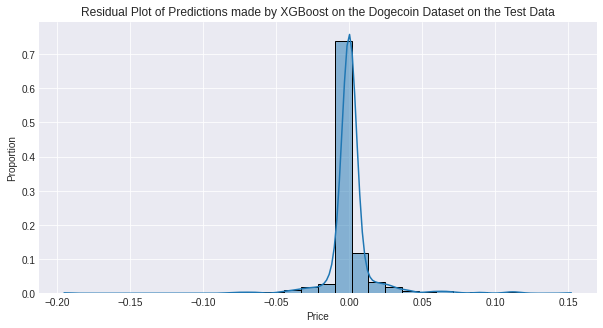

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Residual Plot of Predictions made by XGBoost on the Dogecoin Dataset on the Test Data")
residuals_df = y_test_pred_xgb - y_test
sns.histplot(x = residuals_df, kde=True, stat='proportion', bins=30)

## Random Forest

In [ ]:
# create regressor object
rf_reg = RandomForestRegressor()
  
# fit the regressor with x and y data
rf_reg.fit(X_train, y_train) 

RandomForestRegressor()

In [ ]:
# evaluation of the model on train and test sets of data
y_train_pred_rf = rf_reg.predict(X_train)

rf_train_mae = mean_absolute_error(y_train, y_train_pred_rf)
rf_train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred_rf))
rf_train_mape = mean_absolute_percentage_error(y_train, y_train_pred_rf)
rf_train_r2 = r2_score(y_train, y_train_pred_rf)

print(f"Train MAE Random Forest Regressor on Dogecoin Dataset: {rf_train_mae}")
print(f"Train MAPE Random Forest Regressor on Dogecoin Dataset: {rf_train_mape}")
print(f"Train RMSE Random Forest Regressor on Dogecoin Dataset: {rf_train_rmse}")
print(f"Train R2 Random Forest Regressor on Dogecoin Dataset: {rf_train_r2}")

Train MAE Random Forest Regressor on Dogecoin Dataset: 0.0018792441860465082
Train MAPE Random Forest Regressor on Dogecoin Dataset: 523674375.30943924
Train RMSE Random Forest Regressor on Dogecoin Dataset: 0.006740187533743627
Train R2 Random Forest Regressor on Dogecoin Dataset: 0.9952138665602711


In [ ]:
y_test_pred_rf = rf_reg.predict(X_test)

test_mae_rf = mean_absolute_error(y_test, y_test_pred_rf)
test_mape_rf = mean_absolute_percentage_error(y_test, y_test_pred_rf)
test_rmse_rf = np.sqrt(mean_squared_error(y_test, y_test_pred_rf))
test_r2_rf = r2_score(y_test, y_test_pred_rf)

print(f"Test MAE of Random Forest Regressor on Dogecoin Dataset: {test_mae_rf}")
print(f"Test MAPE of Random Forest Regressor on Dogecoin Dataset: {test_mape_rf}")
print(f"Test RMSE of Random Forest Regressor on Dogecoin Dataset: {test_rmse_rf}")
print(f"Test R2 Random Forest Regressor on Dogecoin Dataset: {test_r2_rf}")

Test MAE of Random Forest Regressor on Dogecoin Dataset: 0.0062080821917808214
Test MAPE of Random Forest Regressor on Dogecoin Dataset: 98989456317.80429
Test RMSE of Random Forest Regressor on Dogecoin Dataset: 0.020708154039196333
Test R2 Random Forest Regressor on Dogecoin Dataset: 0.9544872239535072


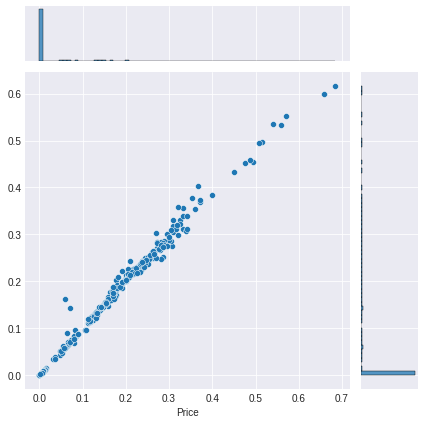

In [ ]:
# True vs Predicted plot of RF model on the Train and Test data
sns.jointplot(x=y_train, y=y_train_pred_rf)

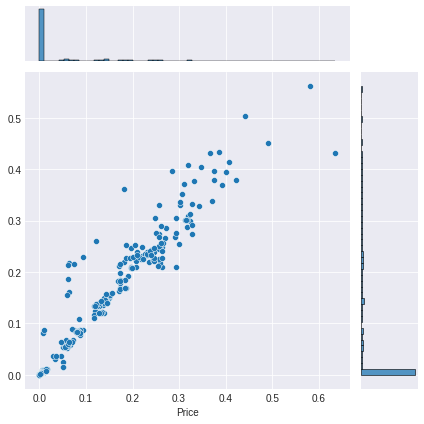

In [ ]:
# True vs Predicted plot of RF model on the Train and Test data
sns.jointplot(x=y_test, y=y_test_pred_rf)

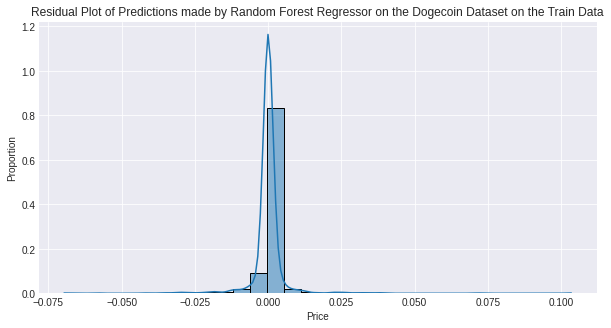

In [ ]:
#Residual Plots of Train and Test sets of RF Model
plt.figure(figsize=(10,5))
plt.title("Residual Plot of Predictions made by Random Forest Regressor on the Dogecoin Dataset on the Train Data")
residuals_df = y_train_pred_rf - y_train
sns.histplot(x = residuals_df, kde=True, stat='proportion', bins=30)

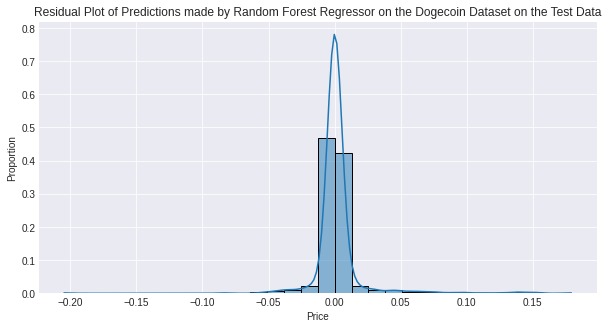

In [ ]:
#Residual Plots of Train and Test sets of RF Model
plt.figure(figsize=(10,5))
plt.title("Residual Plot of Predictions made by Random Forest Regressor on the Dogecoin Dataset on the Test Data")
residuals_df = y_test_pred_rf - y_test
sns.histplot(x = residuals_df, kde=True, stat='proportion', bins=30)

## Summary of Results

In [ ]:
# Summarisation of the Model Results
models = ['XGBoost','Random Forest Regressor']
mae = [test_mae_xgb, test_mae_rf]
rmse = [test_rmse_xgb, test_rmse_rf]
mape = [test_mape_xgb, test_mape_rf]
r2 = [test_r2_xgb, test_r2_rf]

In [ ]:
# Creating a dictionary to store the results 
d = {'Models':models, 'MAE':mae, 'MAPE':mape, 'RMSE':rmse, 'R2-Score':r2}

# using that dictionary to create a dataframe of the results to display as a table
result = pd.DataFrame(d)
result

,Models,MAE,MAPE,RMSE,R2-Score
0,XGBoost,0.006518,3.692112e+11,0.017833,0.966248
1,Random Forest Regressor,0.006208,9.898946e+10,0.020708,0.954487


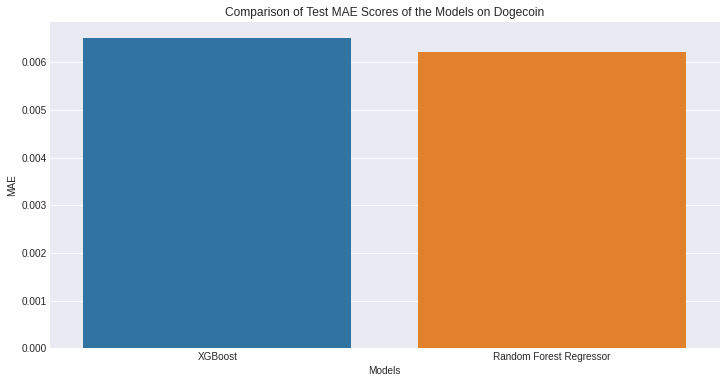

In [ ]:
# Displaying the models MAE values as a bar plot
plt.figure(figsize=(12,6))
plt.title("Comparison of Test MAE Scores of the Models on Dogecoin")
sns.barplot(x="Models", y="MAE", data=result, ci=None)

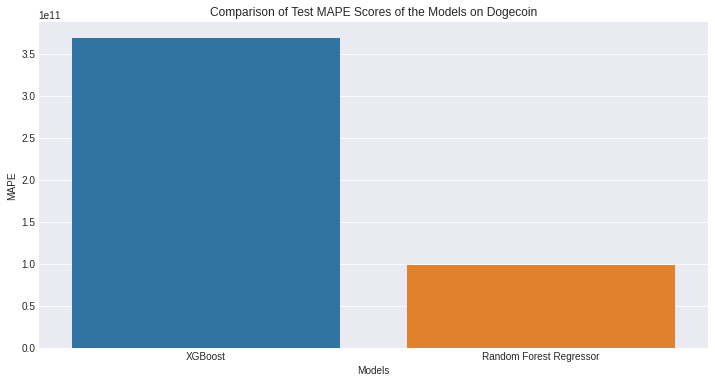

In [ ]:
# comparison of MAPE values of the models on the test set
plt.figure(figsize=(12,6))
plt.title("Comparison of Test MAPE Scores of the Models on Dogecoin")
sns.barplot(x="Models", y="MAPE", data=result, ci=None)

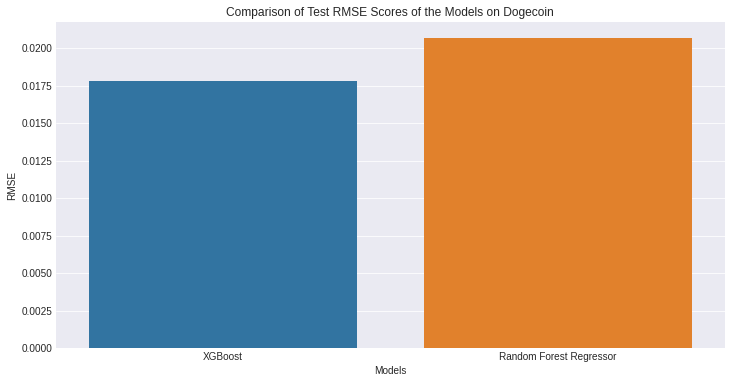

In [ ]:
# Displaying the models RMSE values as a bar plot
plt.figure(figsize=(12,6))
plt.title("Comparison of Test RMSE Scores of the Models on Dogecoin")
sns.barplot(x="Models", y="RMSE", data=result, ci=None)

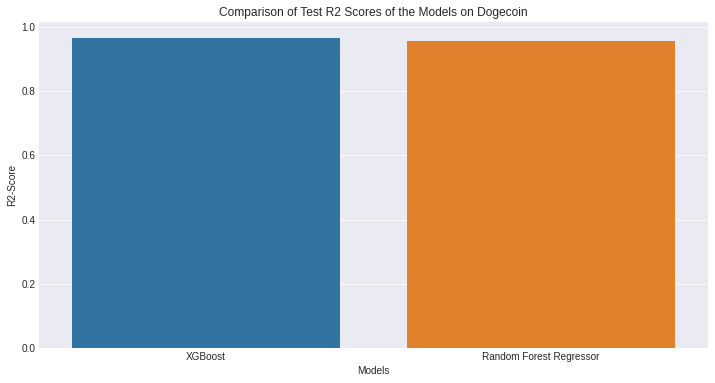

In [ ]:
# Displaying the models R2 values as a bar plot
plt.figure(figsize=(12,6))
plt.title("Comparison of Test R2 Scores of the Models on Dogecoin")
sns.barplot(x="Models", y="R2-Score", data=result, ci=None)

# 5 Polkadot Price Prediction

## Data Loading and Inspection

In [ ]:
# Reading the csv file of Bitcoin
dotstamp = pd.read_csv("drive/My Drive/Bitcoin_Project/Final Datasets/Polkadot.csv")
dotstamp.head()

,Index,Date,Currency,Initial,Price (USD),GH Repo,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA (USD),LSE (USD),Gold (USD),Oil (USD)
0,1,01/01/2017,Polkadot,DOT,0.0,paritytech/polkadot,0,0,0,0,0,"19,762.00","7,142.83","1,162.00",54.03
1,2,02/01/2017,Polkadot,DOT,0.0,paritytech/polkadot,0,0,0,0,0,"19,762.00","7,142.83","1,162.00",54.03
2,3,03/01/2017,Polkadot,DOT,0.0,paritytech/polkadot,0,0,0,0,0,"19,881.76","7,177.89","1,162.00",52.33
3,4,04/01/2017,Polkadot,DOT,0.0,paritytech/polkadot,0,0,0,0,0,"19,942.16","7,189.74","1,165.30",53.26
4,5,05/01/2017,Polkadot,DOT,0.0,paritytech/polkadot,0,0,0,0,0,"19,899.29","7,195.31","1,181.30",53.76


In [ ]:
# getting information about the dataset
dotstamp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2007 entries, 0 to 2006
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Index             2007 non-null   int64  
 1   Date              2007 non-null   object 
 2   Currency          2007 non-null   object 
 3   Initial           2007 non-null   object 
 4    Price (USD)      2007 non-null   float64
 5   GH Repo           2007 non-null   object 
 6   ForkEvent         2007 non-null   int64  
 7   IssuesEvent       2007 non-null   int64  
 8   PullRequestEvent  2007 non-null   int64  
 9   WatchEvent        2007 non-null   int64  
 10  PushEvent         2007 non-null   int64  
 11   DJIA (USD)       2007 non-null   object 
 12   LSE (USD)        2007 non-null   object 
 13   Gold (USD)       2007 non-null   object 
 14   Oil (USD)        2007 non-null   float64
dtypes: float64(2), int64(6), object(7)
memory usage: 235.3+ KB


In [ ]:
# descriptive statistics about the dataset
dotstamp.describe(include='all')

,Index,Date,Currency,Initial,Price (USD),GH Repo,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA (USD),LSE (USD),Gold (USD),Oil (USD)
count,2007.000000,2007,2007,2007,2007.000000,2007,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007,2007,2007,2007.000000
unique,NaN,2007,1,1,NaN,1,NaN,NaN,NaN,NaN,NaN,1382,1385,1210,NaN
top,NaN,01/01/2017,Polkadot,DOT,NaN,paritytech/polkadot,NaN,NaN,NaN,NaN,NaN,"24,103.11","7,547.63","1,196.20",NaN
freq,NaN,1,2007,2007,NaN,2007,NaN,NaN,NaN,NaN,NaN,4,7,7,NaN
mean,1004.000000,NaN,NaN,NaN,7.109018,NaN,0.732935,1.433981,4.082212,3.309915,9.639263,NaN,NaN,NaN,60.204245
std,579.515315,NaN,NaN,NaN,12.356804,NaN,1.217366,2.371419,5.416245,4.783093,13.350943,NaN,NaN,NaN,17.940887
min,1.000000,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,10.010000
25%,502.500000,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,49.885000
50%,1004.000000,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,2.000000,2.000000,4.000000,NaN,NaN,NaN,57.770000
75%,1505.500000,NaN,NaN,NaN,9.690000,NaN,1.000000,2.000000,7.000000,5.000000,14.000000,NaN,NaN,NaN,68.145000


In [ ]:
# Identification of missing values
dotstamp.isnull().sum()

Index               0
Date                0
Currency            0
Initial             0
 Price (USD)        0
GH Repo             0
ForkEvent           0
IssuesEvent         0
PullRequestEvent    0
WatchEvent          0
PushEvent           0
 DJIA (USD)         0
 LSE (USD)          0
 Gold (USD)         0
 Oil (USD)          0
dtype: int64

### Data Handling

In [ ]:
# Currency, Initial and GH Repo can be dropped before training the models
# The models won't learn any important information from these features

# renaming some column names to make analysis easier
dotstamp = dotstamp.rename(columns={' Price (USD) ':'Price',' DJIA (USD) ':'DJIA',' LSE (USD) ':'LSE',' Gold (USD) ':'Gold',' Oil (USD) ':'Oil'})
dotstamp.columns

Index(['Index', 'Date', 'Currency', 'Initial', 'Price', 'GH Repo', 'ForkEvent',
       'IssuesEvent', 'PullRequestEvent', 'WatchEvent', 'PushEvent', 'DJIA',
       'LSE', 'Gold', 'Oil'],
      dtype='object')

In [ ]:
# Checking the values of Currency, Initial and GH Repo
dotstamp['Currency'].value_counts()

Polkadot    2007
Name: Currency, dtype: int64

In [ ]:
# Checking the values of Currency, Initial and GH Repo
dotstamp['Initial'].value_counts()

DOT    2007
Name: Initial, dtype: int64

In [ ]:
# Checking the values of Currency, Initial and GH Repo
dotstamp['GH Repo'].value_counts()

paritytech/polkadot    2007
Name: GH Repo, dtype: int64

In [ ]:
# Dropping the unnecessary columns from the dataset
dotstamp = dotstamp.drop(columns=['Index','Currency','Initial','GH Repo'])
dotstamp.head()

,Date,Price,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil
0,01/01/2017,0.0,0,0,0,0,0,"19,762.00","7,142.83","1,162.00",54.03
1,02/01/2017,0.0,0,0,0,0,0,"19,762.00","7,142.83","1,162.00",54.03
2,03/01/2017,0.0,0,0,0,0,0,"19,881.76","7,177.89","1,162.00",52.33
3,04/01/2017,0.0,0,0,0,0,0,"19,942.16","7,189.74","1,165.30",53.26
4,05/01/2017,0.0,0,0,0,0,0,"19,899.29","7,195.31","1,181.30",53.76


In [ ]:
# Getting rid of the commas from the dataset to convert the strings to floats
dotstamp = dotstamp.replace(',','', regex=True)
dotstamp.head()

,Date,Price,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil
0,01/01/2017,0.0,0,0,0,0,0,19762.00,7142.83,1162.00,54.03
1,02/01/2017,0.0,0,0,0,0,0,19762.00,7142.83,1162.00,54.03
2,03/01/2017,0.0,0,0,0,0,0,19881.76,7177.89,1162.00,52.33
3,04/01/2017,0.0,0,0,0,0,0,19942.16,7189.74,1165.30,53.26
4,05/01/2017,0.0,0,0,0,0,0,19899.29,7195.31,1181.30,53.76


In [ ]:
# Converting strings to floats
dotstamp = dotstamp.astype({'DJIA':'float','Gold':'float','LSE':'float','Oil':'float'})
dotstamp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2007 entries, 0 to 2006
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Date              2007 non-null   object 
 1   Price             2007 non-null   float64
 2   ForkEvent         2007 non-null   int64  
 3   IssuesEvent       2007 non-null   int64  
 4   PullRequestEvent  2007 non-null   int64  
 5   WatchEvent        2007 non-null   int64  
 6   PushEvent         2007 non-null   int64  
 7   DJIA              2007 non-null   float64
 8   LSE               2007 non-null   float64
 9   Gold              2007 non-null   float64
 10  Oil               2007 non-null   float64
dtypes: float64(5), int64(5), object(1)
memory usage: 172.6+ KB


In [ ]:
# descriptive statistics about the dataset
dotstamp.describe(include='all')

,Date,Price,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil
count,2007,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000,2007.000000
unique,2007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,01/01/2017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,7.109018,0.732935,1.433981,4.082212,3.309915,9.639263,27440.167100,7090.837862,1535.141256,60.204245
std,NaN,12.356804,1.217366,2.371419,5.416245,4.783093,13.350943,4602.059976,525.839133,265.680739,17.940887
min,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18591.930000,4993.890000,1162.000000,10.010000
25%,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,24360.830000,6963.890000,1283.400000,49.885000
50%,NaN,0.000000,0.000000,0.000000,2.000000,2.000000,4.000000,26355.470000,7247.080000,1487.500000,57.770000
75%,NaN,9.690000,1.000000,2.000000,7.000000,5.000000,14.000000,31035.220000,7441.525000,1802.400000,68.145000


### Data Exploration

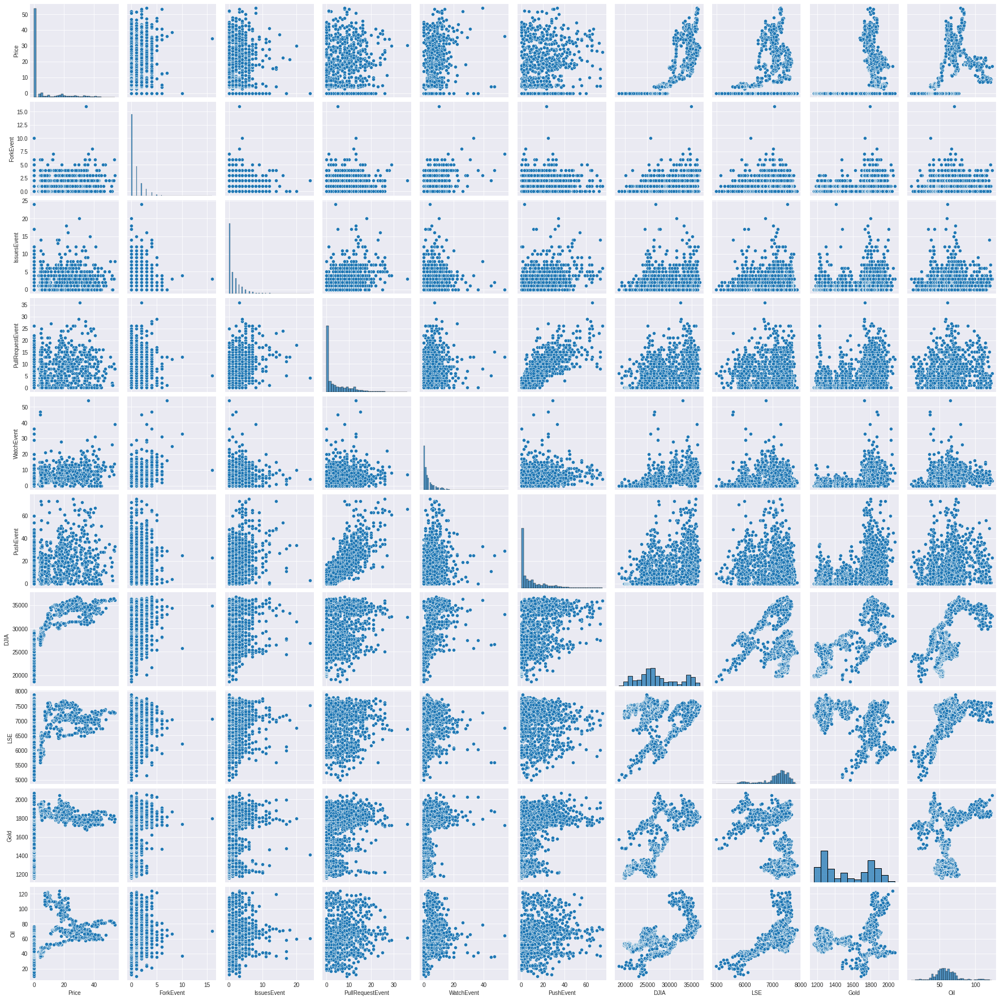

In [ ]:
# generating a pariplot of Polkadot dataset to see the correlationships between all the variables
sns.pairplot(data=dotstamp)

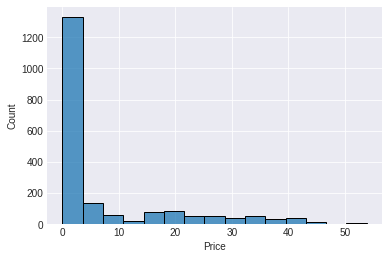

In [ ]:
# Distribution of the Polkadot price in the dataset
sns.histplot(x='Price',bins=15,data=dotstamp)

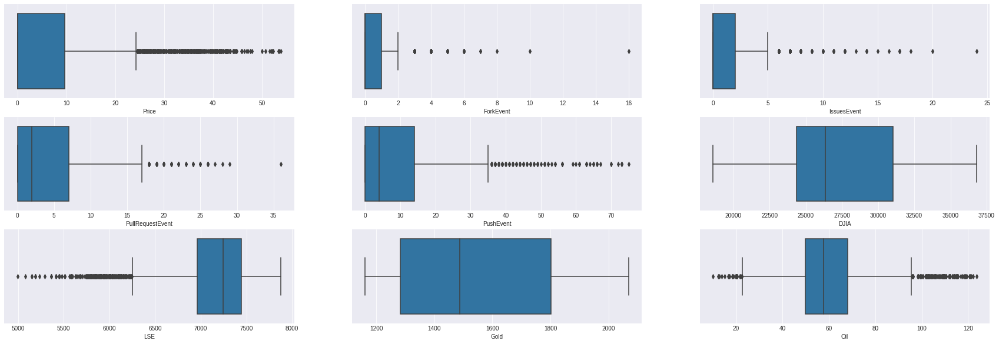

In [ ]:
# Drawing barplots of the features to see outliers

fig, axs = plt.subplots(3, 3, figsize=(30, 10), sharey=True)
sns.boxplot(x=dotstamp['Price'], data=dotstamp, ax=axs[0,0])
sns.boxplot(x=dotstamp['ForkEvent'], data=dotstamp, ax=axs[0,1])
sns.boxplot(x=dotstamp['IssuesEvent'], data=dotstamp, ax=axs[0,2])
sns.boxplot(x=dotstamp['PullRequestEvent'], data=dotstamp, ax=axs[1,0])
sns.boxplot(x=dotstamp['PushEvent'], data=dotstamp, ax=axs[1,1])
sns.boxplot(x=dotstamp['DJIA'], data=dotstamp, ax=axs[1,2])
sns.boxplot(x=dotstamp['LSE'], data=dotstamp, ax=axs[2,0])
sns.boxplot(x=dotstamp['Gold'], data=dotstamp, ax=axs[2,1])
sns.boxplot(x=dotstamp['Oil'], data=dotstamp, ax=axs[2,2])

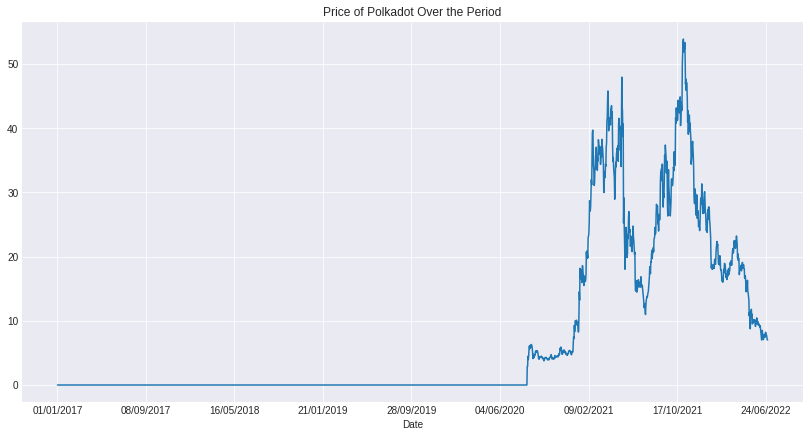

In [ ]:
# Some data analysis
dotstamp.set_index("Date").Price.plot(figsize=(14,7), title="Price of Polkadot Over the Period")

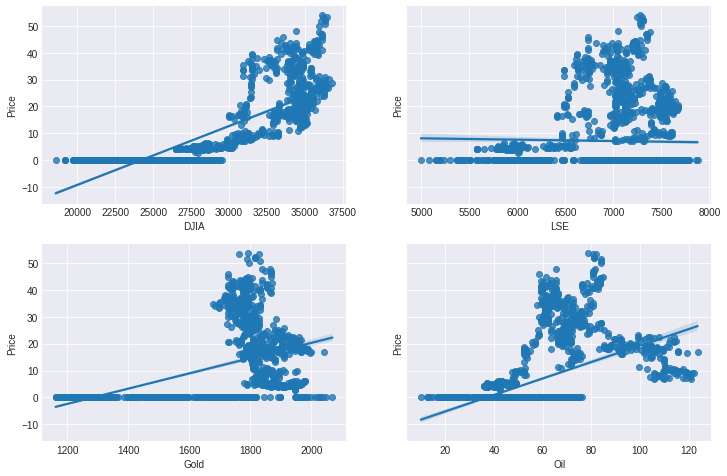

In [ ]:
# I find DJIA, LSE, Gold and Oil Interesting so lets chek their impact on Polkadot price

fig, axs = plt.subplots(2, 2, figsize=(12, 8), sharey=True)
sns.regplot(x=dotstamp['DJIA'], y=dotstamp['Price'], ax=axs[0, 0])
sns.regplot(x=dotstamp['LSE'], y=dotstamp['Price'], ax=axs[0, 1])
sns.regplot(x=dotstamp['Gold'], y=dotstamp['Price'], ax=axs[1, 0])
sns.regplot(x=dotstamp['Oil'], y=dotstamp['Price'], ax=axs[1, 1])

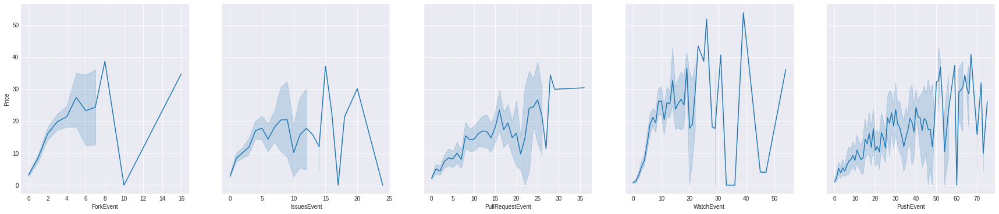

In [ ]:
# Lets have a look at the relationships of
# ForkEvent	IssuesEvent	PullRequestEvent	WatchEvent	PushEvent	against price by lineplots

fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(ncols=5, sharey=True, figsize=(30,6))
sns.lineplot(x=dotstamp['ForkEvent'], y=dotstamp['Price'], ax=ax1)
sns.lineplot(x=dotstamp['IssuesEvent'], y=dotstamp['Price'], ax=ax2)
sns.lineplot(x=dotstamp['PullRequestEvent'], y=dotstamp['Price'], ax=ax3)
sns.lineplot(x=dotstamp['WatchEvent'], y=dotstamp['Price'], ax=ax4)
sns.lineplot(x=dotstamp['PushEvent'], y=dotstamp['Price'], ax=ax5)

Text(0.5, 1.0, '1-Month Lag')

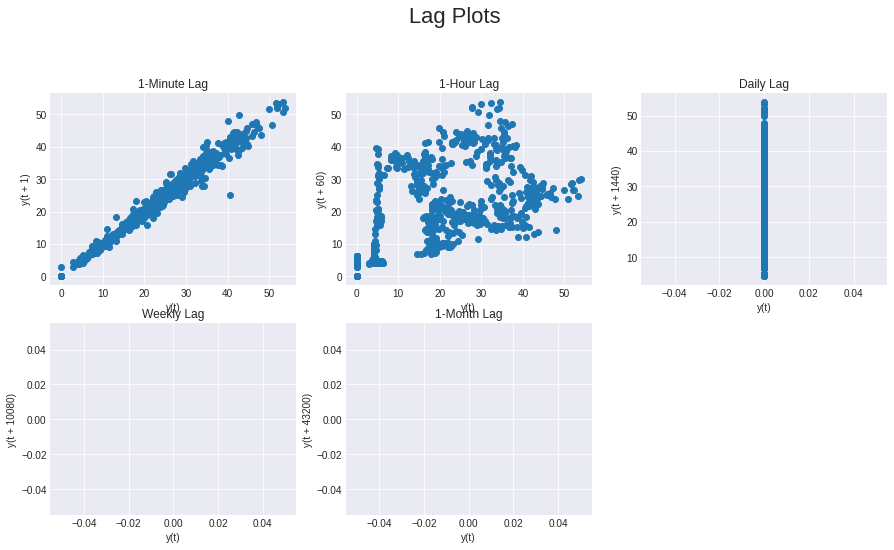

In [ ]:
# Since we are working with time series data let's do some lag plots

#daily, weekly, monthly these can't be plotted

plt.figure(figsize=(15,12))
plt.suptitle('Lag Plots', fontsize=22)

plt.subplot(3,3,1)
pd.plotting.lag_plot(dotstamp['Price'], lag=1) #minute lag
plt.title('1-Minute Lag')

plt.subplot(3,3,2)
pd.plotting.lag_plot(dotstamp['Price'], lag=60) #hourley lag
plt.title('1-Hour Lag')

plt.subplot(3,3,3)
pd.plotting.lag_plot(dotstamp['Price'], lag=1440) #Daily lag
plt.title('Daily Lag')

plt.subplot(3,3,4)
pd.plotting.lag_plot(dotstamp['Price'], lag=10080) #weekly lag
plt.title('Weekly Lag')

plt.subplot(3,3,5)
pd.plotting.lag_plot(dotstamp['Price'], lag=43200) #month lag
plt.title('1-Month Lag')

### Stationarity Check

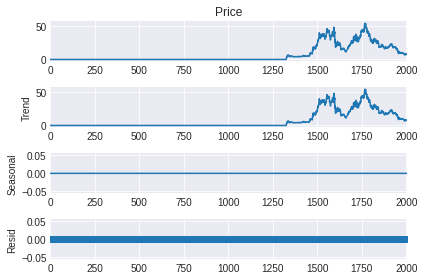

<Figure size 1080x864 with 0 Axes>

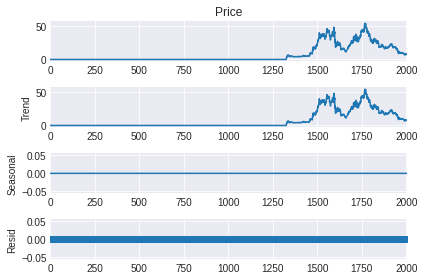

In [ ]:
plt.figure(figsize=(15,12))
series = dotstamp.Price
result = seasonal_decompose(series, model='additive',period=1)
result.plot()

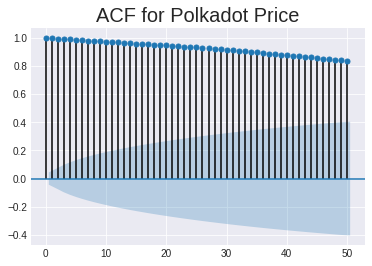

In [ ]:
acf = plot_acf(series, lags=50, alpha=0.05)
plt.title("ACF for Polkadot Price", size=20)
plt.show()

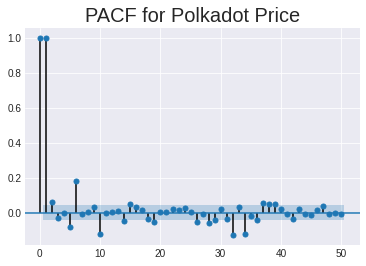

In [ ]:
plot_pacf(series, lags=50, alpha=0.05, method='ols')
plt.title("PACF for Polkadot Price", size=20)
plt.show()

#### KPSS Test

In [ ]:
# Null hypothesis = Series is Stationary
# Alternative Hypothesis - Series is not Stationary

stats, p, lags, critical_values = kpss(series, 'ct')

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1875: FutureWarning: The behavior of using nlags=None will change in release 0.13.Currently nlags=None is the same as nlags="legacy", and so a sample-size lag length is used. After the next release, the default will change to be the same as nlags="auto" which uses an automatic lag length selection method. To silence this warning, either use "auto" or "legacy"
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1907: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warn_msg.format(direction="smaller"), InterpolationWarning


In [ ]:
print(f'Test Statistics : {stats}')
print(f'p-value : {p}')
print(f'Critical Values : {critical_values}')

if p < 0.05:
    print('Series is not Stationary')
else:
    print('Series is Stationary')

Test Statistics : 0.7524439979302527
p-value : 0.01
Critical Values : {'10%': 0.119, '5%': 0.146, '2.5%': 0.176, '1%': 0.216}
Series is not Stationary


#### ADF Test

In [ ]:
result = adfuller(series)

In [ ]:
print(f'Test Statistics : {result[0]}')
print(f'p-value : {result[1]}')
print(f'Critical Values : {result[4]}')
print(f'Lags : {result[5]}')

if result[1] > 0.05:
    print('Series is not Stationary')
else:
    print('Series is Stationary')

Test Statistics : -1.7495758426089019
p-value : 0.405767326250849
Critical Values : {'1%': -3.433643643742798, '5%': -2.862994949652858, '10%': -2.5675445538118042}
Lags : 5410.4385374152225
Series is not Stationary


### Feature Engineering

In [ ]:
# We can extract important features from the Date column
# first we need to convert the Date to datetime format
dotstamp['Date'] = pd.to_datetime(dotstamp['Date'])
dotstamp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2007 entries, 0 to 2006
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Date              2007 non-null   datetime64[ns]
 1   Price             2007 non-null   float64       
 2   ForkEvent         2007 non-null   int64         
 3   IssuesEvent       2007 non-null   int64         
 4   PullRequestEvent  2007 non-null   int64         
 5   WatchEvent        2007 non-null   int64         
 6   PushEvent         2007 non-null   int64         
 7   DJIA              2007 non-null   float64       
 8   LSE               2007 non-null   float64       
 9   Gold              2007 non-null   float64       
 10  Oil               2007 non-null   float64       
dtypes: datetime64[ns](1), float64(5), int64(5)
memory usage: 172.6 KB


In [ ]:
# Creation of the features and adding them to the dataset
dotstamp["year"] = dotstamp.Date.dt.year
dotstamp["month"] = dotstamp.Date.dt.month
dotstamp["day"] = dotstamp.Date.dt.day
dotstamp["day_of_week"] = dotstamp.Date.dt.dayofweek
dotstamp.head()

,Date,Price,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil,year,month,day,day_of_week
0,2017-01-01,0.0,0,0,0,0,0,19762.00,7142.83,1162.0,54.03,2017,1,1,6
1,2017-02-01,0.0,0,0,0,0,0,19762.00,7142.83,1162.0,54.03,2017,2,1,2
2,2017-03-01,0.0,0,0,0,0,0,19881.76,7177.89,1162.0,52.33,2017,3,1,2
3,2017-04-01,0.0,0,0,0,0,0,19942.16,7189.74,1165.3,53.26,2017,4,1,5
4,2017-05-01,0.0,0,0,0,0,0,19899.29,7195.31,1181.3,53.76,2017,5,1,0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  after removing the cwd from sys.path.


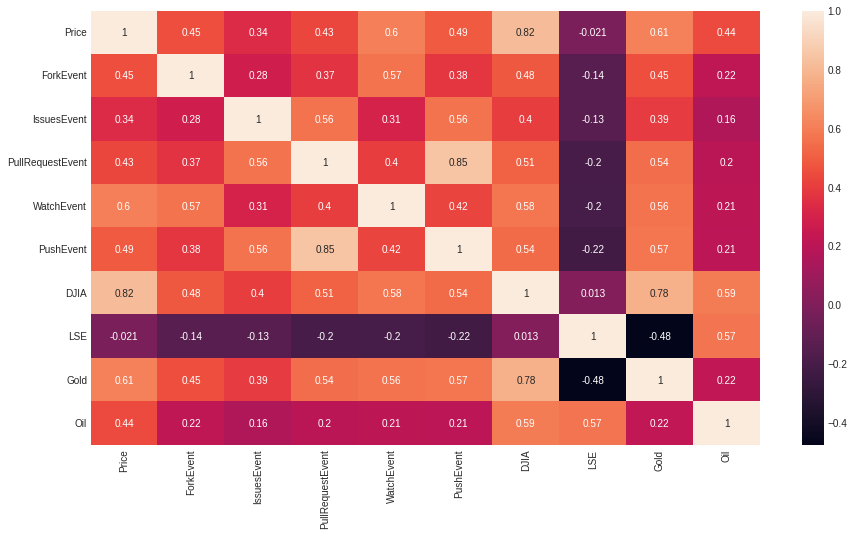

In [ ]:
# Lets have a look at the correlation matrix of all the features (except date)
corr = dotstamp.drop(columns=['Date','year','month','day','day_of_week'])
corr = corr.corr()
corr.style.background_gradient(cmap='PuOr_r').set_precision(2)
plt.figure(figsize=(15,8))
sns.heatmap(corr, annot=True)

### Data Preparation

In [ ]:
# we need to split our data into train and test sets
# the first step we are taking price as y and the rest of the features as X
X = dotstamp.drop(columns=['Price','Date'])
y = dotstamp['Price']
X.head()

,ForkEvent,IssuesEvent,PullRequestEvent,WatchEvent,PushEvent,DJIA,LSE,Gold,Oil,year,month,day,day_of_week
0,0,0,0,0,0,19762.00,7142.83,1162.0,54.03,2017,1,1,6
1,0,0,0,0,0,19762.00,7142.83,1162.0,54.03,2017,2,1,2
2,0,0,0,0,0,19881.76,7177.89,1162.0,52.33,2017,3,1,2
3,0,0,0,0,0,19942.16,7189.74,1165.3,53.26,2017,4,1,5
4,0,0,0,0,0,19899.29,7195.31,1181.3,53.76,2017,5,1,0


In [ ]:
y.head()

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Price, dtype: float64

In [ ]:
# Then we are splitting the data into training and test sets with a train size of 60%
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, train_size = 0.6)

## XGBoost

In [ ]:
# creating the regressor model
reg = xgb.XGBRegressor()

In [ ]:
## Hyper Parameter Optimization Grid

params={
 "learning_rate"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30],
 "max_depth"        : [1, 3, 4, 5, 6, 7],
 "n_estimators"     : [int(x) for x in np.linspace(start=100, stop=2000, num=10)],
 "min_child_weight" : [int(x) for x in np.arange(3, 15, 1)],
 "gamma"            : [ 0.0, 0.1, 0.2 , 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1],
 "subsample"        : [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1],
 "colsample_bytree" : [0.5, 0.6, 0.7, 0.8, 0.9, 1],
 "colsample_bylevel": [0.5, 0.6, 0.7, 0.8, 0.9, 1],  
 
}

In [ ]:
# Model with the grid search parameters
model  = RandomizedSearchCV(    
                reg,
                param_distributions=params,
                n_iter=10,
                n_jobs=-1,
                cv=5,
                verbose=3,
)

In [ ]:
# fitting the model
model.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[16:06:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


RandomizedSearchCV(cv=5, estimator=XGBRegressor(), n_jobs=-1,
                   param_distributions={'colsample_bylevel': [0.5, 0.6, 0.7,
                                                              0.8, 0.9, 1],
                                        'colsample_bytree': [0.5, 0.6, 0.7, 0.8,
                                                             0.9, 1],
                                        'gamma': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5,
                                                  0.6, 0.7, 0.8, 0.9, 1],
                                        'learning_rate': [0.05, 0.1, 0.15, 0.2,
                                                          0.25, 0.3],
                                        'max_depth': [1, 3, 4, 5, 6, 7],
                                        'min_child_weight': [3, 4, 5, 6, 7, 8,
                                                             9, 10, 11, 12, 13,
                                                             14],
                                

In [ ]:
# evaluation of the model on train and test sets of data
y_train_pred_xgb = model.predict(X_train)

xgb_train_mae = mean_absolute_error(y_train, y_train_pred_xgb)
xgb_train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred_xgb))
xgb_train_mape = mean_absolute_percentage_error(y_train, y_train_pred_xgb)
xgb_train_r2 = r2_score(y_train, y_train_pred_xgb)

print(f"Train MAE XGBoost on Polkadot Dataset: {xgb_train_mae}")
print(f"Train MAPE XGBoost on Polkadot Dataset: {xgb_train_mape}")
print(f"Train RMSE XGBoost on Polkadot Dataset: {xgb_train_rmse}")
print(f"Train R2 XGBoost on Polkadot Dataset: {xgb_train_r2}")

Train MAE XGBoost on Polkadot Dataset: 0.23903678894637032
Train MAPE XGBoost on Polkadot Dataset: 238573456924535.9
Train RMSE XGBoost on Polkadot Dataset: 0.46787237249096875
Train R2 XGBoost on Polkadot Dataset: 0.9986196790891365


In [ ]:
y_test_pred_xgb = model.predict(X_test)

test_mae_xgb = mean_absolute_error(y_test, y_test_pred_xgb)
test_mape_xgb = mean_absolute_percentage_error(y_test, y_test_pred_xgb)
test_rmse_xgb = np.sqrt(mean_squared_error(y_test, y_test_pred_xgb))
test_r2_xgb = r2_score(y_test, y_test_pred_xgb)

print(f"Test MAE of XGBoost on Polkadot Dataset: {test_mae_xgb}")
print(f"Test MAPE of XGBoost on Polkadot Dataset: {test_mape_xgb}")
print(f"Test RMSE of XGBoost on Polkadot Dataset: {test_rmse_xgb}")
print(f"Test R2 XGBoost on Polkadot Dataset: {test_r2_xgb}")

Test MAE of XGBoost on Polkadot Dataset: 0.8468567564315249
Test MAPE of XGBoost on Polkadot Dataset: 378762842435068.8
Test RMSE of XGBoost on Polkadot Dataset: 2.0205444437813833
Test R2 XGBoost on Polkadot Dataset: 0.9715637510773631


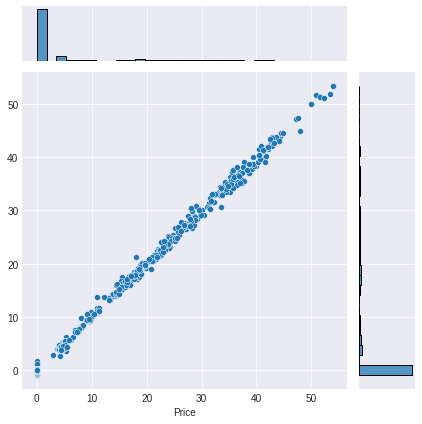

In [ ]:
# True vs Predicted plot of XGB model on the Train and Test data
sns.jointplot(x=y_train, y=y_train_pred_xgb)

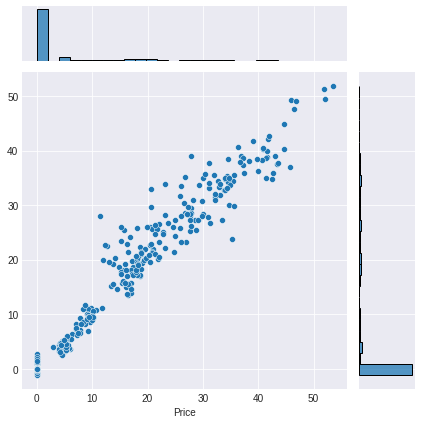

In [ ]:
sns.jointplot(x=y_test, y=y_test_pred_xgb)

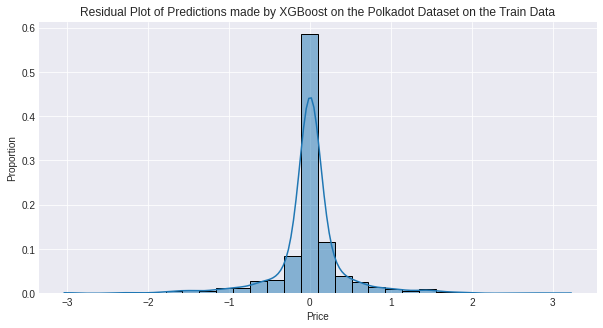

In [ ]:
#Residual Plots of Train and Test sets of xgb Model
plt.figure(figsize=(10,5))
plt.title("Residual Plot of Predictions made by XGBoost on the Polkadot Dataset on the Train Data")
residuals_df = y_train_pred_xgb - y_train
sns.histplot(x = residuals_df, kde=True, stat='proportion', bins=30)

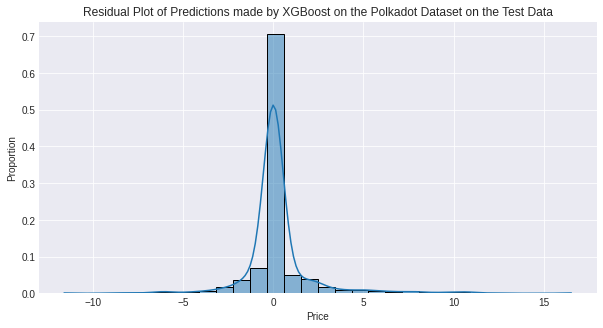

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Residual Plot of Predictions made by XGBoost on the Polkadot Dataset on the Test Data")
residuals_df = y_test_pred_xgb - y_test
sns.histplot(x = residuals_df, kde=True, stat='proportion', bins=30)

## Random Forest

In [ ]:
# create regressor object
rf_reg = RandomForestRegressor()
  
# fit the regressor with x and y data
rf_reg.fit(X_train, y_train) 

RandomForestRegressor()

In [ ]:
# evaluation of the model on train and test sets of data
y_train_pred_rf = rf_reg.predict(X_train)

rf_train_mae = mean_absolute_error(y_train, y_train_pred_rf)
rf_train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred_rf))
rf_train_mape = mean_absolute_percentage_error(y_train, y_train_pred_rf)
rf_train_r2 = r2_score(y_train, y_train_pred_rf)

print(f"Train MAE Random Forest Regressor on Polkadot Dataset: {rf_train_mae}")
print(f"Train MAPE Random Forest Regressor on Polkadot Dataset: {rf_train_mape}")
print(f"Train RMSE Random Forest Regressor on Polkadot Dataset: {rf_train_rmse}")
print(f"Train R2 Random Forest Regressor on Polkadot Dataset: {rf_train_r2}")

Train MAE Random Forest Regressor on Polkadot Dataset: 0.2662719269102987
Train MAPE Random Forest Regressor on Polkadot Dataset: 34272991649289.81
Train RMSE Random Forest Regressor on Polkadot Dataset: 0.697392604194639
Train R2 Random Forest Regressor on Polkadot Dataset: 0.9969332389434847


In [ ]:
y_test_pred_rf = rf_reg.predict(X_test)

test_mae_rf = mean_absolute_error(y_test, y_test_pred_rf)
test_mape_rf = mean_absolute_percentage_error(y_test, y_test_pred_rf)
test_rmse_rf = np.sqrt(mean_squared_error(y_test, y_test_pred_rf))
test_r2_rf = r2_score(y_test, y_test_pred_rf)

print(f"Test MAE of Random Forest Regressor on Polkadot Dataset: {test_mae_rf}")
print(f"Test MAPE of Random Forest Regressor on Polkadot Dataset: {test_mape_rf}")
print(f"Test RMSE of Random Forest Regressor on Polkadot Dataset: {test_rmse_rf}")
print(f"Test R2 Random Forest Regressor on Polkadot Dataset: {test_r2_rf}")

Test MAE of Random Forest Regressor on Polkadot Dataset: 0.7417528019925287
Test MAPE of Random Forest Regressor on Polkadot Dataset: 115836732682126.42
Test RMSE of Random Forest Regressor on Polkadot Dataset: 1.9947018257652163
Test R2 Random Forest Regressor on Polkadot Dataset: 0.9722864945658202


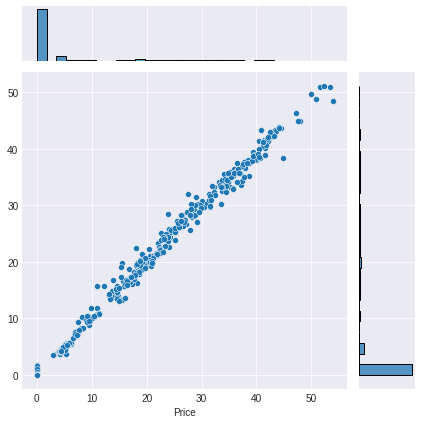

In [ ]:
# True vs Predicted plot of RF model on the Train and Test data
sns.jointplot(x=y_train, y=y_train_pred_rf)

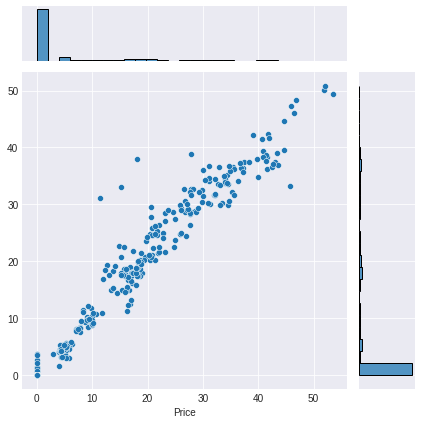

In [ ]:
# True vs Predicted plot of RF model on the Train and Test data
sns.jointplot(x=y_test, y=y_test_pred_rf)

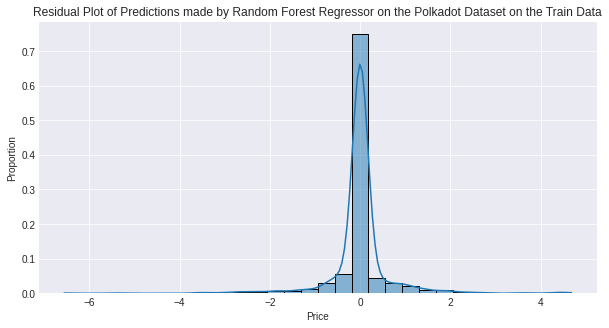

In [ ]:
#Residual Plots of Train and Test sets of RF Model
plt.figure(figsize=(10,5))
plt.title("Residual Plot of Predictions made by Random Forest Regressor on the Polkadot Dataset on the Train Data")
residuals_df = y_train_pred_rf - y_train
sns.histplot(x = residuals_df, kde=True, stat='proportion', bins=30)

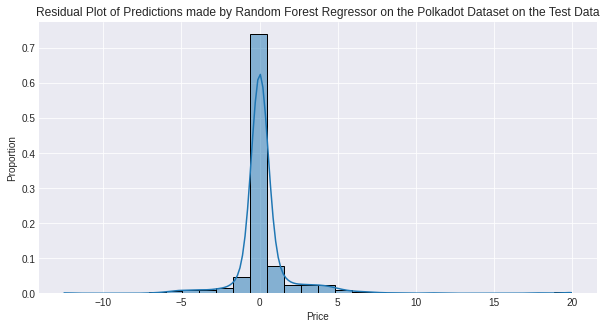

In [ ]:
#Residual Plots of Train and Test sets of RF Model
plt.figure(figsize=(10,5))
plt.title("Residual Plot of Predictions made by Random Forest Regressor on the Polkadot Dataset on the Test Data")
residuals_df = y_test_pred_rf - y_test
sns.histplot(x = residuals_df, kde=True, stat='proportion', bins=30)

## Summary of Results

In [ ]:
# Summarisation of the Model Results
models = ['XGBoost','Random Forest Regressor']
mae = [test_mae_xgb, test_mae_rf]
rmse = [test_rmse_xgb, test_rmse_rf]
mape = [test_mape_xgb, test_mape_rf]
r2 = [test_r2_xgb, test_r2_rf]

In [ ]:
# Creating a dictionary to store the results 
d = {'Models':models, 'MAE':mae, 'MAPE':mape, 'RMSE':rmse, 'R2-Score':r2}

# using that dictionary to create a dataframe of the results to display as a table
result = pd.DataFrame(d)
result

,Models,MAE,MAPE,RMSE,R2-Score
0,XGBoost,0.846857,3.787628e+14,2.020544,0.971564
1,Random Forest Regressor,0.741753,1.158367e+14,1.994702,0.972286


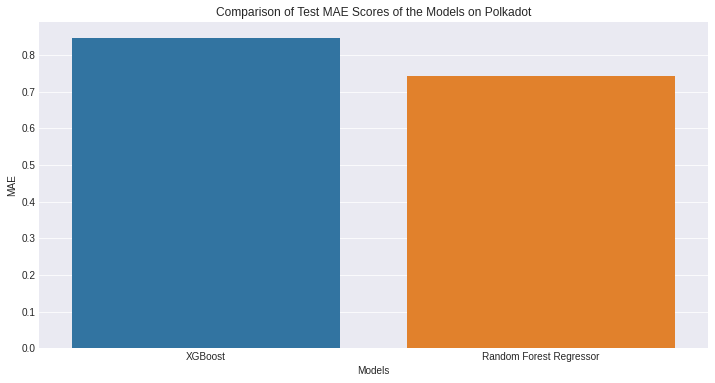

In [ ]:
# Displaying the models MAE values as a bar plot
plt.figure(figsize=(12,6))
plt.title("Comparison of Test MAE Scores of the Models on Polkadot")
sns.barplot(x="Models", y="MAE", data=result, ci=None)

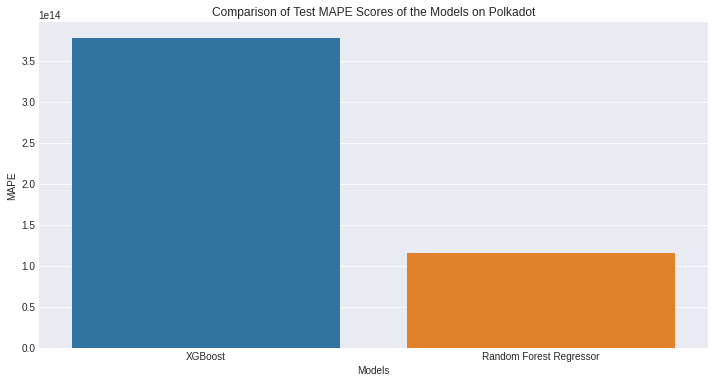

In [ ]:
# comparison of MAPE values of the models on the test set
plt.figure(figsize=(12,6))
plt.title("Comparison of Test MAPE Scores of the Models on Polkadot")
sns.barplot(x="Models", y="MAPE", data=result, ci=None)